In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.visualization import astropy_mpl_style
plt.style.use(astropy_mpl_style)
from astropy.utils.data import get_pkg_data_filename
from astropy.io import fits
import scipy as sp
from scipy.io import readsav
from scipy import interpolate
from scipy import signal
import scipy.optimize as opt
import PyMieScatt as ps
#!pip show PyMieScatt


003CM_1511793703_1.sav 126220


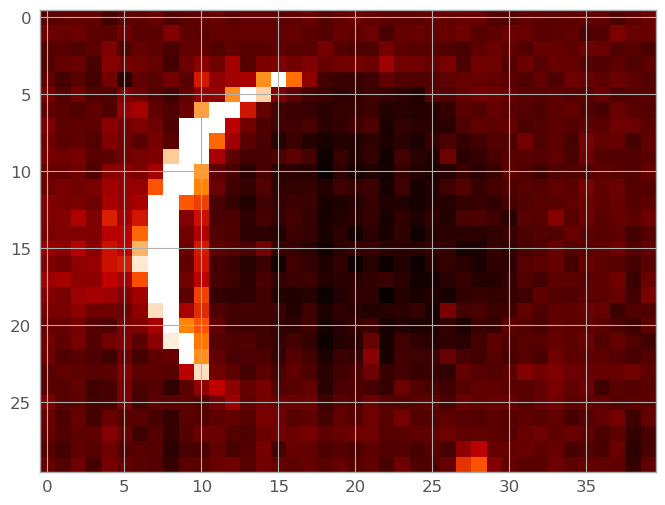

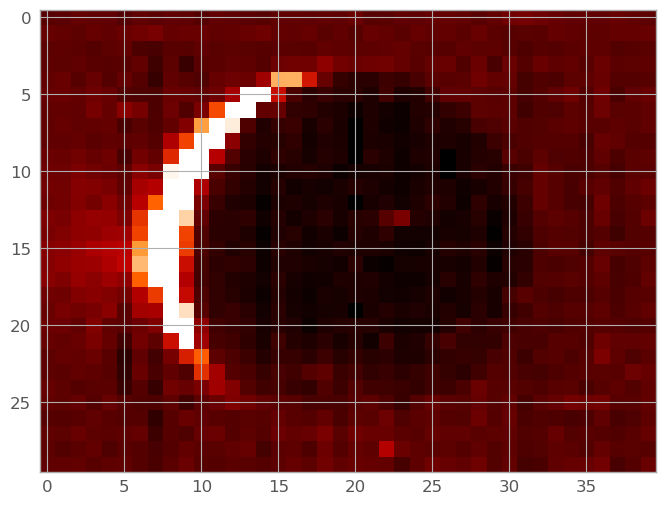

003CM_1511794087_1.sav 126872


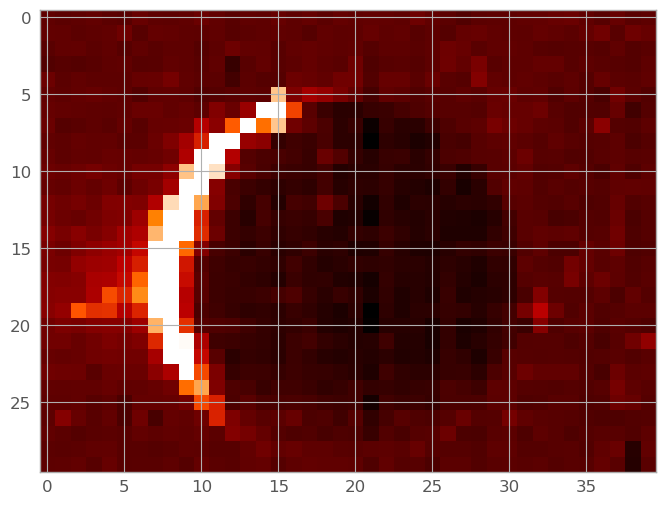

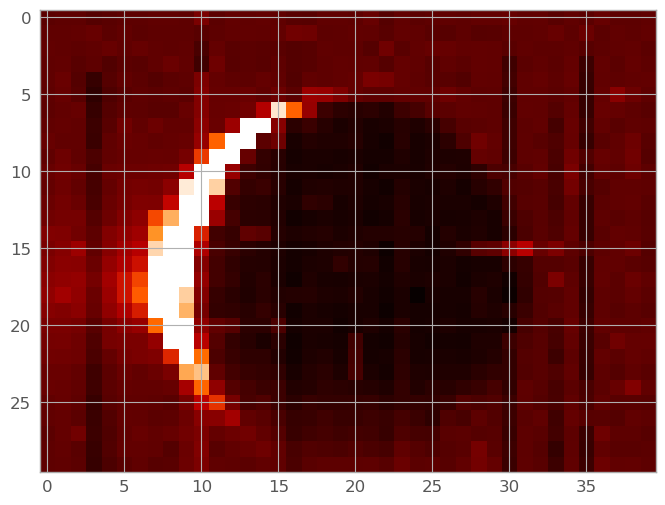

003CM_1511794976_1.sav 128375


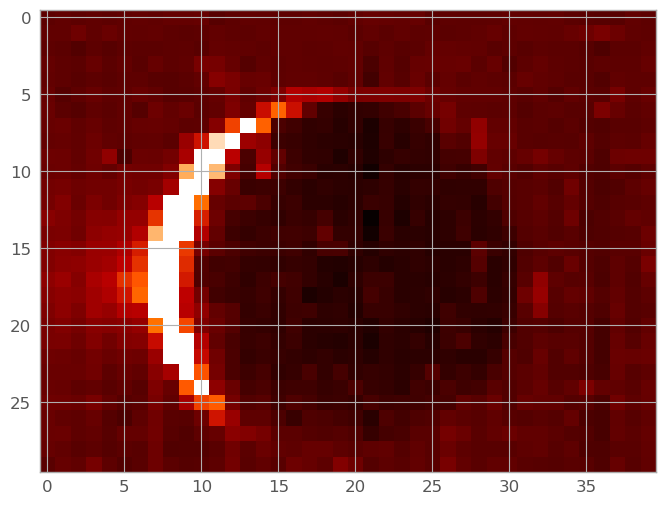

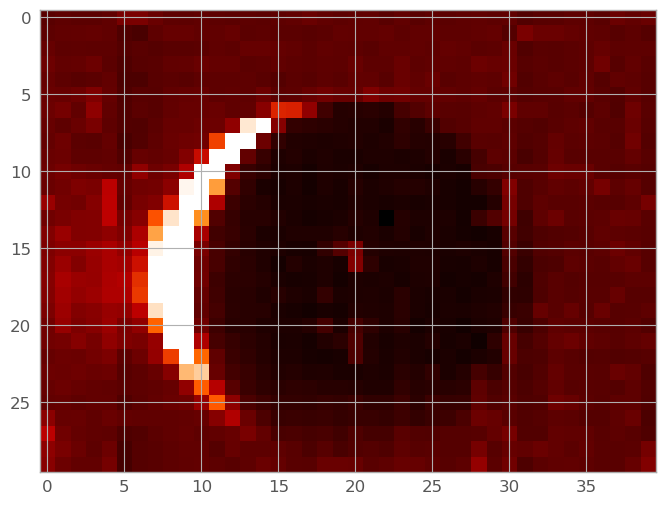

003CM_1511795691_1.sav 129570


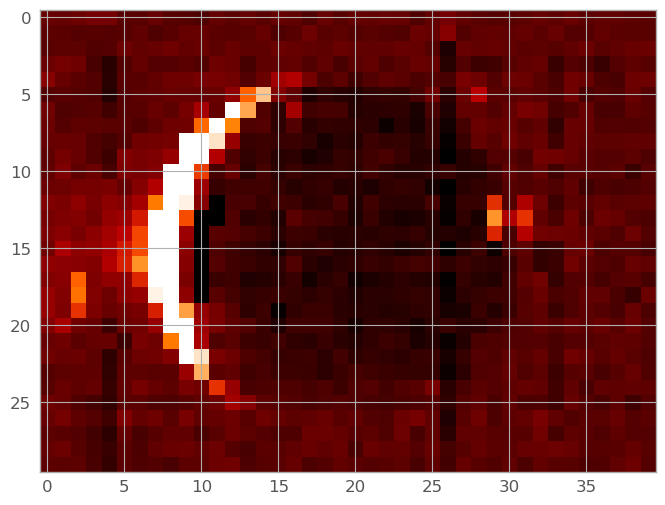

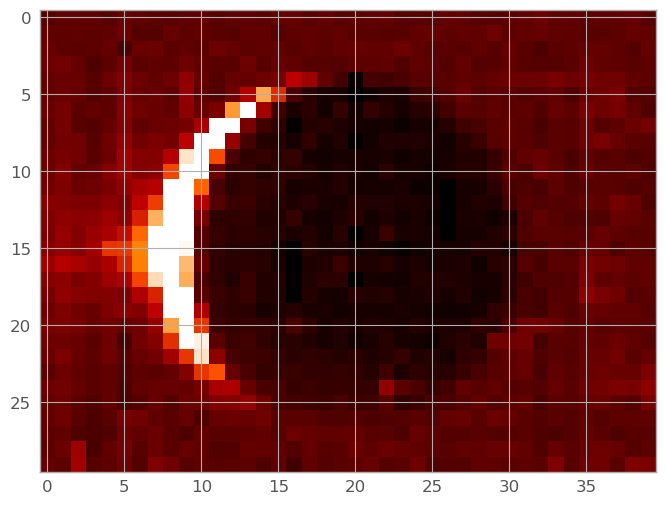

003CM_1511795992_1.sav 130071


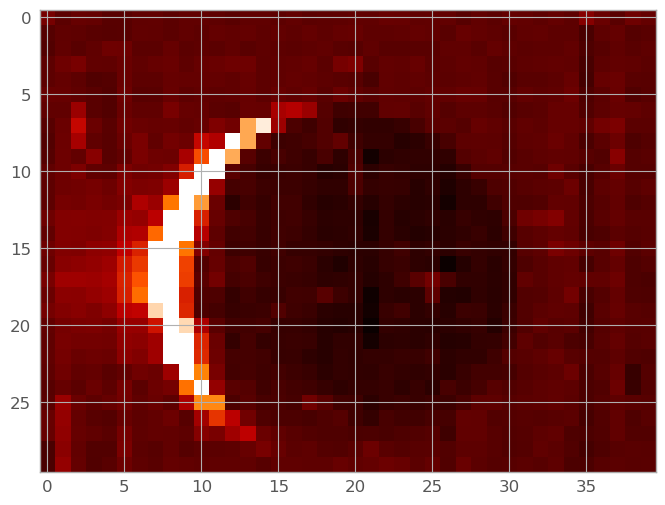

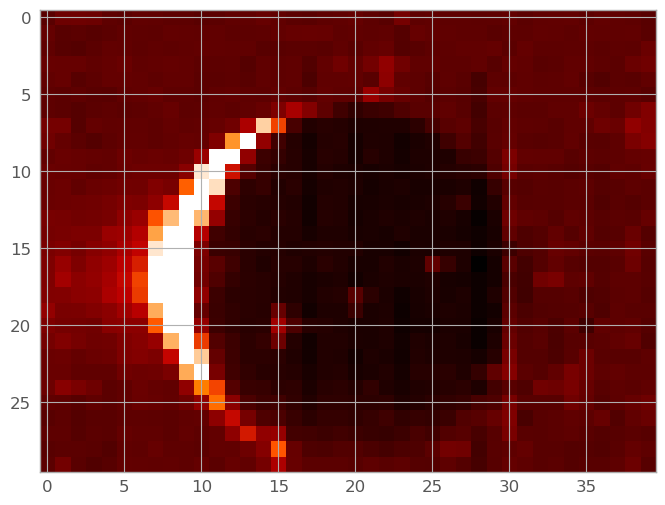

003CM_1511796659_1.sav 131177


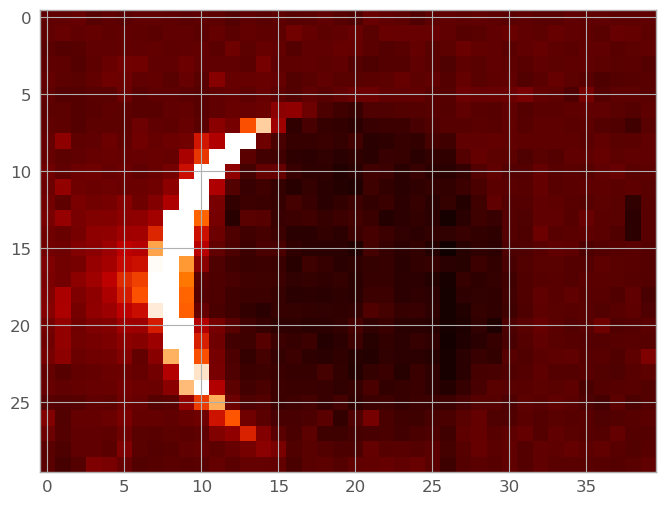

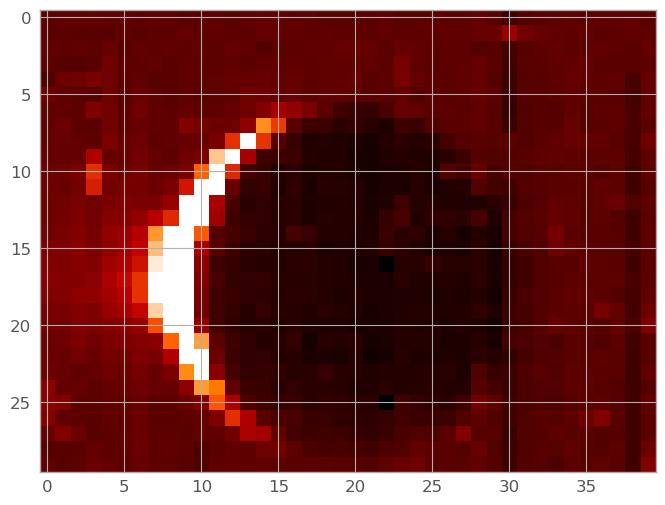

003CM_1511797548_1.sav 132647


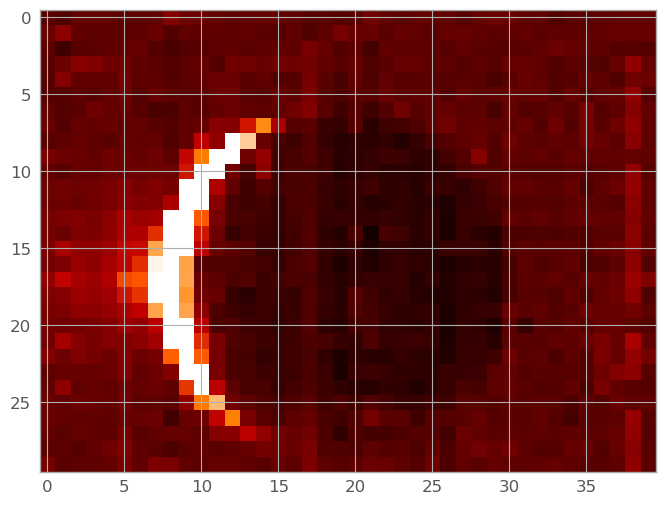

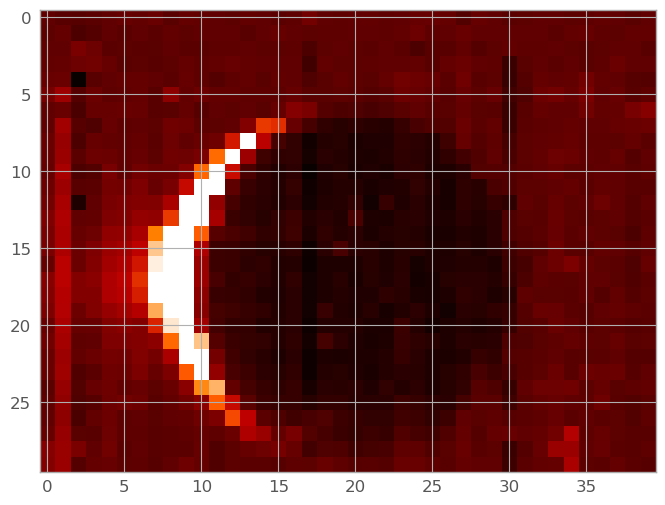

003CM_1511798077_1.sav 133523


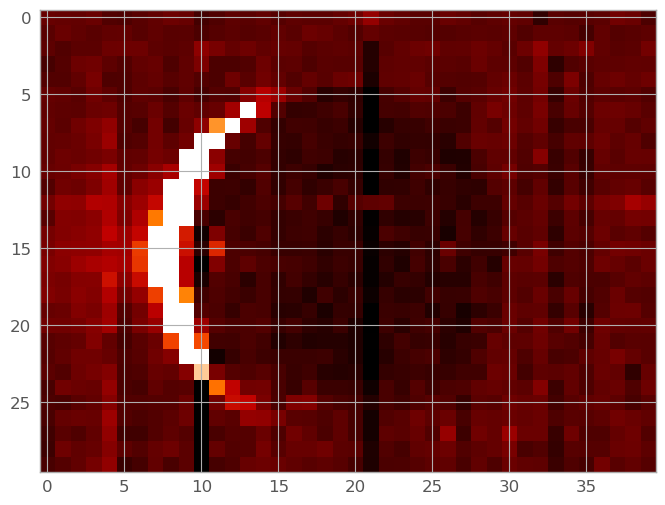

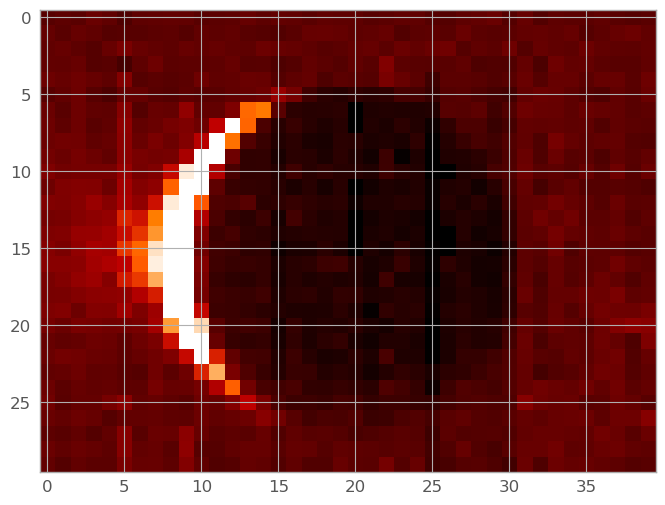

003CM_1511798376_1.sav 134019


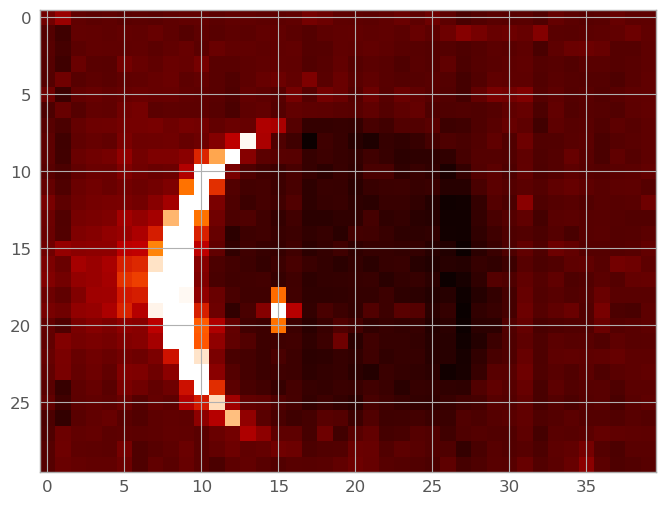

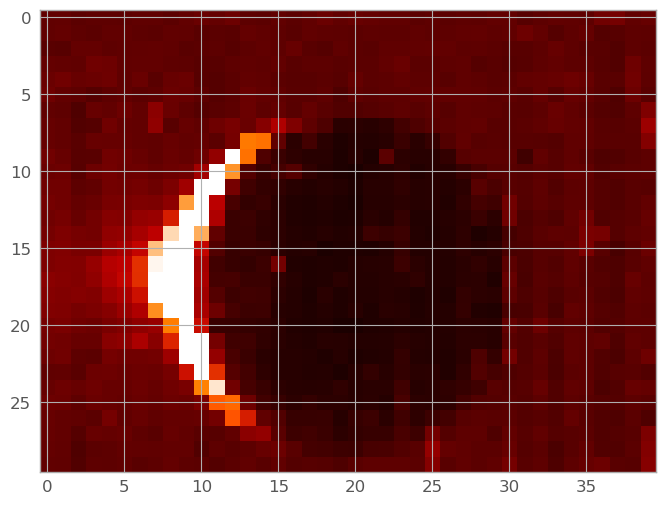

003CM_1511799464_1.sav 135843


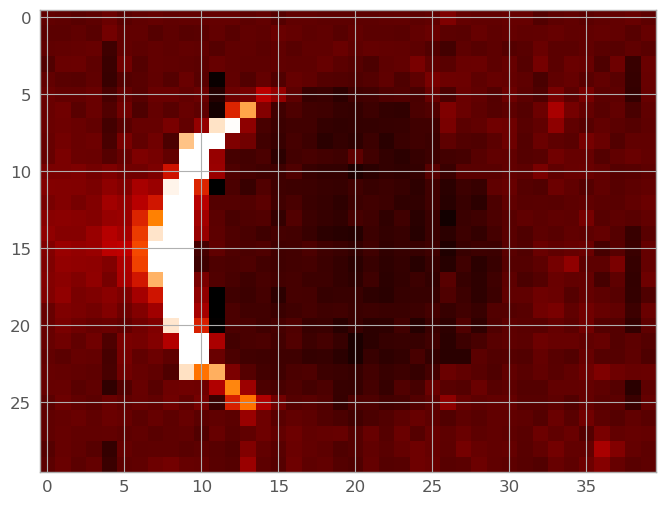

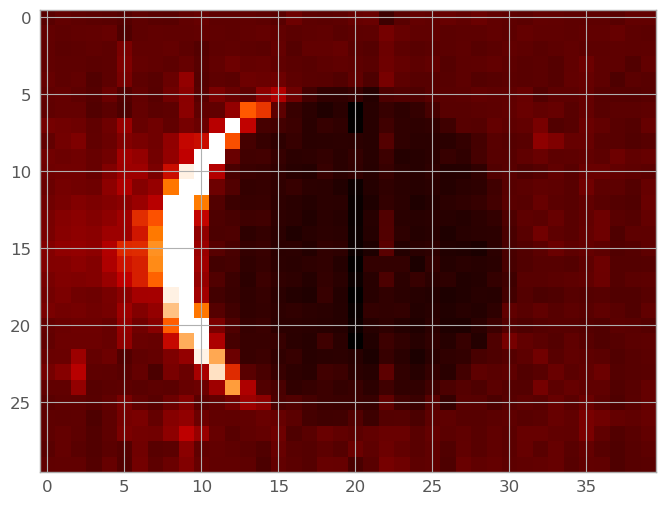

003CM_1511799891_1.sav 136569


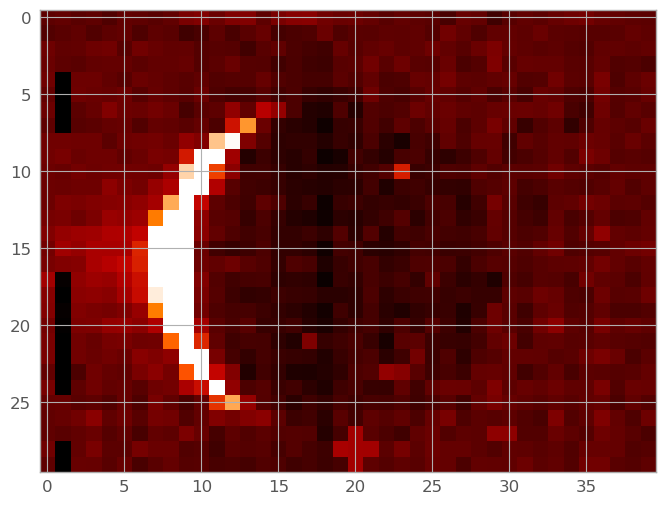

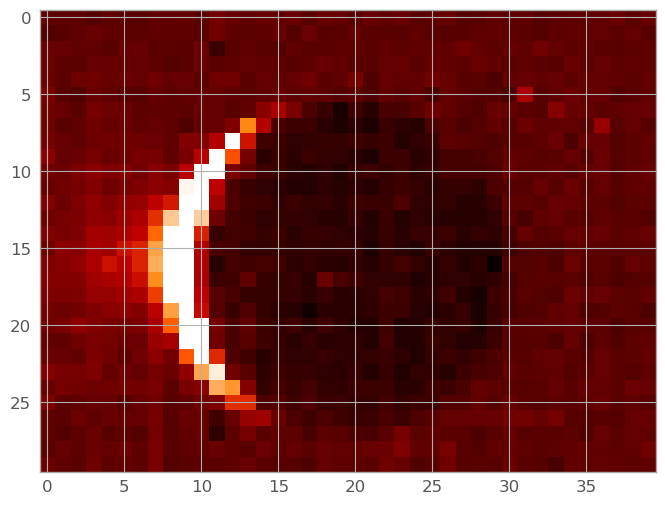

010CM_1511800181_1.sav 137068


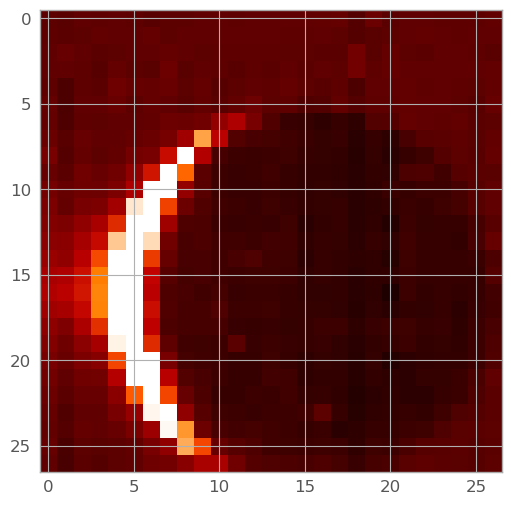

010CM_1511800741_1.sav 138045


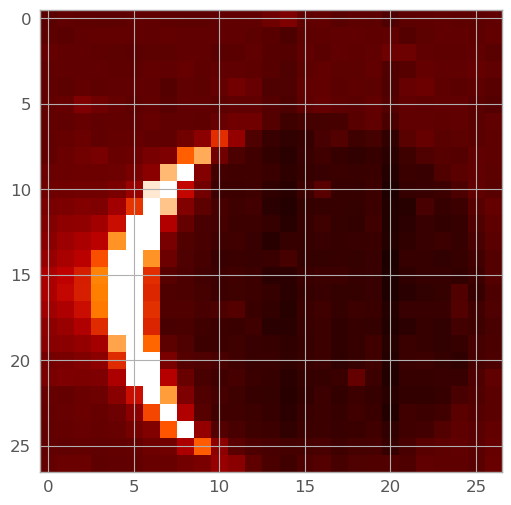

001CM_1511801493_1.sav 139392


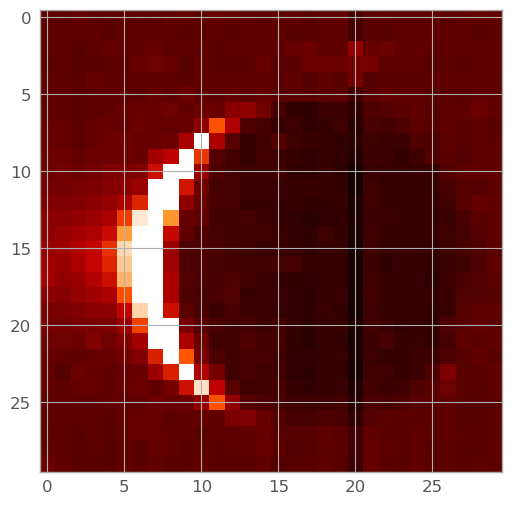

001CM_1511802247_1.sav 140794


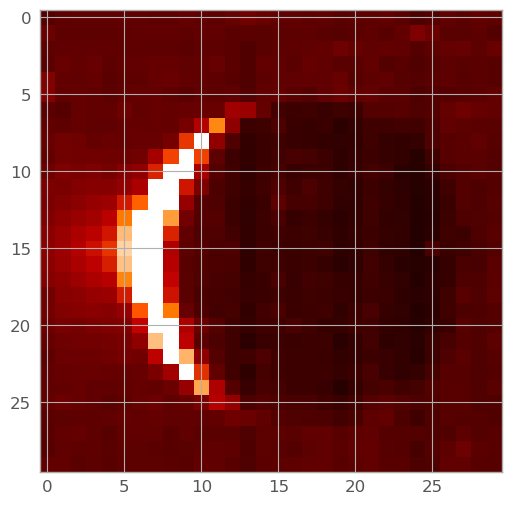

001CM_1511803001_1.sav 142262


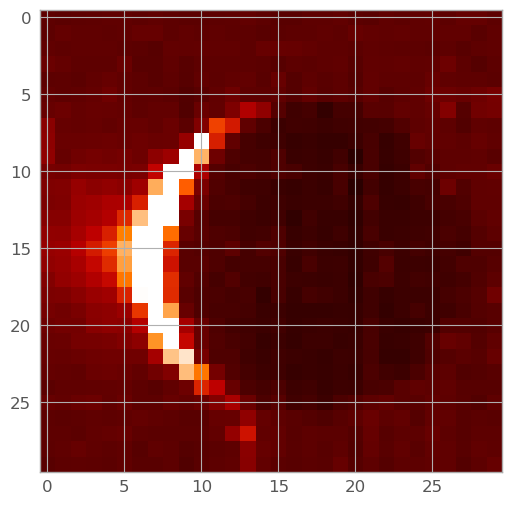

011CM_1511807379_1.sav 152790


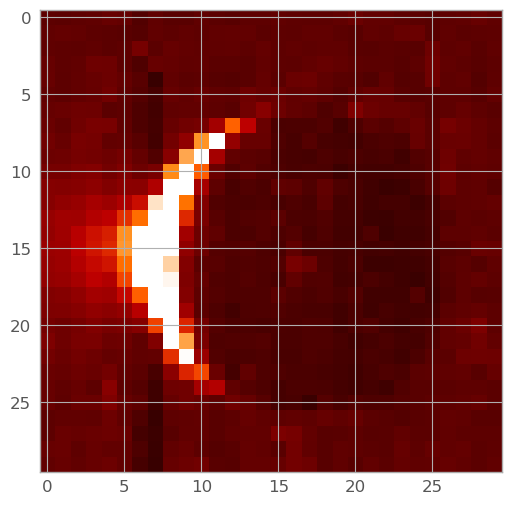

011CM_1511807805_1.sav 154064


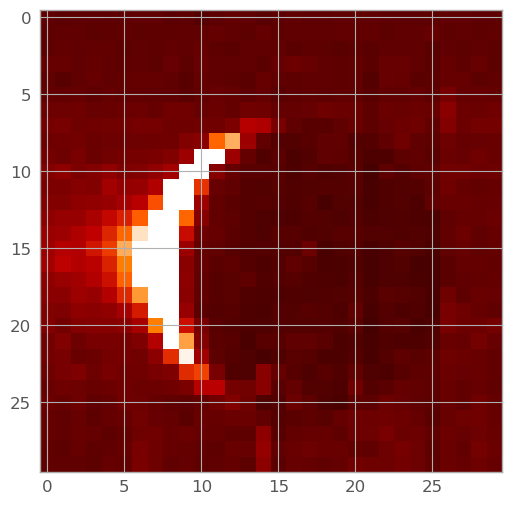

007CM_1511808707_1.sav 156947


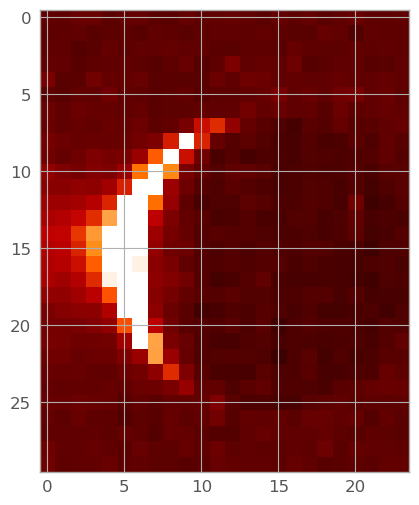

007CM_1511809910_1.sav 161222


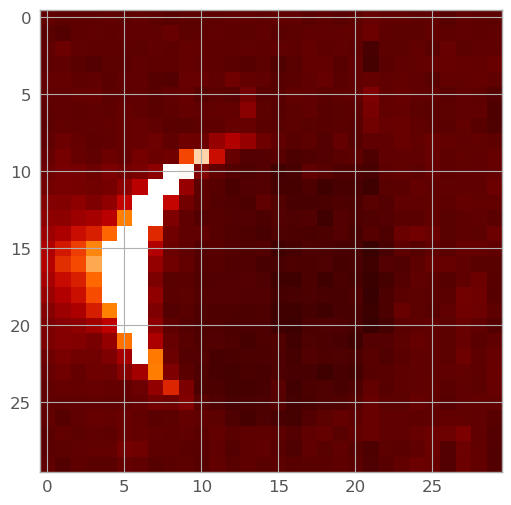

007CM_1511810387_1.sav 163065


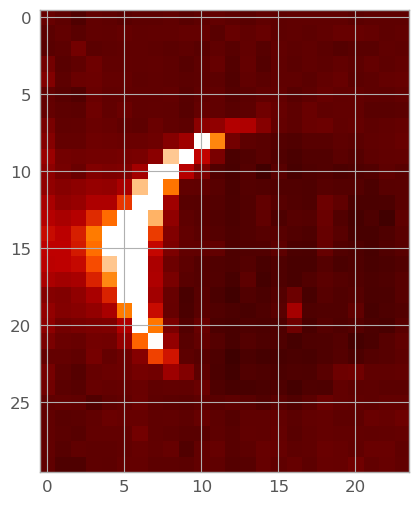

In [2]:
dat=readsav('ENCPLUME_data_update_101521.sav')
l=readsav('lambdav.sav')
wavel=l.lambdav
files003=np.array(['CM_1511793703_1.sav','CM_1511794087_1.sav','CM_1511794976_1.sav','CM_1511795691_1.sav',
         'CM_1511795992_1.sav','CM_1511796659_1.sav','CM_1511797548_1.sav','CM_1511798077_1.sav',
         'CM_1511798376_1.sav','CM_1511799265_1.sav','CM_1511799464_1.sav','CM_1511799891_1.sav'])
exp003=np.array([7.2,16,19, 7.2,19,16, 13,7.2,16,4.4,11,7.2])
files010=np.array(['CM_1511800181_1.sav','CM_1511800741_1.sav'])
exp010=np.array([17,17])
files001=np.array(['CM_1511801404_1.sav','CM_1511801493_1.sav','CM_1511802158_1.sav',
                  'CM_1511802247_1.sav','CM_1511802912_1.sav','CM_1511803001_1.sav'])
exp001=np.array([2.4,19,2.4,19,2.4,19])
files011=np.array(['CM_1511807379_1.sav','CM_1511807805_1.sav','CM_1511808485_1.sav'])
exp011=np.array([12,19,1.2])
files007=np.array(['CM_1511808551_1.sav','CM_1511808707_1.sav','CM_1511809066_1.sav','CM_1511809439_1.sav',
         'CM_1511809666_1.sav','CM_1511809910_1.sav','CM_1511810387_1.sav','CM_1511810735_1.sav',
         'CM_1511810807_1.sav','CM_1511810879_1.sav'])
exp007=np.array([0,7.7,5.4,5.4,5.3,12,9.6,0,0,0])
files003=files003[(exp003>7)]
files010=files010[(exp010>7)]
files001=files001[(exp001>7)]
files011=files011[(exp011>7)]
files007=files007[(exp007>7)]
range003=np.array([126425,127581,128901,129771,130593,131869,133003,133723,134718,135633,136157,136776])
range010=np.array([137524,138511])
range001=np.array([139309,139974,140708,141402,142170,142901])
range011=np.array([153383,155058,156283])
range007=np.array([0,157388,158486,159814,160647,161985,163715,165716,166828,0])
range003=np.array([126220,126872,128375,129570,130071,131177,132647,133523,134019,135506,135843,136569])
range010=np.array([137068,138045])
range001=np.array([139231,139392,140627,140794,142086,142262])
range011=np.array([152790,154064,156213])
range007=np.array([156429,156947,158169,159487,160313,161222,163065,164465,164760,165058])

range003=range003[(exp003>7)]
range010=range010[(exp010>7)]
range001=range001[(exp001>7)]
range011=range011[(exp011>7)]
range007=range007[(exp007>7)]
dat=readsav('S16_ENC/'+files003[0])
wave=dat.wavel
wavei=wave[96:352]


for i in range(len(files003)):
    print('003'+files003[i], range003[i])
    dat=readsav('S16_ENC/'+files003[i])
    qubc=dat.qub[:,0:96,:]
    qubx=np.zeros([len(qubc[:,0,0]),len(qubc[0,:,0]),len(qubc[0,0,:])])
    for j in range(96):
        for k in range(len(qubc[0,0,:])):
            qubx[:,j,k]=qubc[:,j,k]-np.mean(qubc[0:3,j,k])
    plt.imshow(np.mean(qubx[:,0:20,:],axis=1), vmin=-.001,vmax=.003)
    plt.show()
    plt.imshow(np.mean(qubx[:,70:90,:],axis=1), vmin=-.001,vmax=.003)
    plt.show()

for i in range(len(files010)):
    print('010'+files010[i], range010[i])
    dat=readsav('S16_ENC/'+files010[i])
    qubc=dat.qub[:,0:96,:]
    qubx=np.zeros([len(qubc[:,0,0]),len(qubc[0,:,0]),len(qubc[0,0,:])])
    for j in range(96):
        for k in range(len(qubc[0,0,:])):
            qubx[:,j,k]=qubc[:,j,k]-np.mean(qubc[0:3,j,k])
    plt.imshow(np.mean(qubx,axis=1), vmin=-.001,vmax=.003)
    plt.show()

for i in range(len(files001)):
    print('001'+files001[i], range001[i])
    dat=readsav('S16_ENC/'+files001[i])
    qubc=dat.qub[:,0:96,:]
    qubx=np.zeros([len(qubc[:,0,0]),len(qubc[0,:,0]),len(qubc[0,0,:])])
    for j in range(96):
        for k in range(len(qubc[0,0,:])):
            qubx[:,j,k]=qubc[:,j,k]-np.mean(qubc[0:3,j,k])
    plt.imshow(np.mean(qubx,axis=1), vmin=-.001,vmax=.003)
    plt.show()

for i in range(len(files011)):
    print('011'+files011[i], range011[i])
    dat=readsav('S16_ENC/'+files011[i])
    qubc=dat.qub[:,0:96,:]
    qubx=np.zeros([len(qubc[:,0,0]),len(qubc[0,:,0]),len(qubc[0,0,:])])
    for j in range(96):
        for k in range(len(qubc[0,0,:])):
            qubx[:,j,k]=qubc[:,j,k]-np.mean(qubc[0:3,j,k])
    plt.imshow(np.mean(qubx,axis=1), vmin=-.001,vmax=.003)
    plt.show()

for i in range(len(files007)):
    print('007'+files007[i], range007[i])
    dat=readsav('S16_ENC/'+files007[i])
    qubc=dat.qub[:,0:96,:]
    qubx=np.zeros([len(qubc[:,0,0]),len(qubc[0,:,0]),len(qubc[0,0,:])])
    for j in range(96):
        for k in range(len(qubc[0,0,:])):
            qubx[:,j,k]=qubc[:,j,k]-np.mean(qubc[0:3,j,k])
    plt.imshow(np.mean(qubx,axis=1), vmin=-.001,vmax=.003)
    plt.show()

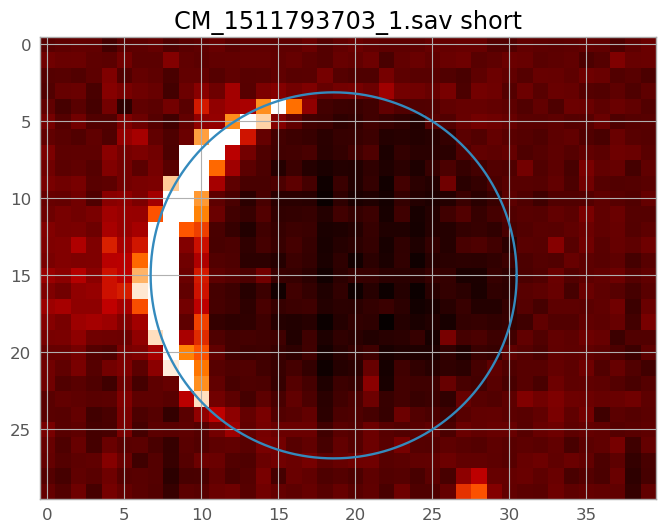

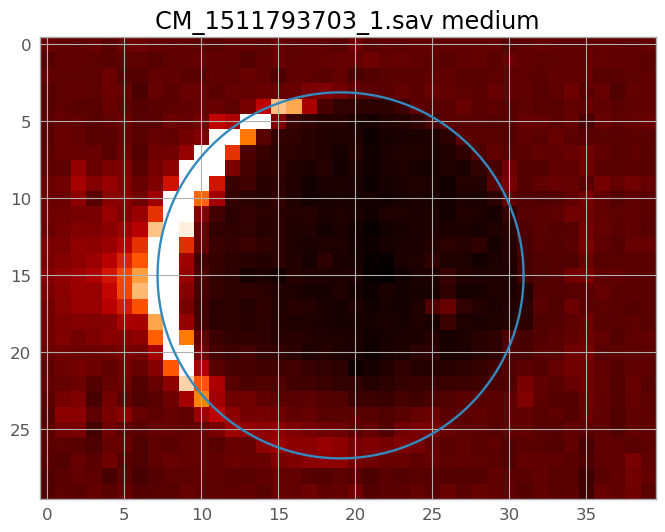

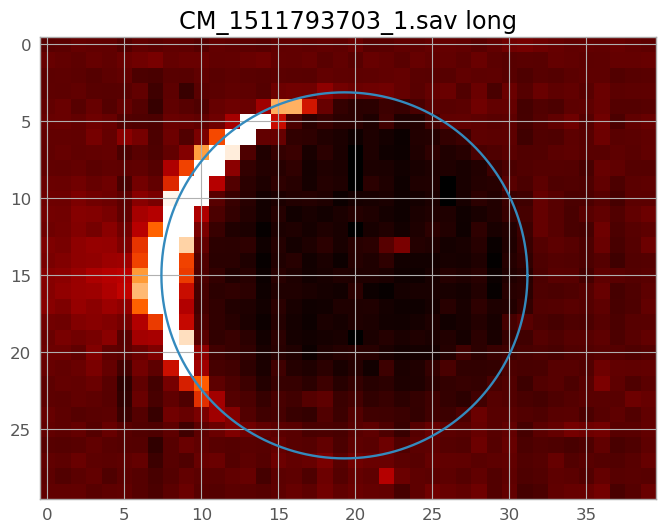

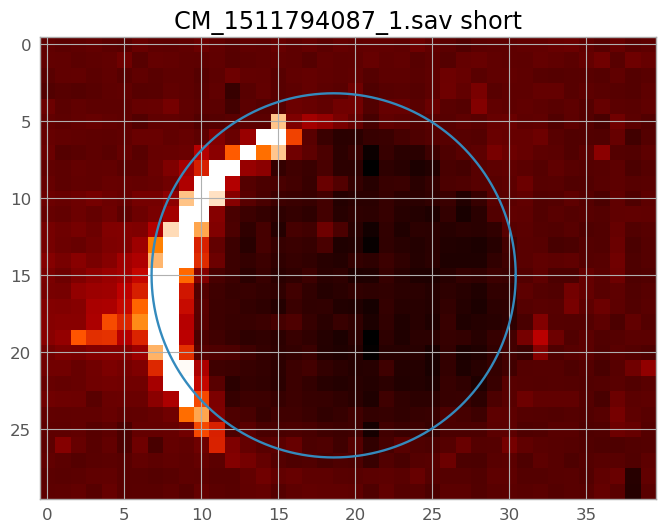

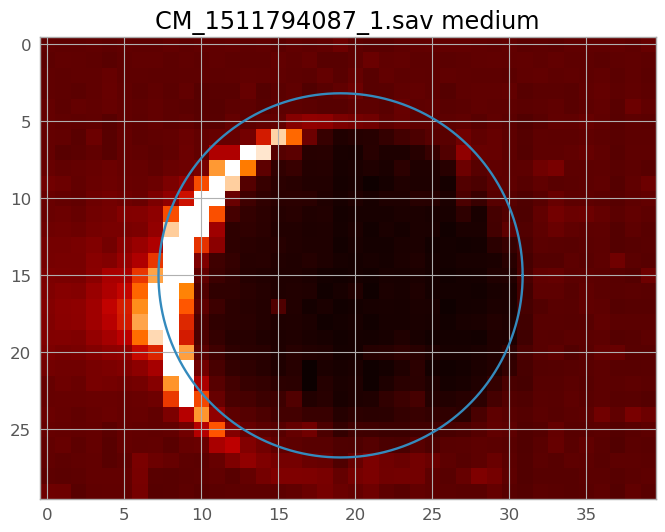

...

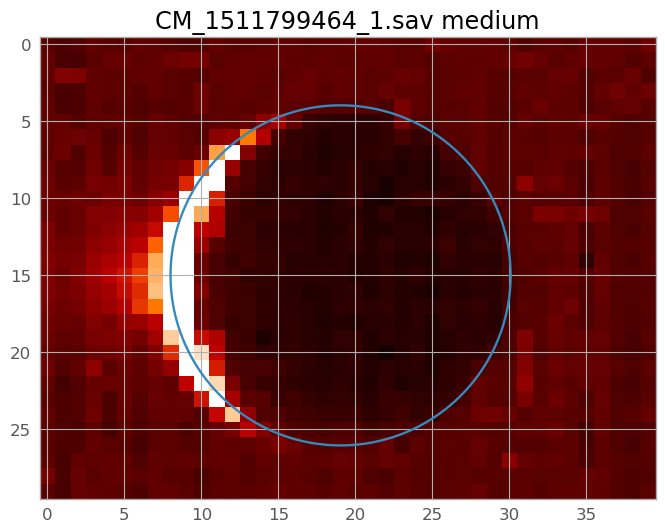

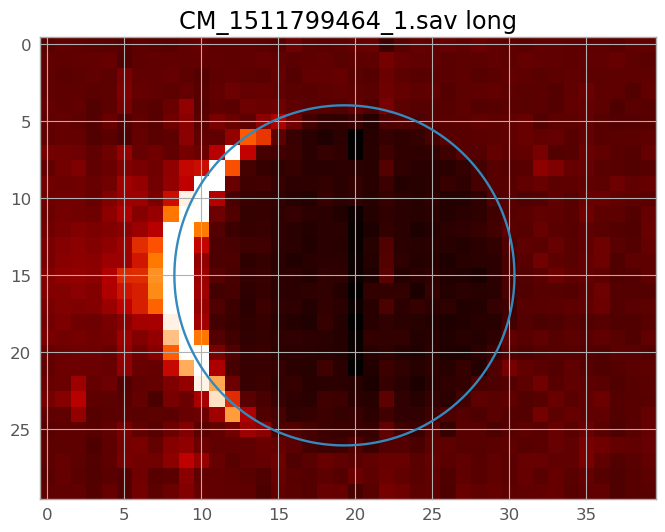

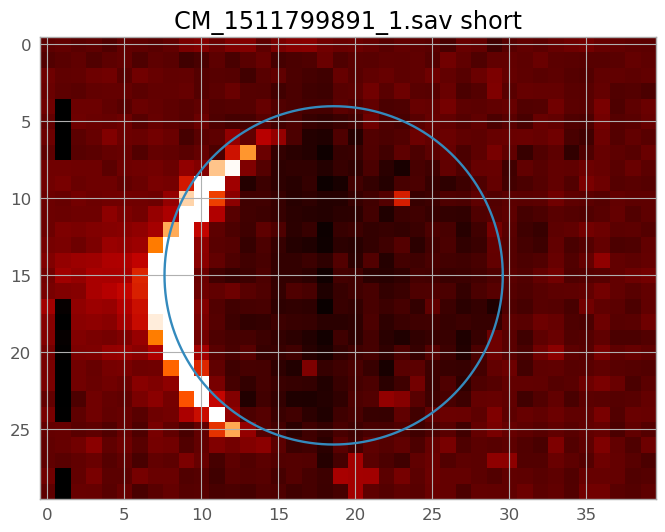

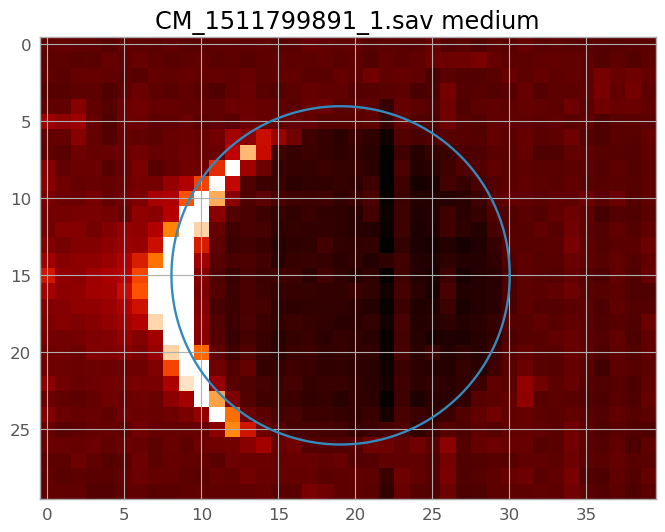

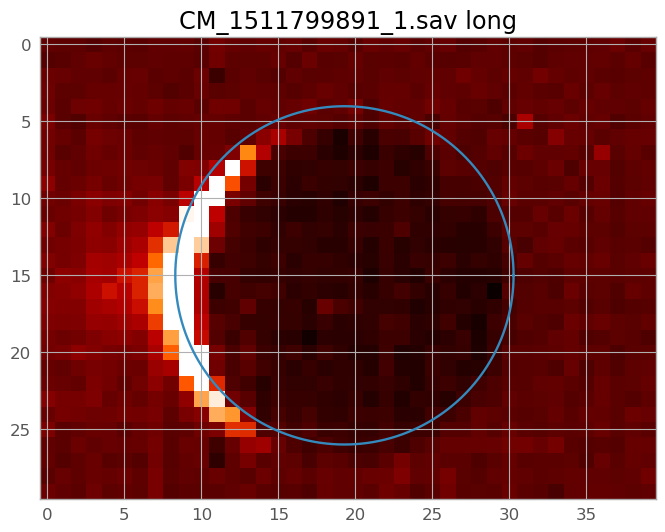

In [3]:
for i in range(len(range003)):

    xc=18.5
    yc=15
    rangex=range003[i]
    xp=np.cos(np.linspace(0,360,361)*np.pi/180)*250/rangex*3/.5e-3
    yp=np.sin(np.linspace(0,360,361)*np.pi/180)*250/rangex*3/.5e-3
    xcf=xc+np.linspace(0,95,96)*.01
    dat=readsav('S16_ENC/'+files003[i])
    qubc=dat.qub[:,0:96,:]
    qubx=np.zeros([len(qubc[:,0,0]),len(qubc[0,:,0]),len(qubc[0,0,:])])
    for j in range(96):
        for k in range(len(qubc[0,0,:])):
            qubx[:,j,k]=qubc[:,j,k]-np.mean(qubc[0:3,j,k])
    plt.imshow(np.mean(qubx[:,0:20,:],axis=1), vmin=-.001,vmax=.003)
    plt.plot(xp+np.mean(xcf[0:20]), yp+yc)
    plt.title(files003[i]+' short')
    plt.show()
    plt.imshow(np.mean(qubx[:,45:65,:],axis=1), vmin=-.001,vmax=.003)
    plt.plot(xp+np.mean(xcf[45:65]), yp+yc)
    plt.title(files003[i]+' medium')
    plt.show()
    plt.imshow(np.mean(qubx[:,70:90,:],axis=1), vmin=-.001,vmax=.003)
    plt.plot(xp+np.mean(xcf[70:90]), yp+yc)
    plt.title(files003[i]+' long')
    plt.show()


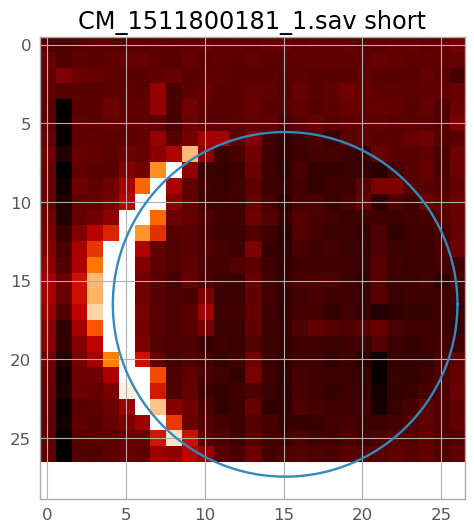

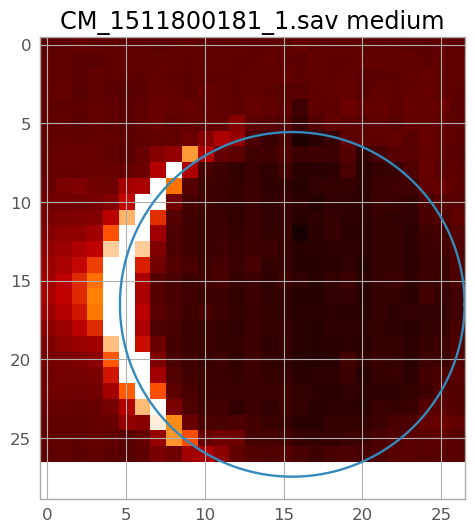

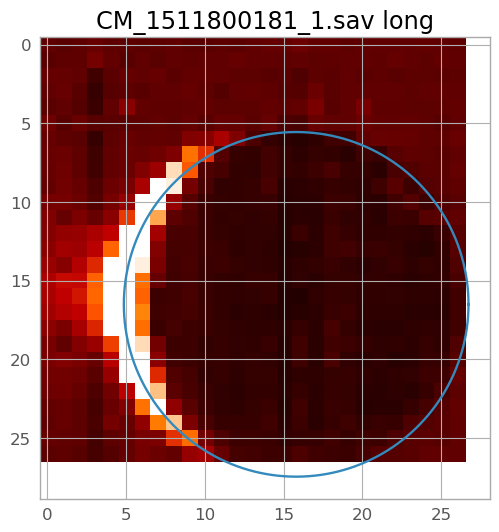

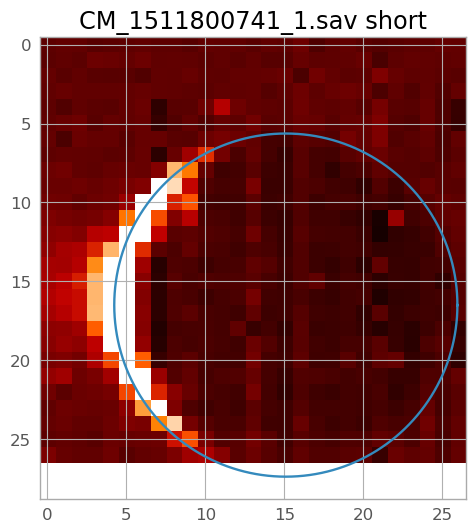

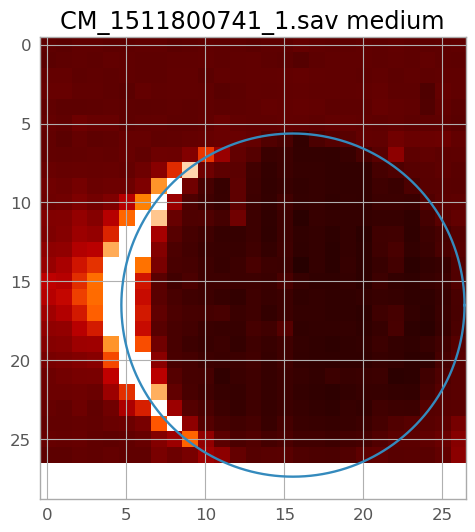

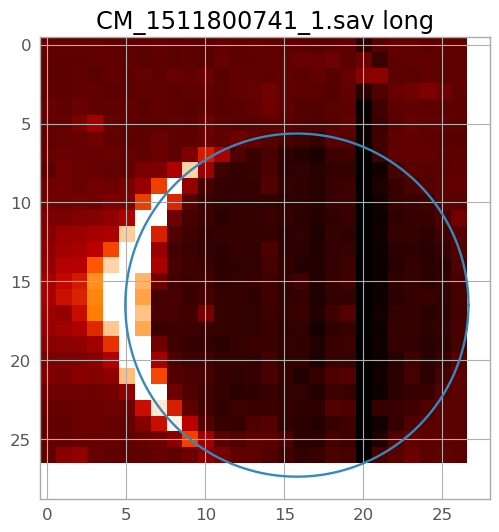

In [4]:
for i in range(len(range010)):

    xc=15
    yc=16.5
    rangex=range010[i]
    xp=np.cos(np.linspace(0,360,361)*np.pi/180)*250/rangex*3/.5e-3
    yp=np.sin(np.linspace(0,360,361)*np.pi/180)*250/rangex*3/.5e-3
    xcf=xc+np.linspace(0,95,96)*.01
    dat=readsav('S16_ENC/'+files010[i])
    qubc=dat.qub[:,0:96,:]
    qubx=np.zeros([len(qubc[:,0,0]),len(qubc[0,:,0]),len(qubc[0,0,:])])
    for j in range(96):
        for k in range(len(qubc[0,0,:])):
            qubx[:,j,k]=qubc[:,j,k]-np.mean(qubc[0:3,j,k])
    plt.imshow(np.mean(qubx[:,0:20,:],axis=1), vmin=-.001,vmax=.003)
    plt.plot(xp+np.mean(xcf[0:20]), yp+yc)
    plt.title(files010[i]+' short')
    plt.show()
    plt.imshow(np.mean(qubx[:,45:65,:],axis=1), vmin=-.001,vmax=.003)
    plt.plot(xp+np.mean(xcf[45:65]), yp+yc)
    plt.title(files010[i]+' medium')
    plt.show()
    plt.imshow(np.mean(qubx[:,70:90,:],axis=1), vmin=-.001,vmax=.003)
    plt.plot(xp+np.mean(xcf[70:90]), yp+yc)
    plt.title(files010[i]+' long')
    plt.show()


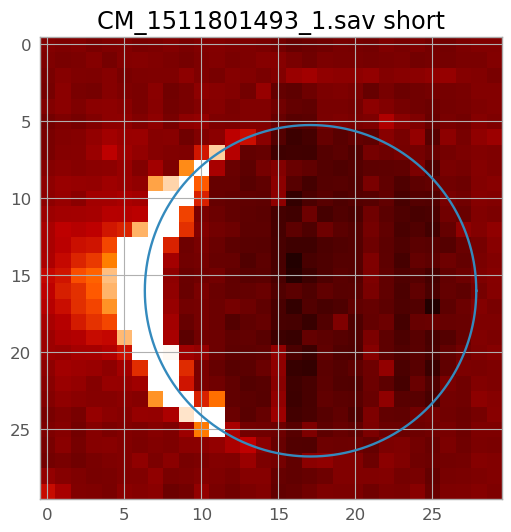

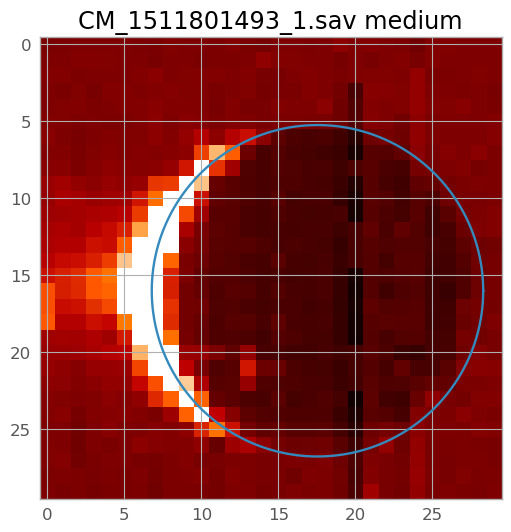

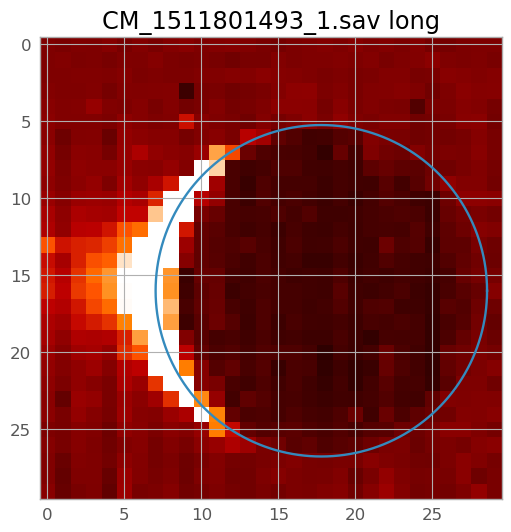

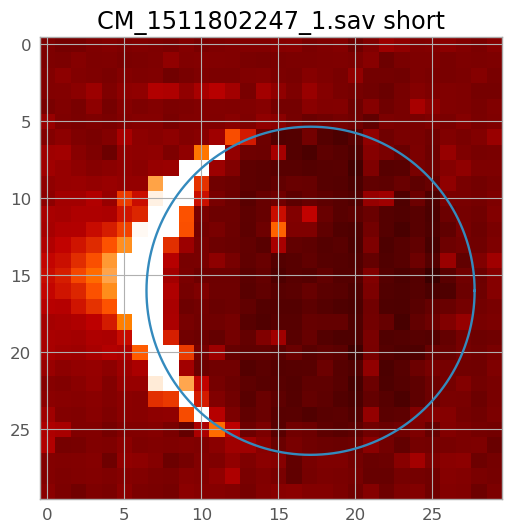

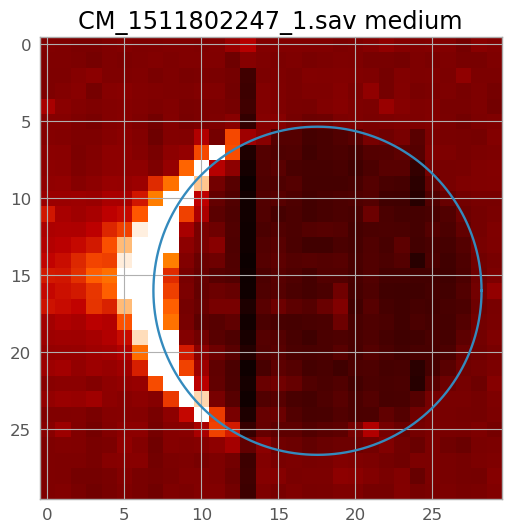

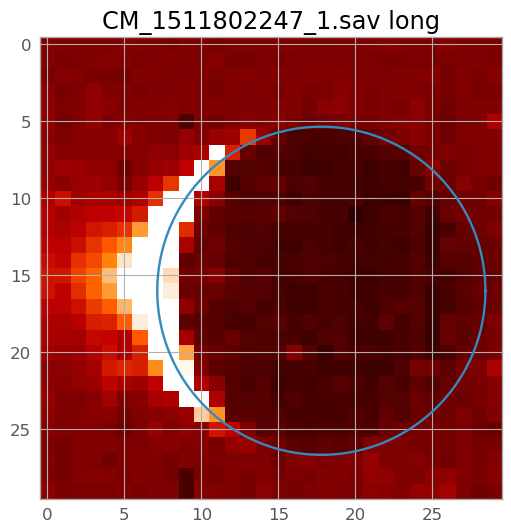

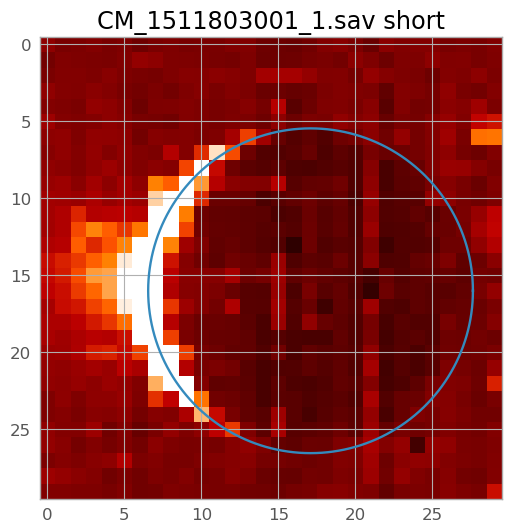

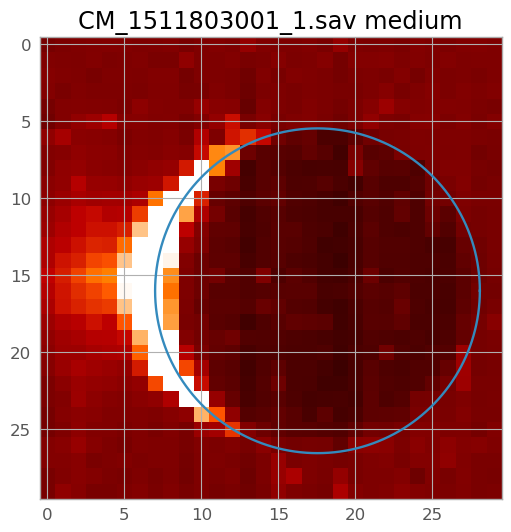

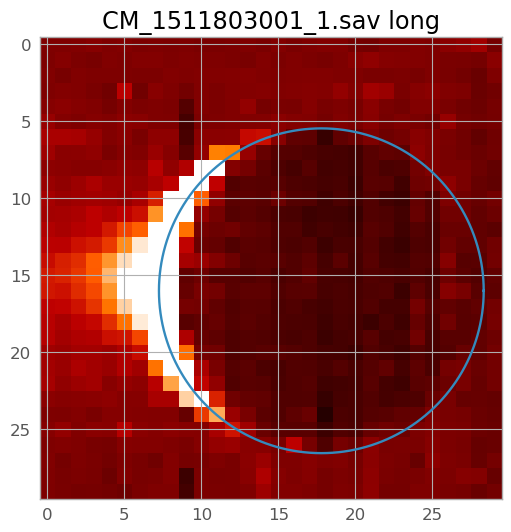

In [5]:
for i in range(len(range001)):

    xc=17
    yc=16
    rangex=range001[i]
    xp=np.cos(np.linspace(0,360,361)*np.pi/180)*250/rangex*3/.5e-3
    yp=np.sin(np.linspace(0,360,361)*np.pi/180)*250/rangex*3/.5e-3
    xcf=xc+np.linspace(0,95,96)*.01
    dat=readsav('S16_ENC/'+files001[i])
    qubc=dat.qub[:,0:96,:]
    qubx=np.zeros([len(qubc[:,0,0]),len(qubc[0,:,0]),len(qubc[0,0,:])])
    for j in range(96):
        for k in range(len(qubc[0,0,:])):
            qubx[:,j,k]=qubc[:,j,k]-np.mean(qubc[0:3,j,k])
    plt.imshow(np.mean(qubx[:,0:20,:],axis=1), vmin=-.001,vmax=.002)
    plt.plot(xp+np.mean(xcf[0:20]), yp+yc)
    plt.title(files001[i]+' short')
    plt.show()
    plt.imshow(np.mean(qubx[:,45:65,:],axis=1), vmin=-.001,vmax=.002)
    plt.plot(xp+np.mean(xcf[45:65]), yp+yc)
    plt.title(files001[i]+' medium')
    plt.show()
    plt.imshow(np.mean(qubx[:,70:90,:],axis=1), vmin=-.001,vmax=.002)
    plt.plot(xp+np.mean(xcf[70:90]), yp+yc)
    plt.title(files001[i]+' long')
    plt.show()


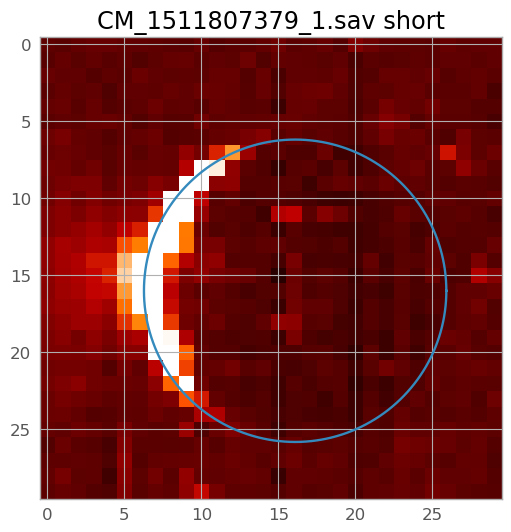

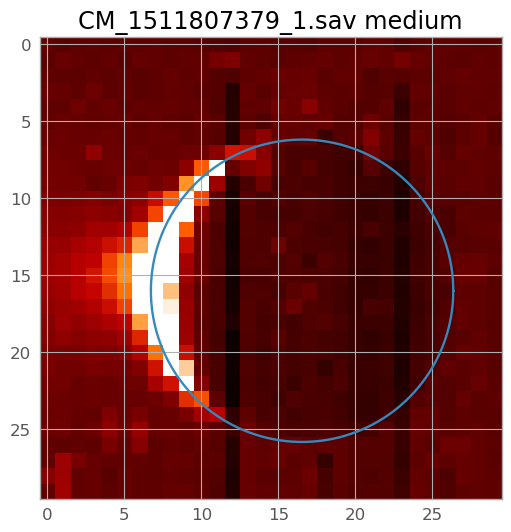

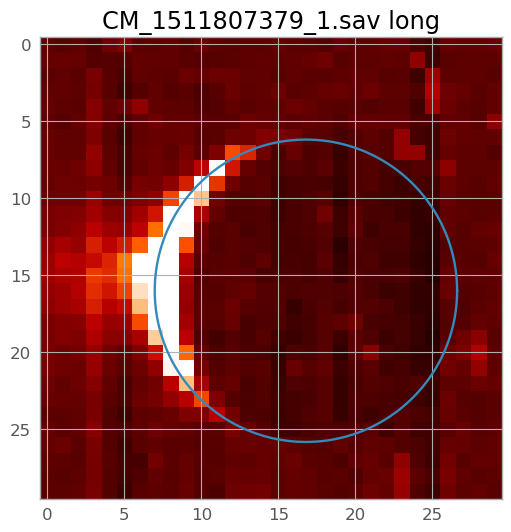

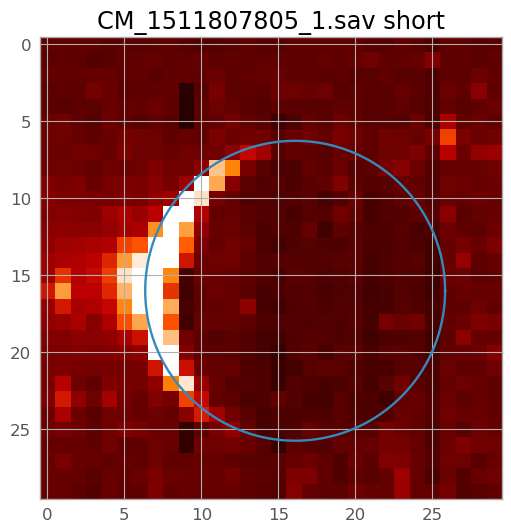

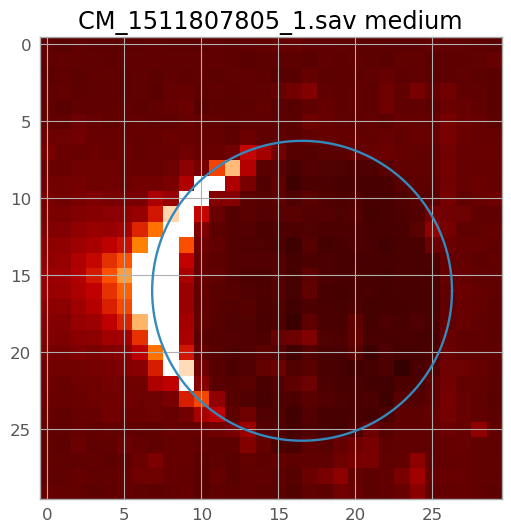

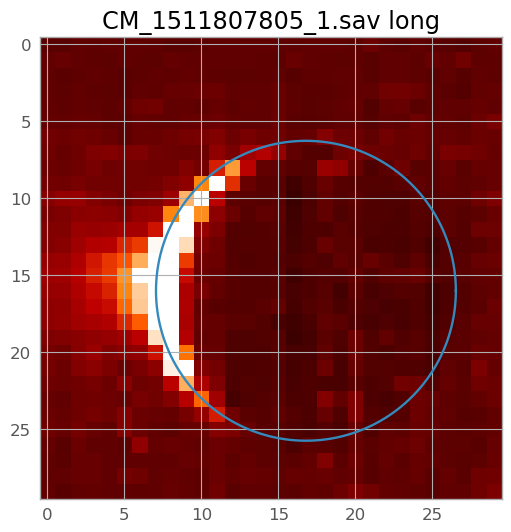

In [5]:
for i in range(len(range011)):

    xc=16
    yc=16
    rangex=range011[i]
    xp=np.cos(np.linspace(0,360,361)*np.pi/180)*250/rangex*3/.5e-3
    yp=np.sin(np.linspace(0,360,361)*np.pi/180)*250/rangex*3/.5e-3
    xcf=xc+np.linspace(0,95,96)*.01
    dat=readsav('S16_ENC/'+files011[i])
    qubc=dat.qub[:,0:96,:]
    qubx=np.zeros([len(qubc[:,0,0]),len(qubc[0,:,0]),len(qubc[0,0,:])])
    for j in range(96):
        for k in range(len(qubc[0,0,:])):
            qubx[:,j,k]=qubc[:,j,k]-np.mean(qubc[0:3,j,k])
    plt.imshow(np.mean(qubx[:,0:20,:],axis=1), vmin=-.001,vmax=.003)
    plt.plot(xp+np.mean(xcf[0:20]), yp+yc)
    plt.title(files011[i]+' short')
    plt.show()
    plt.imshow(np.mean(qubx[:,45:65,:],axis=1), vmin=-.001,vmax=.003)
    plt.plot(xp+np.mean(xcf[45:65]), yp+yc)
    plt.title(files011[i]+' medium')
    plt.show()
    plt.imshow(np.mean(qubx[:,70:90,:],axis=1), vmin=-.001,vmax=.003)
    plt.plot(xp+np.mean(xcf[70:90]), yp+yc)
    plt.title(files011[i]+' long')
    plt.show()


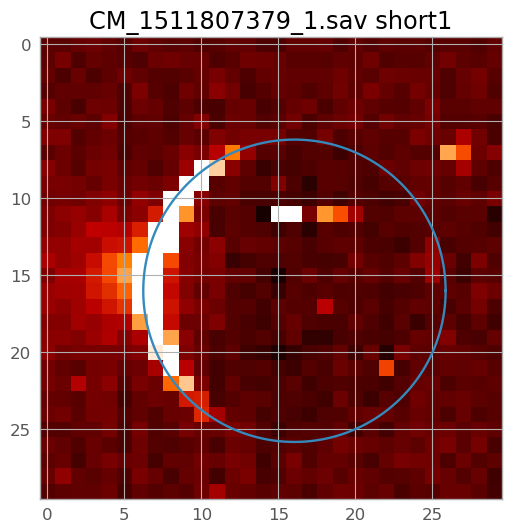

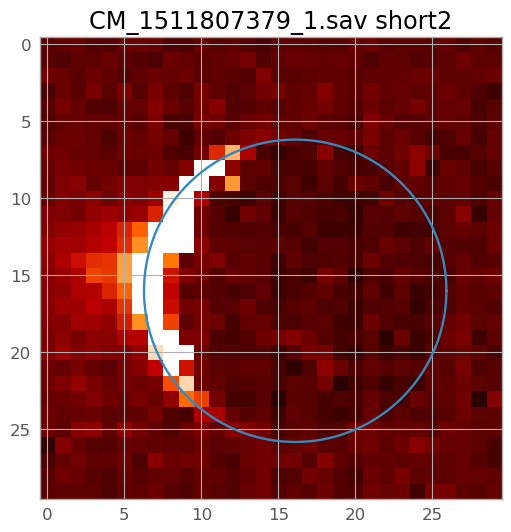

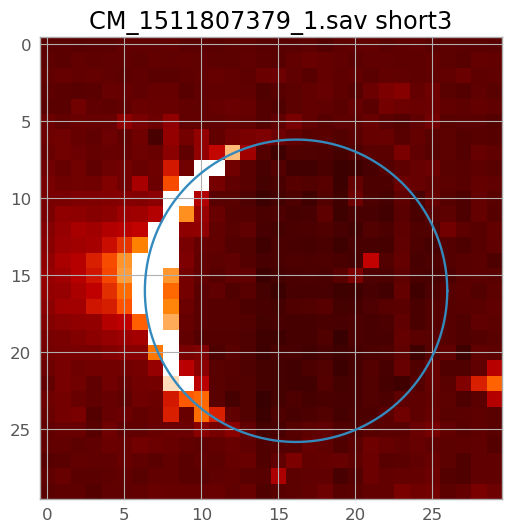

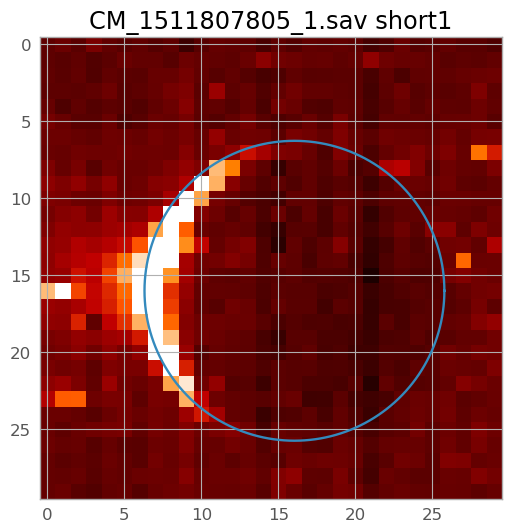

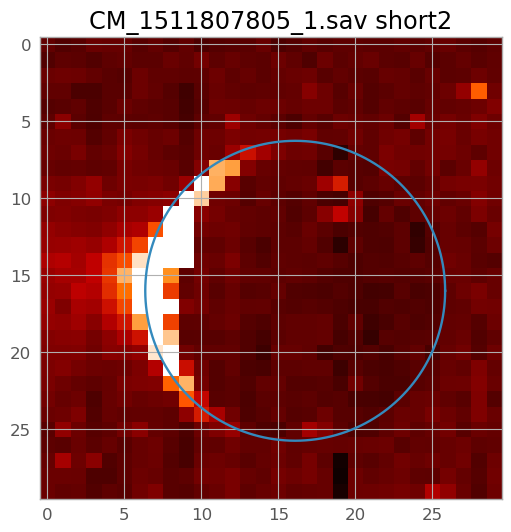

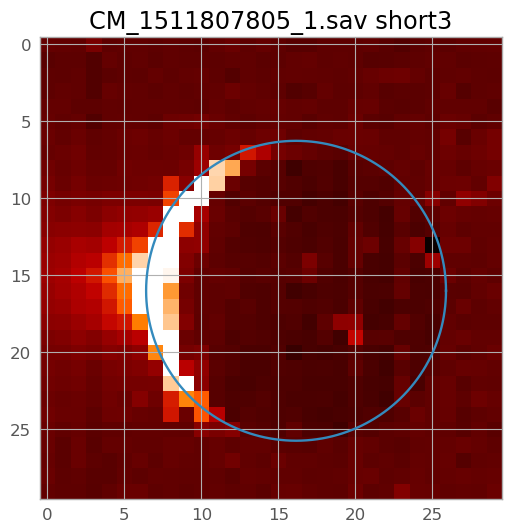

In [6]:
for i in range(len(range011)):

    xc=16
    yc=16
    rangex=range011[i]
    xp=np.cos(np.linspace(0,360,361)*np.pi/180)*250/rangex*3/.5e-3
    yp=np.sin(np.linspace(0,360,361)*np.pi/180)*250/rangex*3/.5e-3
    xcf=xc+np.linspace(0,95,96)*.007
    dat=readsav('S16_ENC/'+files011[i])
    qubc=dat.qub[:,0:96,:]
    qubx=np.zeros([len(qubc[:,0,0]),len(qubc[0,:,0]),len(qubc[0,0,:])])
    for j in range(96):
        for k in range(len(qubc[0,0,:])):
            qubx[:,j,k]=qubc[:,j,k]-np.mean(qubc[0:3,j,k])
    plt.imshow(np.mean(qubx[:,5:10,:],axis=1), vmin=-.001,vmax=.003)
    plt.plot(xp+np.mean(xcf[5:10]), yp+yc)
    plt.title(files011[i]+' short1')
    plt.show()
    plt.imshow(np.mean(qubx[:,12:17,:],axis=1), vmin=-.001,vmax=.003)
    plt.plot(xp+np.mean(xcf[12:17]), yp+yc)
    plt.title(files011[i]+' short2')
    plt.show()
    plt.imshow(np.mean(qubx[:,20:25,:],axis=1), vmin=-.001,vmax=.003)
    plt.plot(xp+np.mean(xcf[20:25]), yp+yc)
    plt.title(files011[i]+' short3')
    plt.show()


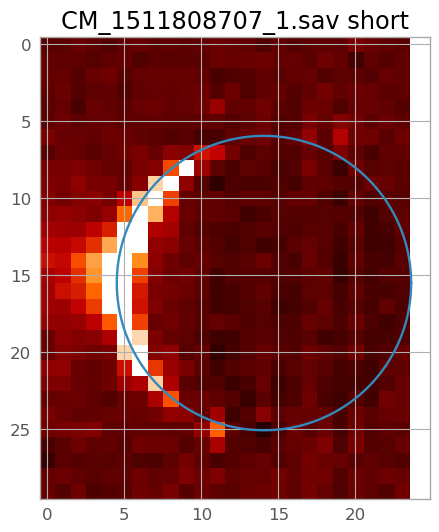

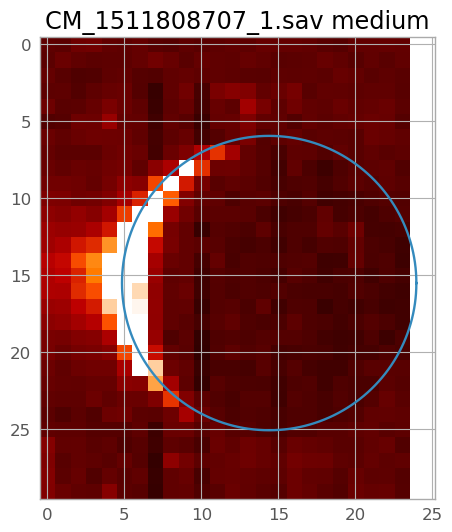

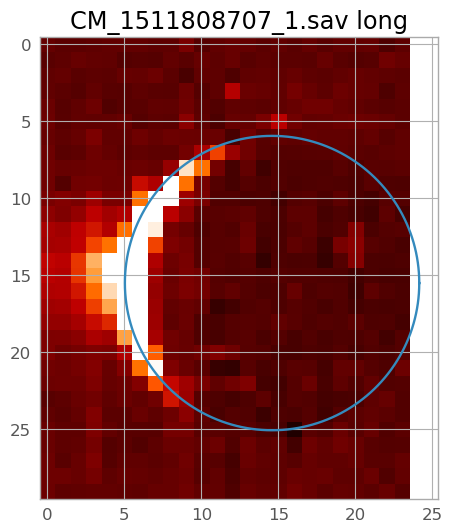

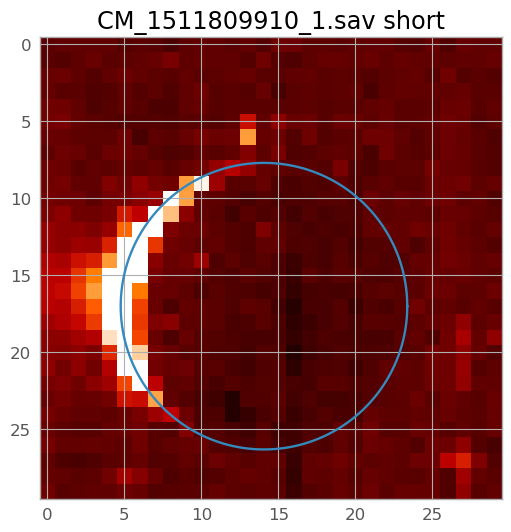

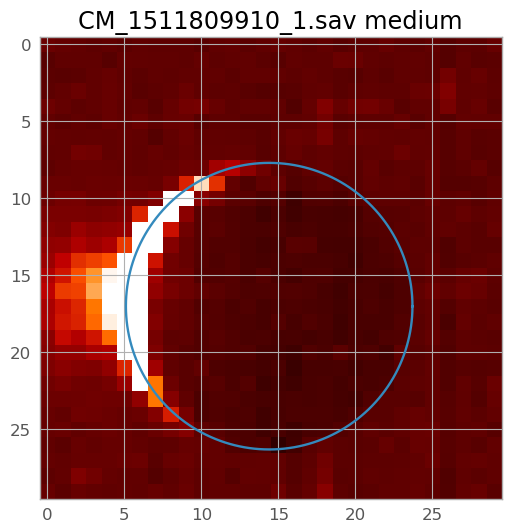

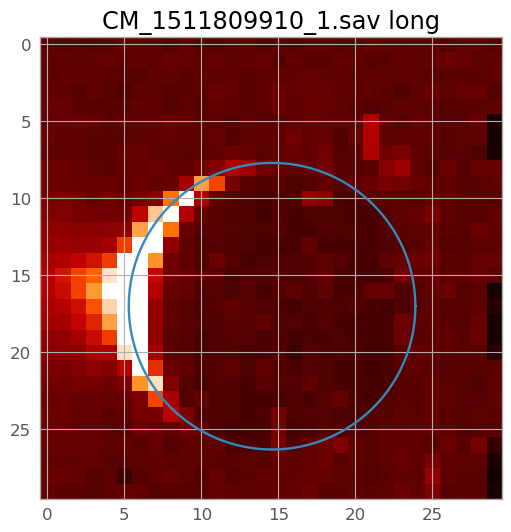

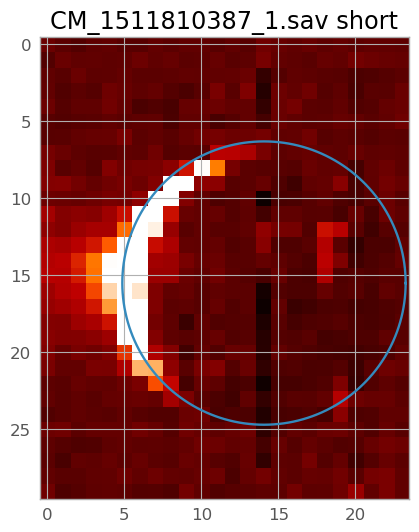

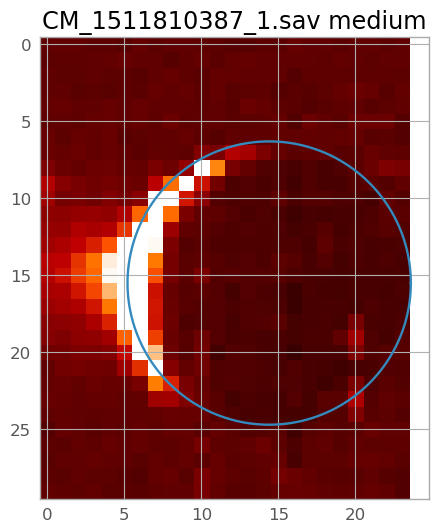

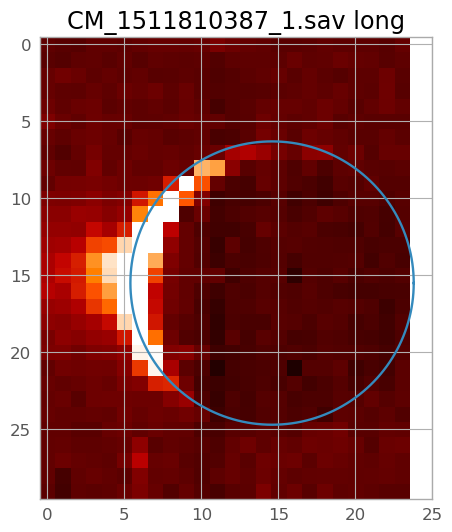

In [7]:
for i in range(len(range007)):

    xc=14
    yc=15.5
    if i == 1:
        yc=17
    rangex=range007[i]
    xp=np.cos(np.linspace(0,360,361)*np.pi/180)*250/rangex*3/.5e-3
    yp=np.sin(np.linspace(0,360,361)*np.pi/180)*250/rangex*3/.5e-3
    xcf=xc+np.linspace(0,95,96)*.0075
    dat=readsav('S16_ENC/'+files007[i])
    qubc=dat.qub[:,0:96,:]
    qubx=np.zeros([len(qubc[:,0,0]),len(qubc[0,:,0]),len(qubc[0,0,:])])
    for j in range(96):
        for k in range(len(qubc[0,0,:])):
            qubx[:,j,k]=qubc[:,j,k]-np.mean(qubc[0:3,j,k])
    plt.imshow(np.mean(qubx[:,0:20,:],axis=1), vmin=-.001,vmax=.003)
    plt.plot(xp+np.mean(xcf[0:20]), yp+yc)
    plt.title(files007[i]+' short')
    plt.show()
    plt.imshow(np.mean(qubx[:,45:65,:],axis=1), vmin=-.001,vmax=.003)
    plt.plot(xp+np.mean(xcf[45:65]), yp+yc)
    plt.title(files007[i]+' medium')
    plt.show()
    plt.imshow(np.mean(qubx[:,70:90,:],axis=1), vmin=-.001,vmax=.003)
    plt.plot(xp+np.mean(xcf[70:90]), yp+yc)
    plt.title(files007[i]+' long')
    plt.show()


In [8]:
def encvisspec(file,col):
    dat=readsav(file)
    qubc=dat.qub[:,0:96,:]
    waves=dat.wavel
    nw=96
    nx=len(qubc[:,0,0])
    ny=len(qubc[0,0,:])
    qubx=np.zeros([nx,nw,ny])
    specs=np.zeros([20,nw])
    errs=np.zeros([20,nw])
    for k in range(20):
        for j in range(96):
                dats=qubc[:,j,k]-np.mean(qubc[0:3,j,k])
                datp=dats[col-5:col+6]
                datb=dats[[col-9,col-8,col-7,col-6,col+6,col+7,col+8,col+9]]
                mb=np.nanmedian(datb)
                sb=np.nanstd(datb)
                foob=(datb-mb)<3*sb
                sigb=np.nanmean(datb[foob])
                errb=np.std(datb[foob])
                mp=np.nanmedian(datp)
                sp=np.std(datp)
                foop=(datp-mp)<10*sp
                specs[k,j]=np.mean(datp[foop])-sigb
                errs[k,j]=errb/np.sqrt(len(datp)-1)
    return(specs,errs)

In [9]:
specs003=np.zeros([len(files003),20,96])
errs003=np.zeros([len(files003),20,96])
for i in range(len(files003)):
    specs003[i,:,:], errs003[i,:,:]=encvisspec('S16_ENC/'+files003[i],17)
specs010=np.zeros([len(files010),20,96])
errs010=np.zeros([len(files010),20,96])
for i in range(len(files010)):
    specs010[i,:,:], errs010[i,:,:]=encvisspec('S16_ENC/'+files010[i],17)
specs001=np.zeros([len(files001),20,96])
errs001=np.zeros([len(files001),20,96])
for i in range(len(files001)):
    specs001[i,:,:], errs001[i,:,:]=encvisspec('S16_ENC/'+files001[i],16)
specs011=np.zeros([len(files011),20,96])
errs011=np.zeros([len(files011),20,96])
for i in range(len(files011)):
    specs011[i,:,:], errs011[i,:,:]=encvisspec('S16_ENC/'+files011[i],16)
specs007=np.zeros([len(files007),20,96])
errs007=np.zeros([len(files007),20,96])
for i in range(len(files007)):
    specs007[i,:,:], errs007[i,:,:]=encvisspec('S16_ENC/'+files007[i],16)

/var/folders/1r/l15xqvtx5fj7vq10n8_wg3sr0000gn/T/ipykernel_72280/3765858051.py:19: RuntimeWarning: Mean of empty slice
  sigb=np.nanmean(datb[foob])
/opt/anaconda3/lib/python3.13/site-packages/numpy/_core/_methods.py:227: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/opt/anaconda3/lib/python3.13/site-packages/numpy/_core/_methods.py:184: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/opt/anaconda3/lib/python3.13/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
/opt/anaconda3/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:3904: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/anaconda3/lib/python3.13/site-packages/numpy/_core/_methods.py:147: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


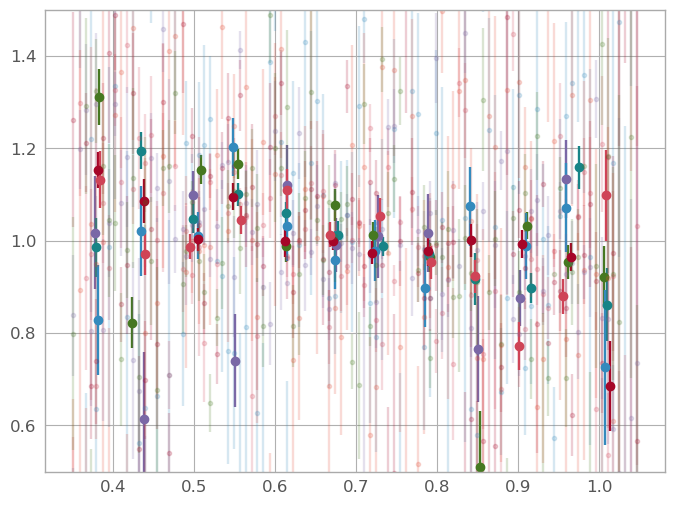

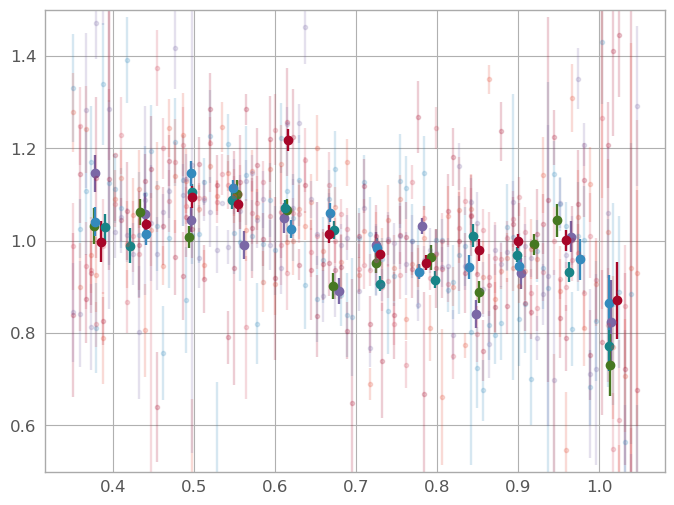

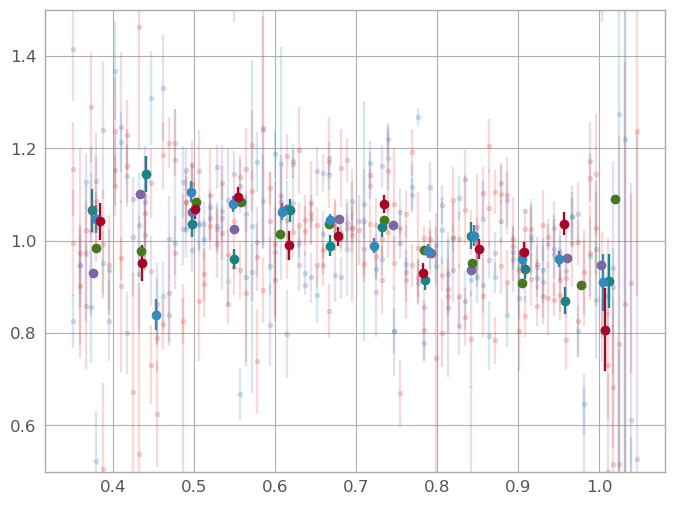

In [12]:
rb=8
spec003y=np.zeros([len(files003),20,int(96/rb)])
err003y=np.zeros([len(files003),20,int(96/rb)])
wave003y=np.zeros([len(files003),20,int(96/rb)])
for i in range(int(96/rb)):
    for k in range(len(files003)):
        for j in range(20):
            dat=specs003[k,j,i*rb:(i+1)*rb]
            er=errs003[k,j,i*rb:(i+1)*rb]
            w=wavel[i*rb:(i+1)*rb]
            foo=(np.abs(dat-np.nanmedian(dat))<3*er) 
            if len(dat[foo])>1:
                spec003y[k,j,i]=np.average(dat[foo], weights=1/er[foo]**2)
                wave003y[k,j,i]=np.average(w[foo], weights=1/er[foo]**2)
                err003y[k,j,i]=np.sqrt(1/np.sum(1/er[foo]**2))
spec010y=np.zeros([2,20,int(96/rb)])
err010y=np.zeros([2,20,int(96/rb)])
wave010y=np.zeros([2,20,int(96/rb)])
for i in range(int(96/rb)):
    for k in range(2):
        for j in range(20):
            dat=specs010[k,j,i*rb:(i+1)*rb]
            er=errs010[k,j,i*rb:(i+1)*rb]
            w=wavel[i*rb:(i+1)*rb]
            foo=(np.abs(dat-np.nanmedian(dat))<3*er) 
            if len(dat[foo])>1:
                spec010y[k,j,i]=np.average(dat[foo], weights=1/er[foo]**2)
                wave010y[k,j,i]=np.average(w[foo], weights=1/er[foo]**2)
                err010y[k,j,i]=np.sqrt(1/np.sum(1/er[foo]**2))
spec001y=np.zeros([3,20,int(96/rb)])
err001y=np.zeros([3,20,int(96/rb)])
wave001y=np.zeros([3,20,int(96/rb)])
for i in range(int(96/rb)):
    for k in range(3):
        for j in range(20):
            dat=specs001[k,j,i*rb:(i+1)*rb]
            er=errs001[k,j,i*rb:(i+1)*rb]
            w=wavel[i*rb:(i+1)*rb]
            foo=(np.abs(dat-np.nanmedian(dat))<3*er) 
            if len(dat[foo])>1:
                spec001y[k,j,i]=np.average(dat[foo], weights=1/er[foo]**2)
                wave001y[k,j,i]=np.average(w[foo], weights=1/er[foo]**2)
                err001y[k,j,i]=np.sqrt(1/np.sum(1/er[foo]**2))
spec011y=np.zeros([2,20,int(96/rb)])
err011y=np.zeros([2,20,int(96/rb)])
wave011y=np.zeros([2,20,int(96/rb)])
for i in range(int(96/rb)):
    for k in range(2):
        for j in range(20):
            dat=specs011[k,j,i*rb:(i+1)*rb]
            er=errs011[k,j,i*rb:(i+1)*rb]
            w=wavel[i*rb:(i+1)*rb]
            foo=(np.abs(dat-np.nanmedian(dat))<3*er) 
            if len(dat[foo])>1:
                spec011y[k,j,i]=np.average(dat[foo], weights=1/er[foo]**2)
                wave011y[k,j,i]=np.average(w[foo], weights=1/er[foo]**2)
                err011y[k,j,i]=np.sqrt(1/np.sum(1/er[foo]**2))
spec007y=np.zeros([len(files007),20,int(96/rb)])
err007y=np.zeros([len(files007),20,int(96/rb)])
wave007y=np.zeros([len(files007),20,int(96/rb)])
for i in range(int(96/rb)):
    for k in range(len(files007)):
        for j in range(20):
            dat=specs007[k,j,i*rb:(i+1)*rb]
            er=errs007[k,j,i*rb:(i+1)*rb]
            w=wavel[i*rb:(i+1)*rb]
            foo=(np.abs(dat-np.nanmedian(dat))<3*er) 
            if len(dat[foo])>1:
                spec007y[k,j,i]=np.average(dat[foo], weights=1/er[foo]**2)
                wave007y[k,j,i]=np.average(w[foo], weights=1/er[foo]**2)
                err007y[k,j,i]=np.sqrt(1/np.sum(1/er[foo]**2))



for i in range(6):
    plt.errorbar(wavel, specs003[i,4,:]/np.median(specs003[i,4,:]), yerr=errs003[i,4,:]/np.median(specs003[i,4,:]), fmt='.', alpha=.2)
    plt.errorbar(wave003y[i,4,:], spec003y[i,4,:]/np.median(spec003y[i,4,:]), yerr=err003y[i,4,:]/np.median(spec003y[i,4,:]), fmt='o')
plt.ylim([.5,1.5])
plt.show()

for i in range(2):
    plt.errorbar(wavel, specs010[i,2,:]/np.median(specs010[i,2,:]), yerr=errs010[i,3,:]/np.median(specs010[i,2,:]), fmt='.', alpha=.2)
    plt.errorbar(wave010y[i,2,:], spec010y[i,2,:]/np.median(spec010y[i,2,:]), yerr=err010y[i,3,:]/np.median(spec010y[i,2,:]), fmt='o')

for i in range(3):
    plt.errorbar(wavel, specs001[i,4,:]/np.median(specs001[i,4,:]), yerr=errs001[i,4,:]/np.median(specs001[i,4,:]), fmt='.', alpha=.2)
    plt.errorbar(wave001y[i,4,:], spec001y[i,4,:]/np.median(spec001y[i,4,:]), yerr=err001y[i,4,:]/np.median(spec001y[i,4,:]), fmt='o')

plt.ylim([.5,1.5])
plt.show()

for i in range(2):
    plt.errorbar(wavel, specs011[i,5,:]/np.median(specs011[i,5,:]), yerr=errs011[i,4,:]/np.median(specs011[i,5,:]), fmt='.', alpha=.2)
    plt.errorbar(wave011y[i,5,:], spec011y[i,5,:]/np.median(spec011y[i,5,:]), yerr=err011y[i,5,:]/np.median(spec010y[i,5,:]), fmt='o')

for i in range(3):
    plt.errorbar(wavel, specs007[i,3,:]/np.median(specs007[i,3,:]), yerr=errs007[i,3,:]/np.median(specs007[i,3,:]), fmt='.', alpha=.2)
    plt.errorbar(wave007y[i,3,:], spec007y[i,3,:]/np.median(spec007y[i,3,:]), yerr=err007y[i,3,:]/np.median(spec007y[i,3,:]), fmt='o')

plt.ylim([.5,1.5])
plt.show()

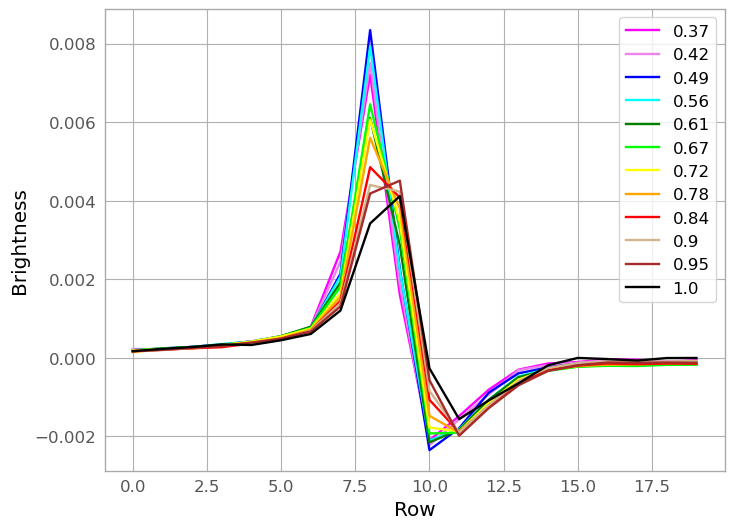

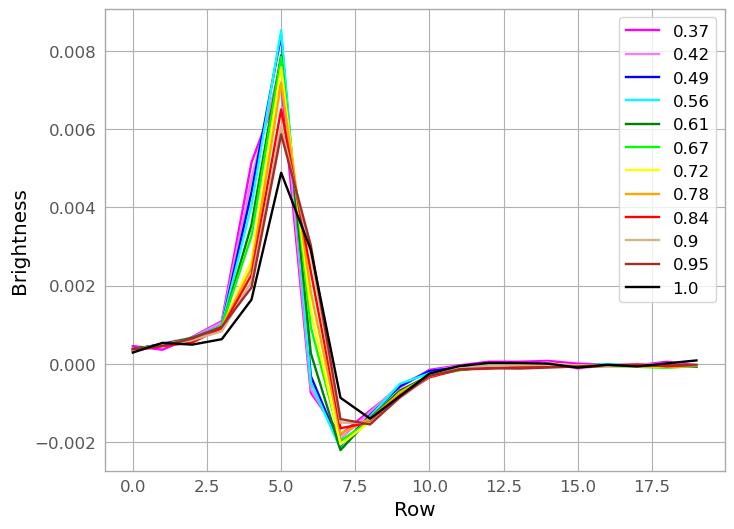

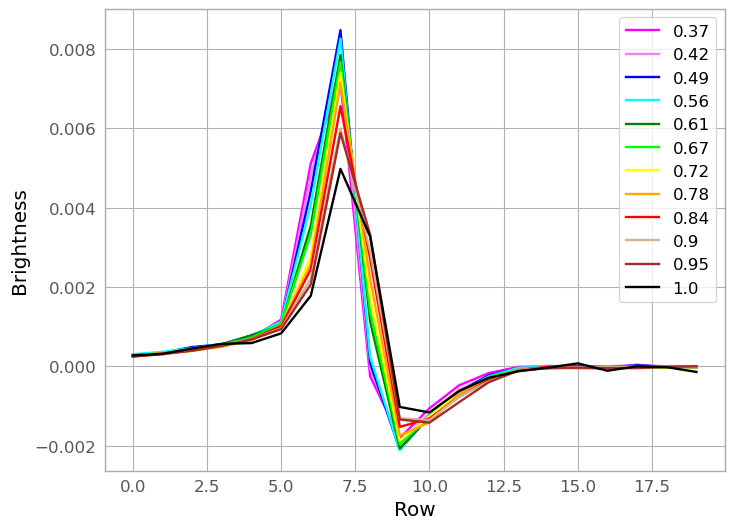

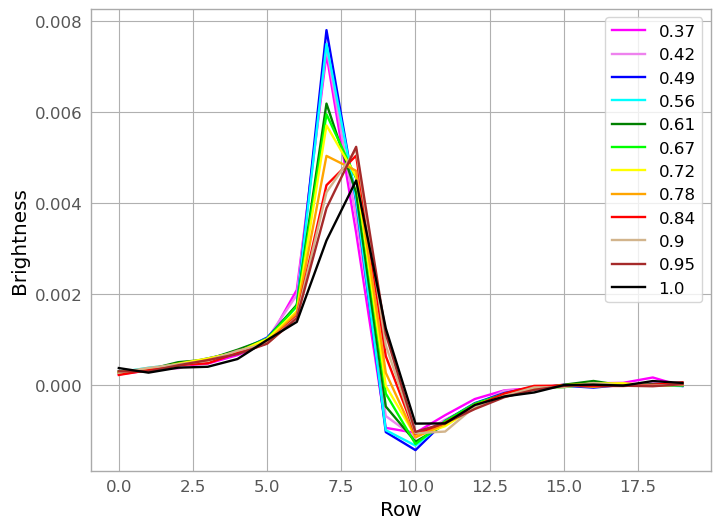

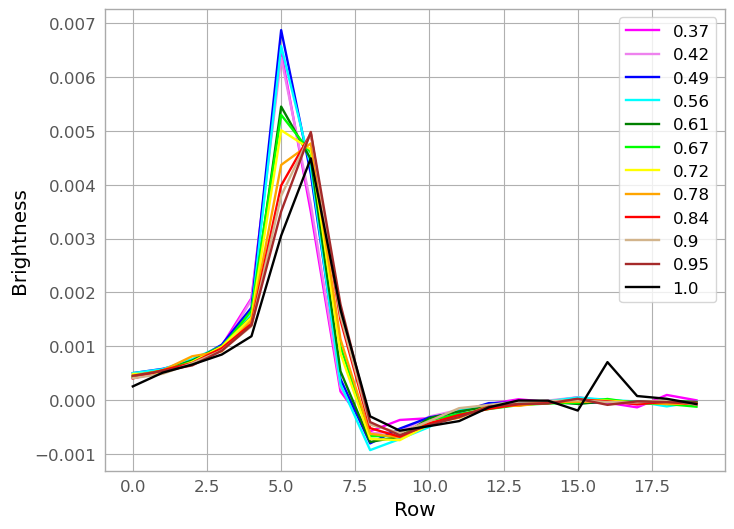

In [13]:
colors=['magenta','violet','blue','cyan','green','lime','yellow','orange','red','tan','brown','black']
for i in range(12):
    plt.plot(np.mean(spec003y[:,:,i], axis=0), color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.show()
for i in range(12):
    plt.plot(np.mean(spec010y[:,:,i], axis=0), color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.show()
for i in range(12):
    plt.plot(np.mean(spec001y[:,:,i], axis=0), color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.show()
for i in range(12):
    plt.plot(np.mean(spec011y[:,:,i], axis=0), color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.show()
for i in range(12):
    plt.plot(np.mean(spec007y[:,:,i], axis=0), color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.show()



[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17.
 18. 19.]


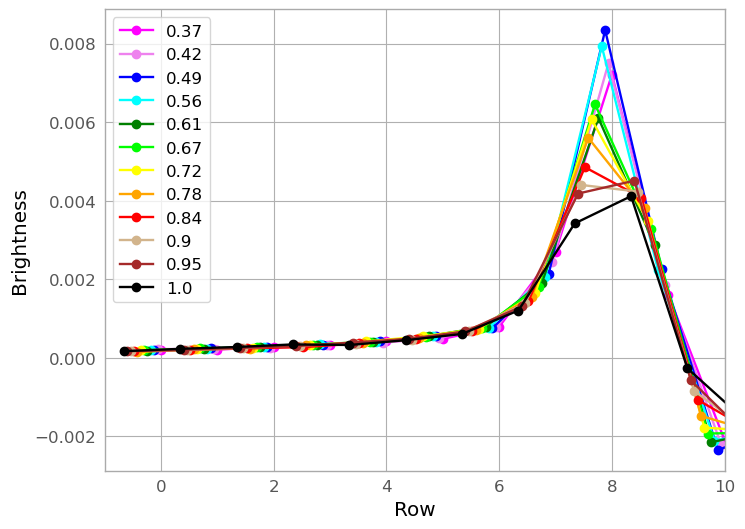

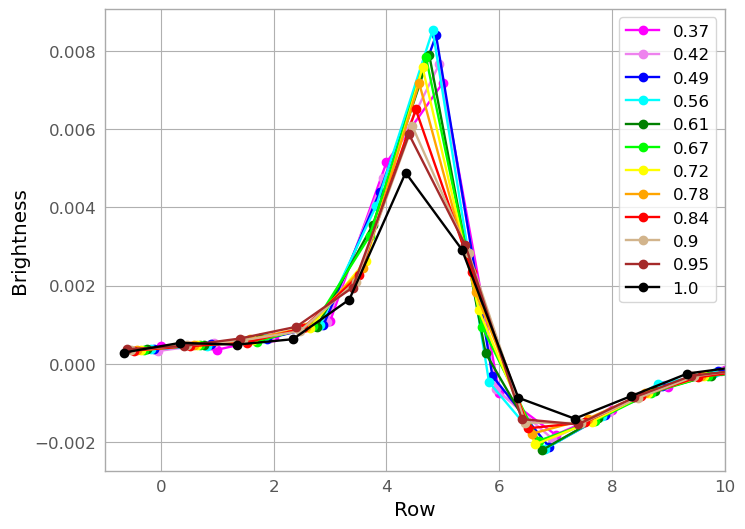

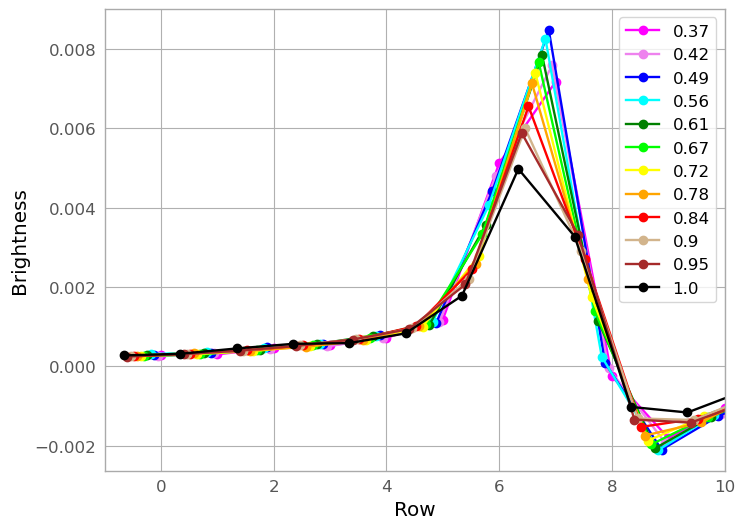

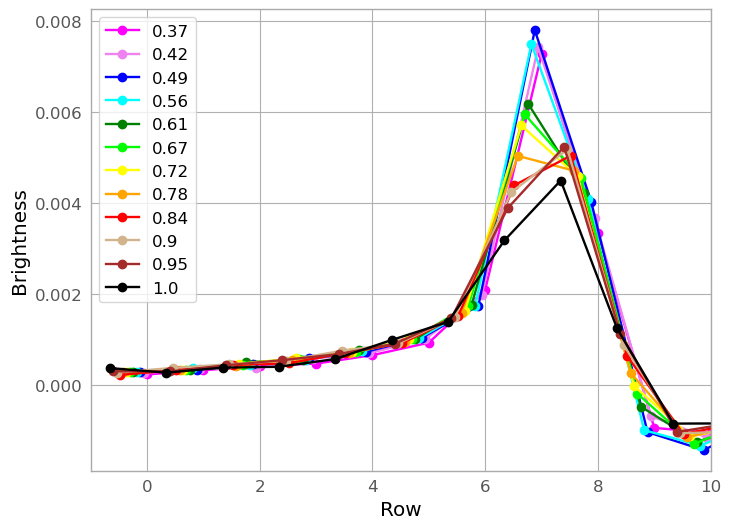

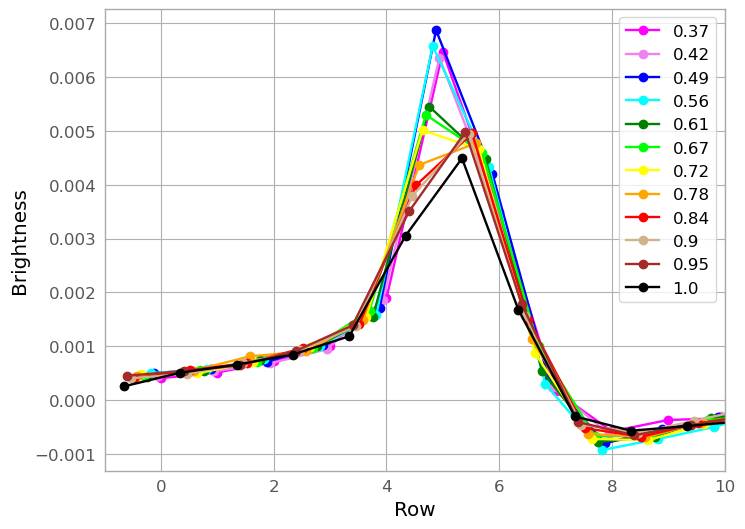

In [14]:
colors=['magenta','violet','blue','cyan','green','lime','yellow','orange','red','tan','brown','black']
x=np.linspace(0,19,20)
print(x)
wf=-.0075*8
for i in range(12):
    plt.plot(x+i*wf, np.mean(spec003y[:,:,i], axis=0), 'o-',color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.xlim([-1,10])
plt.show()
for i in range(12):
    plt.plot(x+i*wf,np.mean(spec010y[:,:,i], axis=0), 'o-',color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.xlim([-1,10])
plt.show()
for i in range(12):
    plt.plot(x+i*wf,np.mean(spec001y[:,:,i], axis=0), 'o-',color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.xlim([-1,10])
plt.show()
for i in range(12):
    plt.plot(x+i*wf,np.mean(spec011y[:,:,i], axis=0), 'o-',color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.xlim([-1,10])
plt.show()
for i in range(12):
    plt.plot(x+i*wf,np.mean(spec007y[:,:,i], axis=0), 'o-',color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.xlim([-1,10])
plt.show()



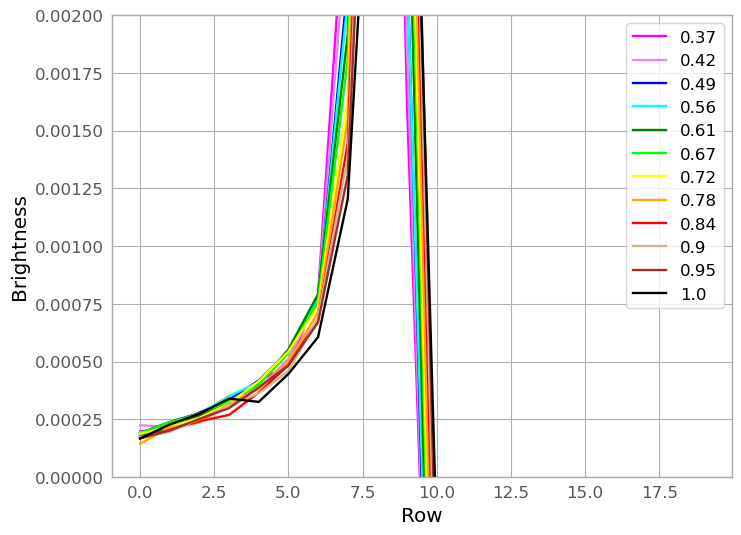

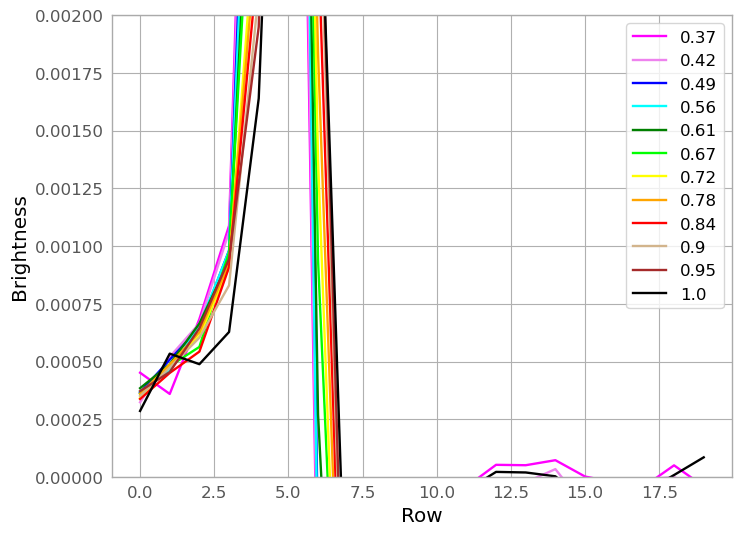

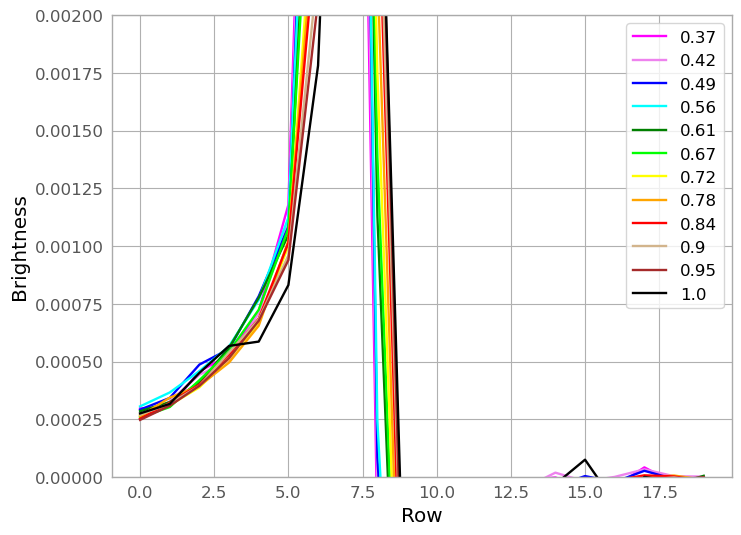

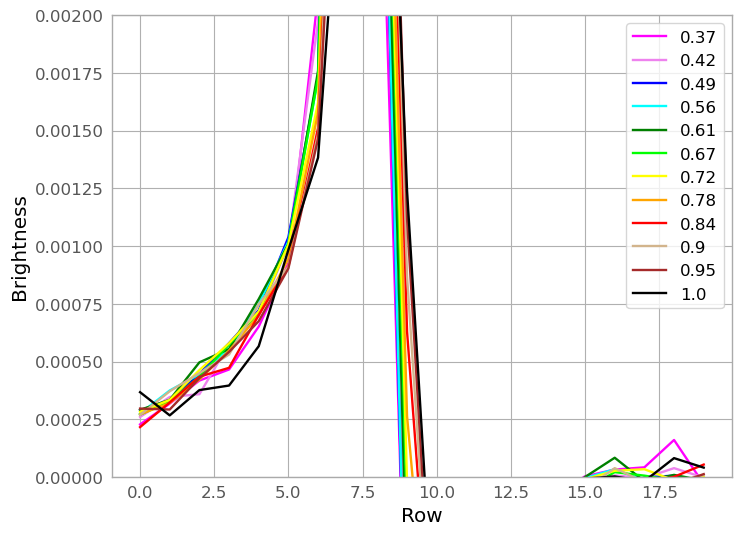

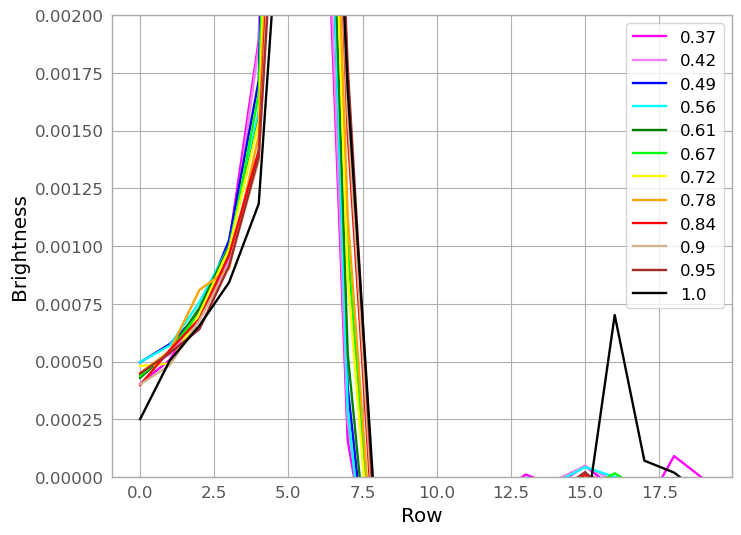

In [15]:
colors=['magenta','violet','blue','cyan','green','lime','yellow','orange','red','tan','brown','black']
for i in range(12):
    plt.plot(np.mean(spec003y[:,:,i], axis=0), color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.ylim([0,.002])
plt.show()
for i in range(12):
    plt.plot(np.mean(spec010y[:,:,i], axis=0), color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.ylim([0,.002])
plt.show()
for i in range(12):
    plt.plot(np.mean(spec001y[:,:,i], axis=0), color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.ylim([0,.002])
plt.show()
for i in range(12):
    plt.plot(np.mean(spec011y[:,:,i], axis=0), color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.ylim([0,.002])
plt.show()
for i in range(12):
    plt.plot(np.mean(spec007y[:,:,i], axis=0), color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.ylim([0,.002])
plt.show()

[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17.
 18. 19.]


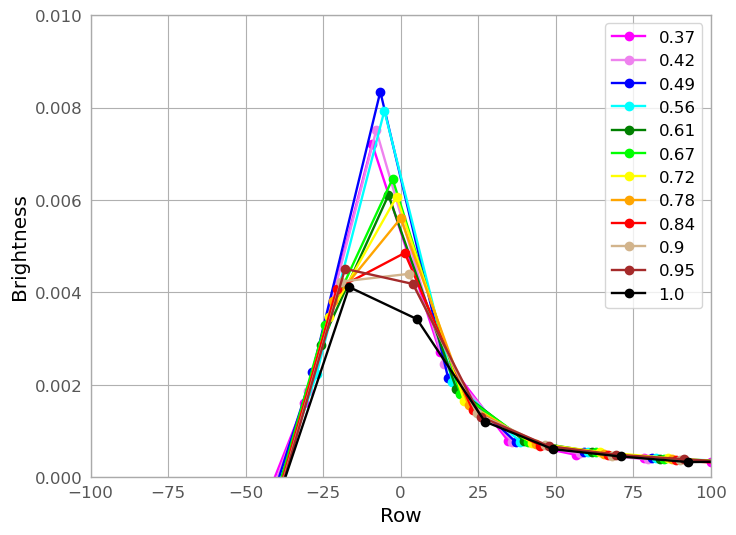

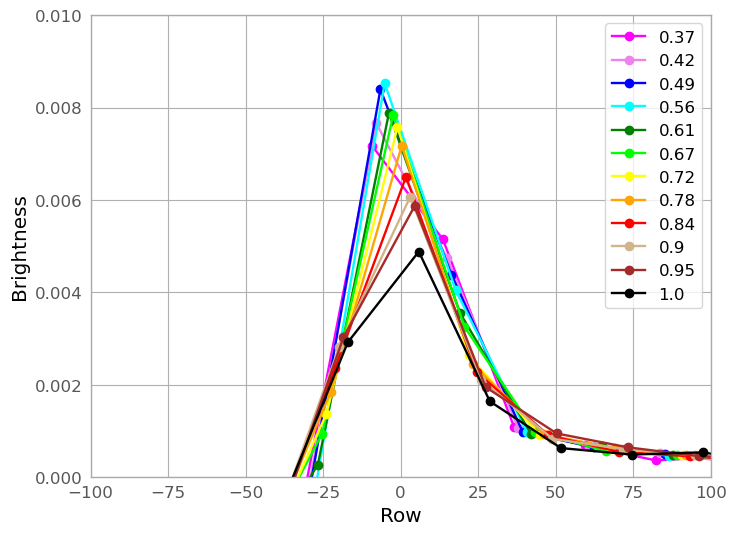

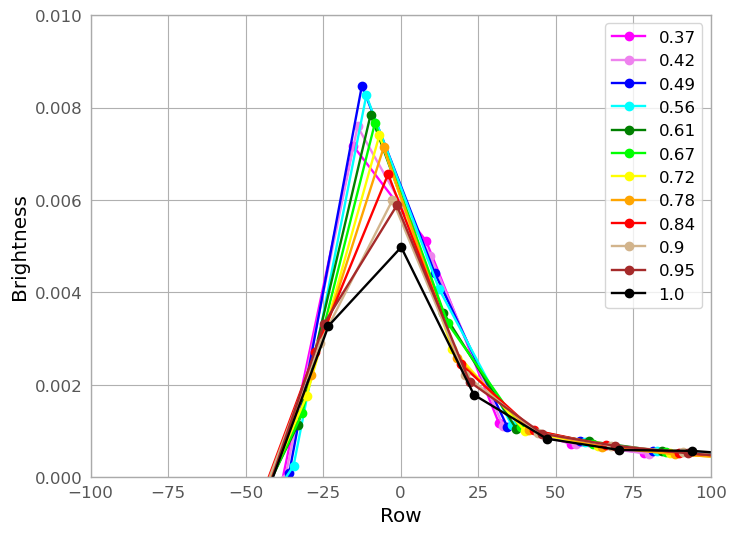

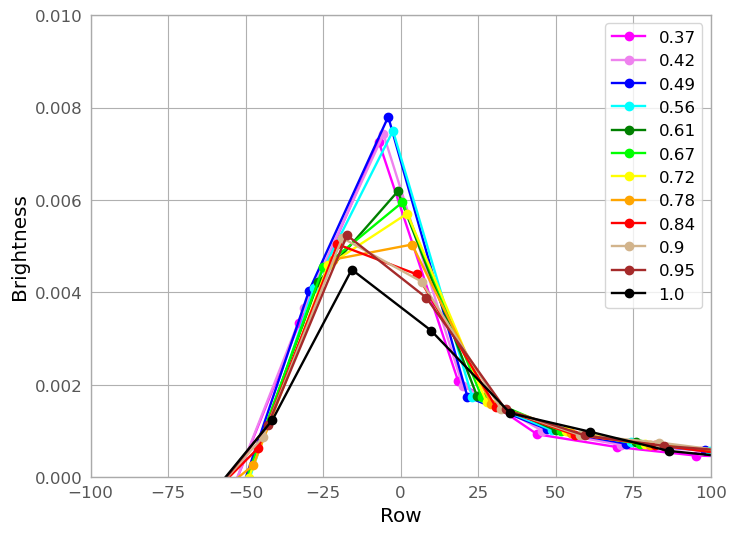

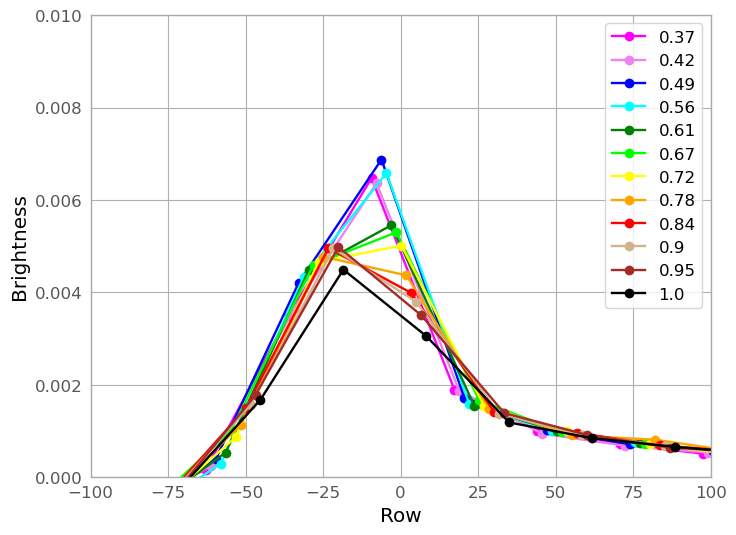

In [16]:
def zxfact(x,x0,range):
    z=-(x-x0)*.5e-3/3*range-250
    return z
olors=['magenta','violet','blue','cyan','green','lime','yellow','orange','red','tan','brown','black']
x=np.linspace(0,19,20)
print(x)
wf=-.0075*8
for i in range(12):
    plt.plot(zxfact(x+i*wf,19,np.mean(range003)), np.mean(spec003y[:,:,i], axis=0), 'o-',color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.ylim([0,.01])
plt.xlim([-100,100])
plt.show()
for i in range(12):
    plt.plot(zxfact(x+i*wf,15.5,np.mean(range010)),np.mean(spec010y[:,:,i], axis=0), 'o-',color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.ylim([0,.01])
plt.xlim([-100,100])
plt.show()
for i in range(12):
    plt.plot(zxfact(x+i*wf,17,np.mean(range001)),np.mean(spec001y[:,:,i], axis=0), 'o-',color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.ylim([0,.01])
plt.xlim([-100,100])
plt.show()
for i in range(12):
    plt.plot(zxfact(x+i*wf,16.5,np.mean(range011)),np.mean(spec011y[:,:,i], axis=0), 'o-',color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.ylim([0,.01])
plt.xlim([-100,100])
plt.show()
for i in range(12):
    plt.plot(zxfact(x+i*wf,14,np.mean(range007)),np.mean(spec007y[:,:,i], axis=0), 'o-',color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.ylim([0,.01])
plt.xlim([-100,100])
plt.show()

[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17.
 18. 19.]


/var/folders/1r/l15xqvtx5fj7vq10n8_wg3sr0000gn/T/ipykernel_72280/344108845.py:3: RuntimeWarning: invalid value encountered in sqrt
  zz=np.sqrt(z)/np.sqrt(250.+z)


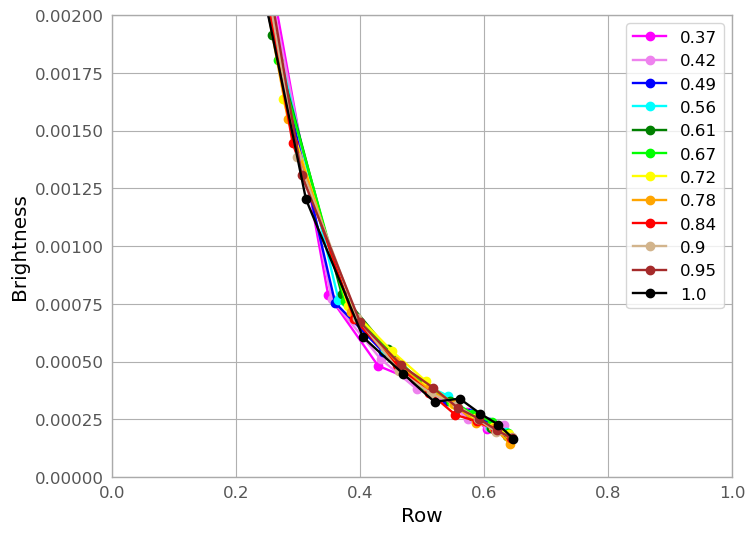

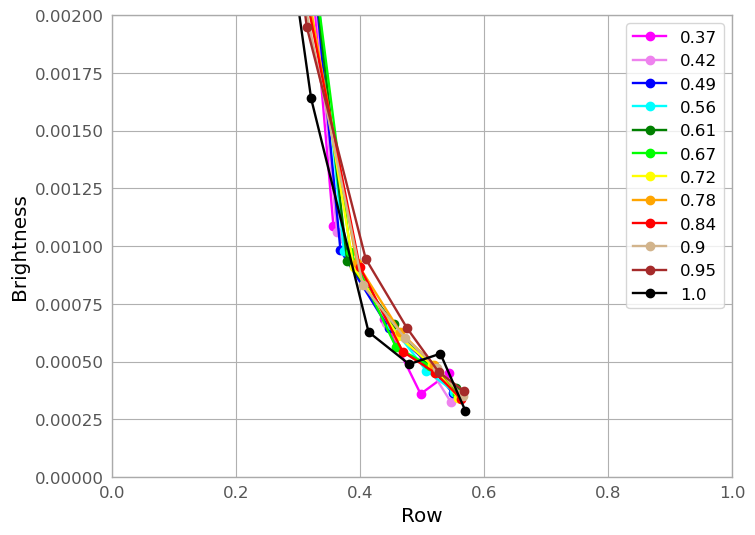

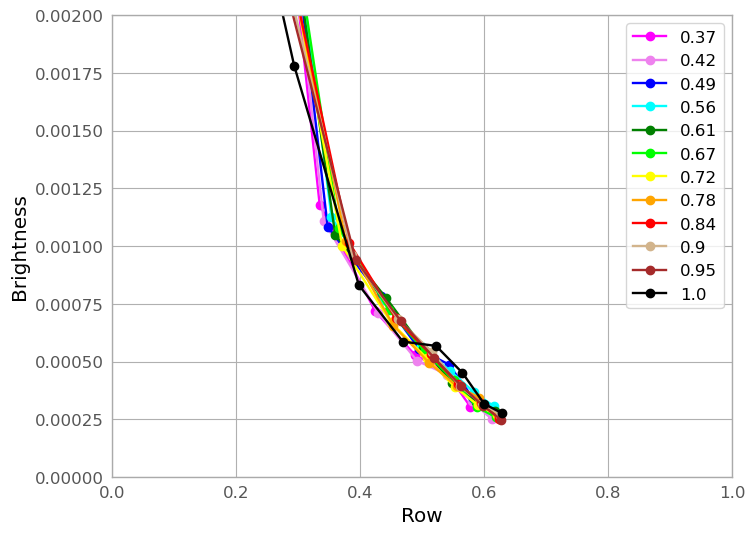

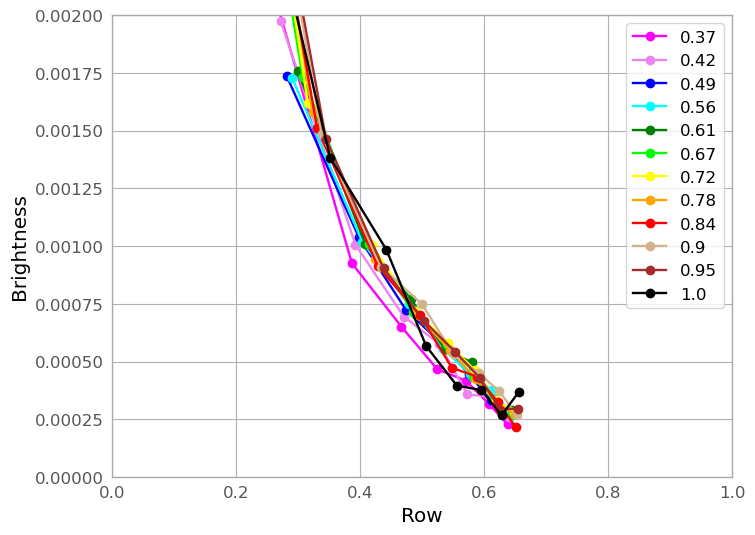

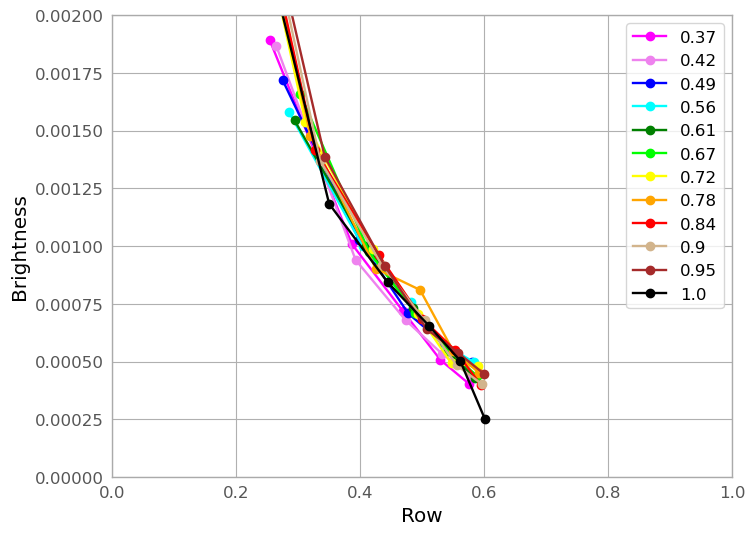

In [17]:
def zfact(x,x0,range):
    z=-(x-x0)*.5e-3/3*range-250
    zz=np.sqrt(z)/np.sqrt(250.+z)
    return zz

colors=['magenta','violet','blue','cyan','green','lime','yellow','orange','red','tan','brown','black']
x=np.linspace(0,19,20)
print(x)
wf=-.0075*8
for i in range(12):
    plt.plot(zfact(x+i*wf,19,np.mean(range003)), np.mean(spec003y[:,:,i], axis=0), 'o-',color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.ylim([0,.002])
plt.xlim([0,1])
plt.show()
for i in range(12):
    plt.plot(zfact(x+i*wf,15.5,np.mean(range010)),np.mean(spec010y[:,:,i], axis=0), 'o-',color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.ylim([0,.002])
plt.xlim([0,1])
plt.show()
for i in range(12):
    plt.plot(zfact(x+i*wf,17,np.mean(range001)),np.mean(spec001y[:,:,i], axis=0), 'o-',color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.ylim([0,.002])
plt.xlim([0,1])
plt.show()
for i in range(12):
    plt.plot(zfact(x+i*wf,16.5,np.mean(range011)),np.mean(spec011y[:,:,i], axis=0), 'o-',color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.ylim([0,.002])
plt.xlim([0,1])
plt.show()
for i in range(12):
    plt.plot(zfact(x+i*wf,14,np.mean(range007)),np.mean(spec007y[:,:,i], axis=0), 'o-',color=colors[i], label=np.fix(wave003y[0,0,i]*100)/100)
plt.legend()
plt.xlabel('Row')
plt.ylabel('Brightness')
plt.ylim([0,.002])
plt.xlim([0,1])
plt.show()

In [18]:
def plumespeccomp(specs,ranges,xc):
    nf=len(ranges)
    nx=len(specs[0,:,0])
    nnw=96
    specout=np.zeros([2,nnw])
    errout=np.zeros([2,nnw])
    zar=np.zeros([nf,nx])
    x=np.linspace(0,19,20)
    for i in range(96):
        dat=specs[:,:,i]
        xcf=xc+.0075*i
        for j in range(nf):
            zar[j,:]=-(x-xcf)*.5e-3/3*ranges[j]-250
        fooz=(zar>0)
        datx=dat[fooz]
        zarx=zar[fooz]
        zzx=np.sqrt(zarx)/np.sqrt(250.+zarx)
        if np.mod(i,10)==0:
            print(i)
            plt.plot(zzx,datx, 'ko')
            plt.ylim([0,.002])
        foozz=(np.abs(zzx-.5)<0.2) & (np.isnan(datx)==False)
        #print(datx[foozz])
        zzy=zzx[foozz]
        daty=datx[foozz]
        pars,pcov = np.polyfit((zzy-.5),daty, 1, cov=True)
        resy=daty-(pars[0]*(zzy-.5)+pars[1])
        #mz=np.median(resy)
        sz=np.std(resy)
        foow=np.abs(resy)<3*sz
        pars,pcov = np.polyfit((zzy[foow]-.5),daty[foow], 1, cov=True)
        if np.mod(i,10)==0:
            #plt.plot(zzy,resy, 'ro')
            plt.plot(zzy[foow],daty[foow], 'go')
            plt.ylim([0,.002])
            plt.show()
        specout[:,i]=pars
        errout[0,i]=np.sqrt(pcov[0,0])
        errout[1,i]=np.sqrt(pcov[1,1])
    return specout,errout    
        

0


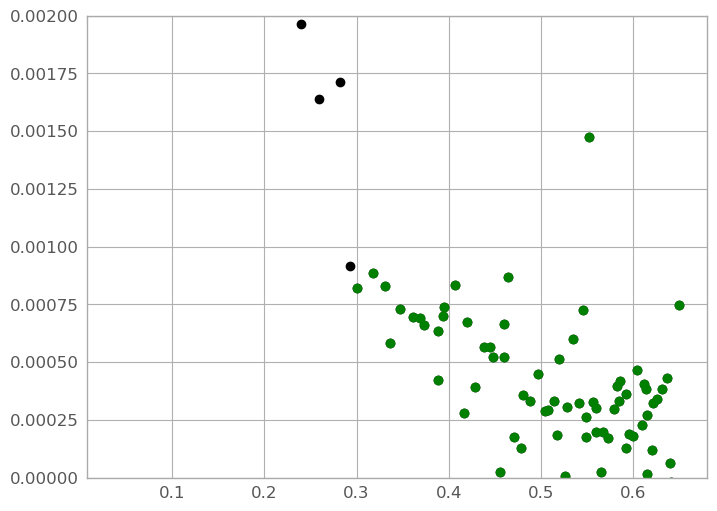

10


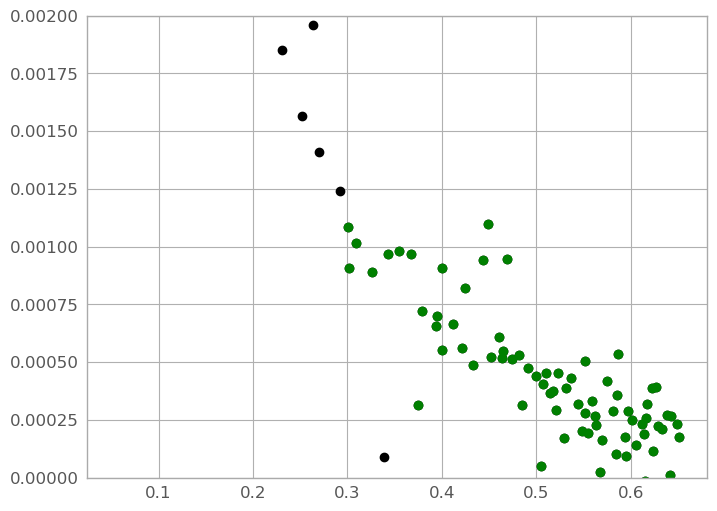

20


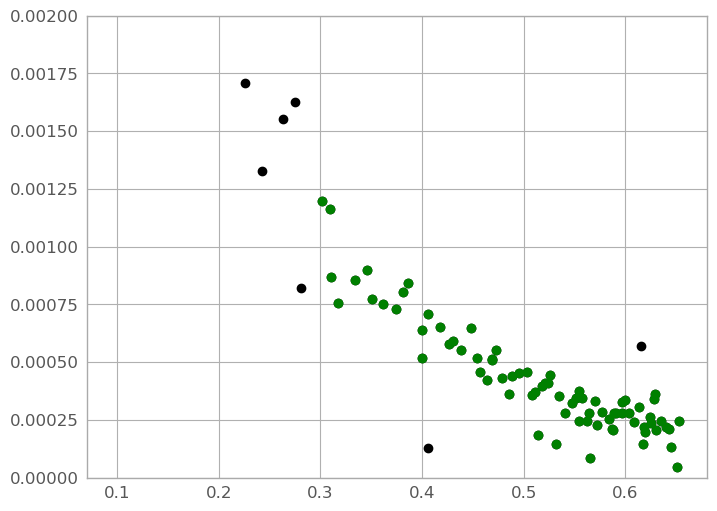

30


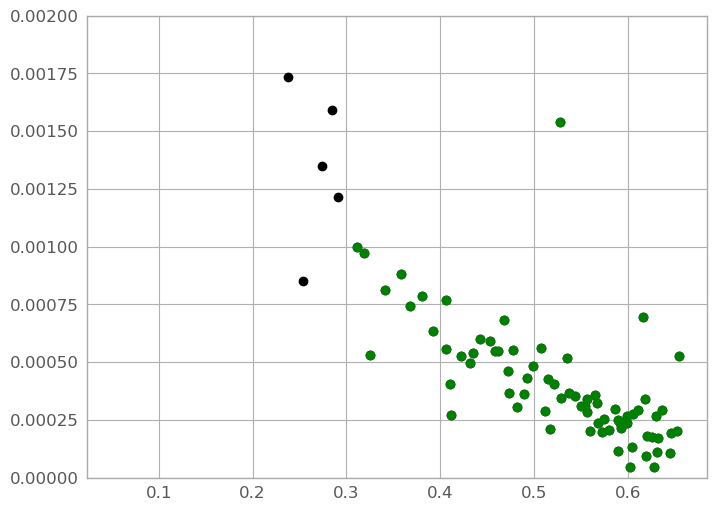

40


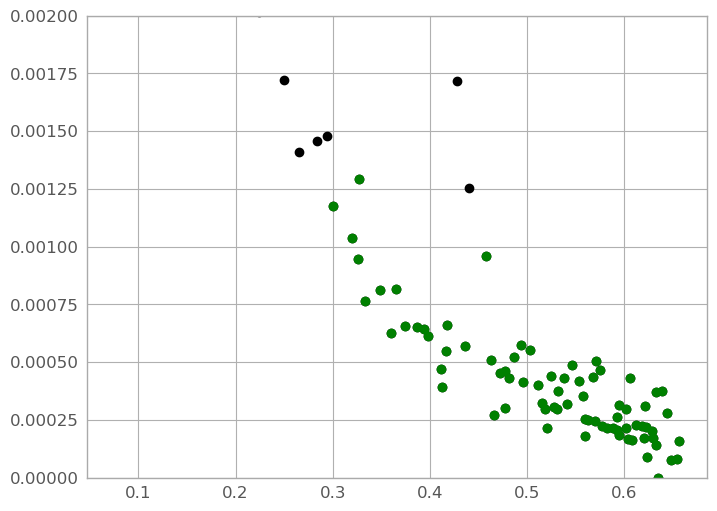

50


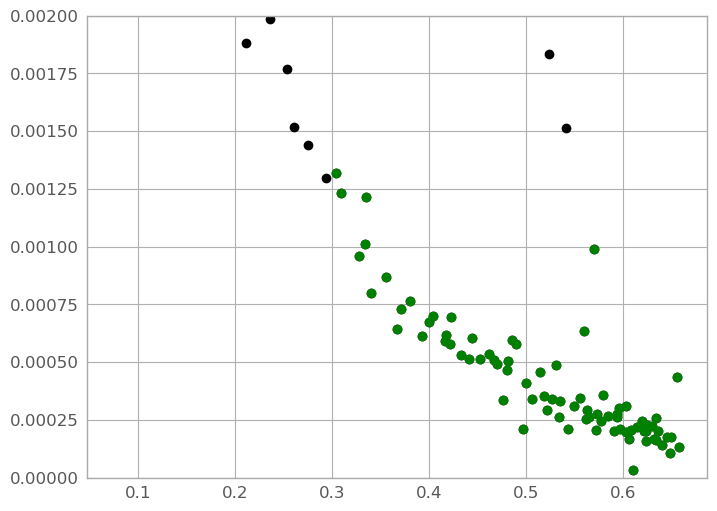

60


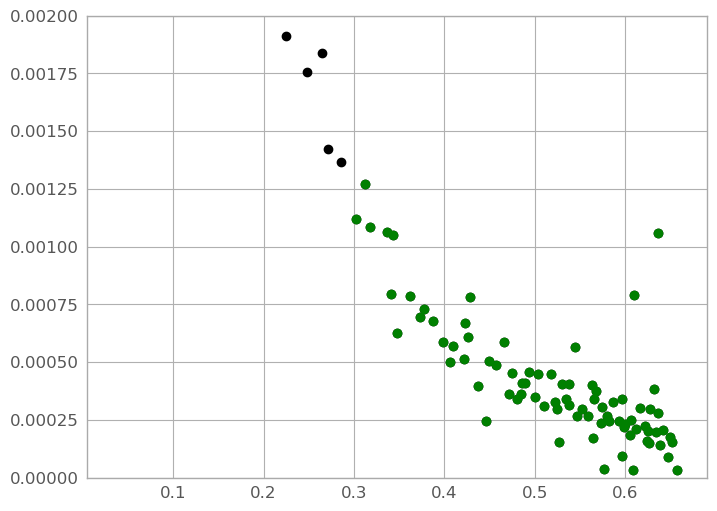

70


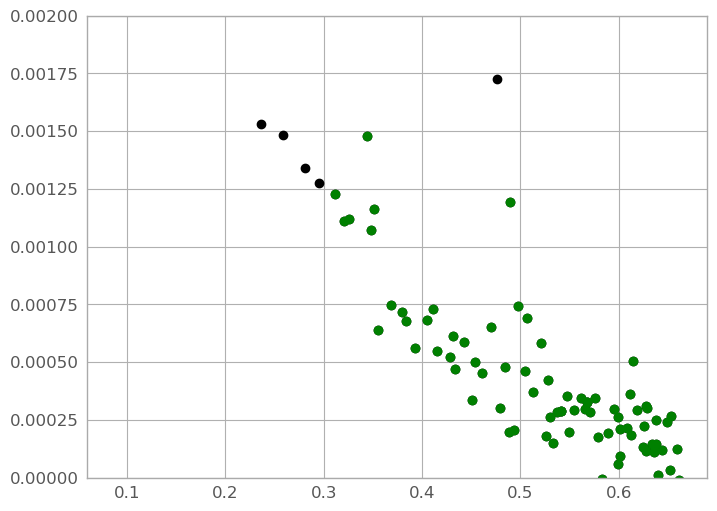

80


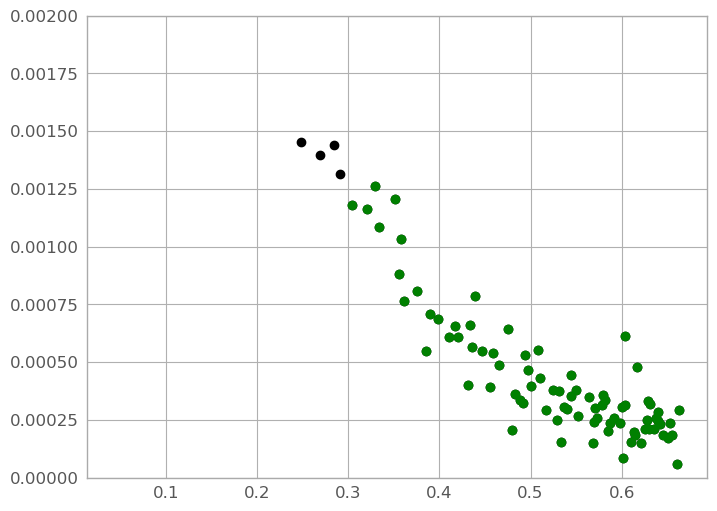

90


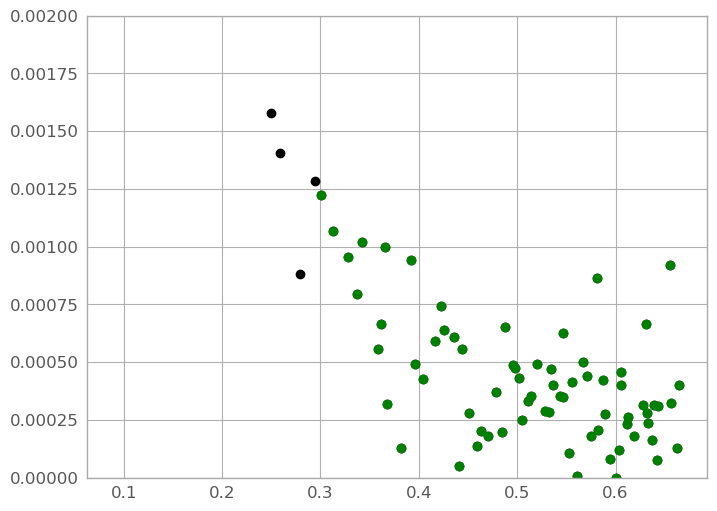

0


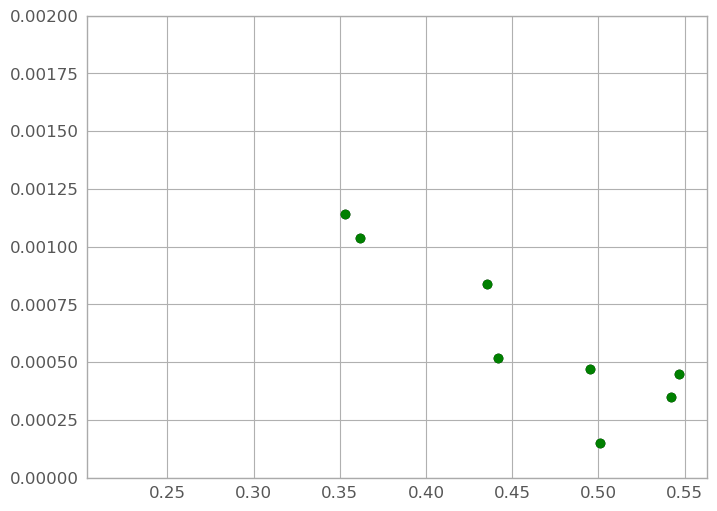

10


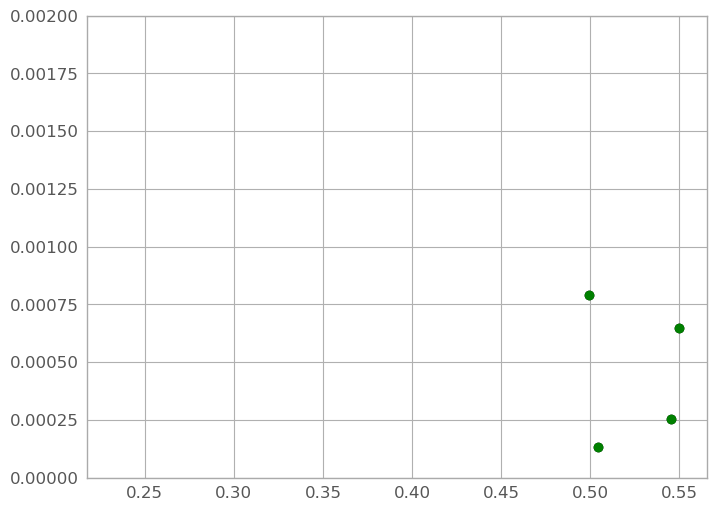

20


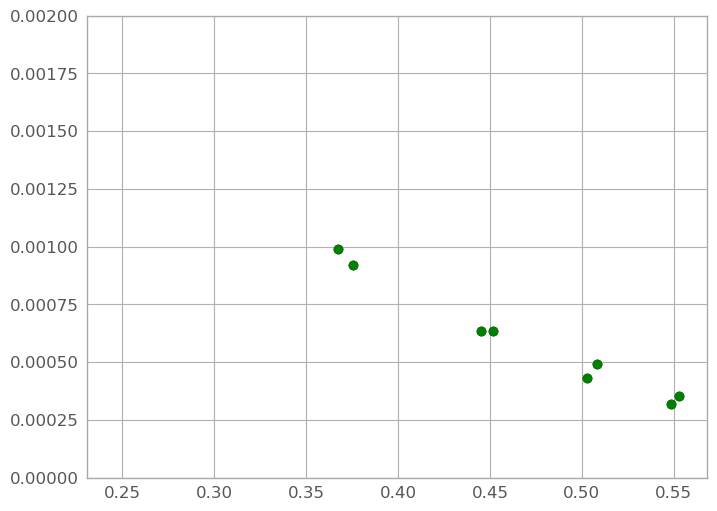

30


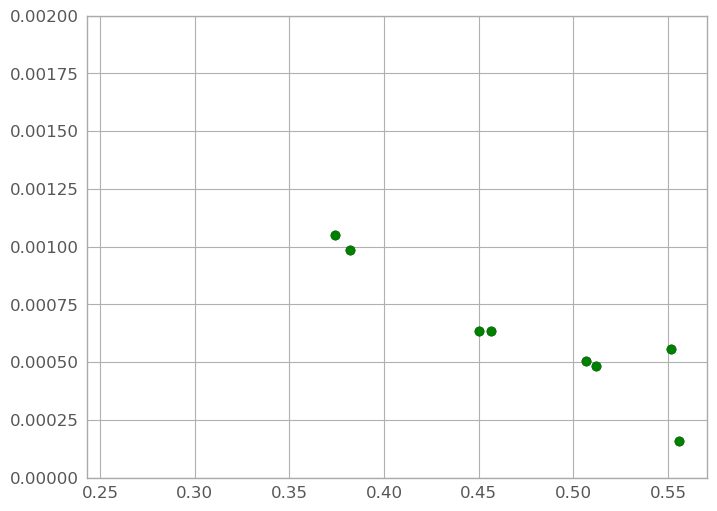

40


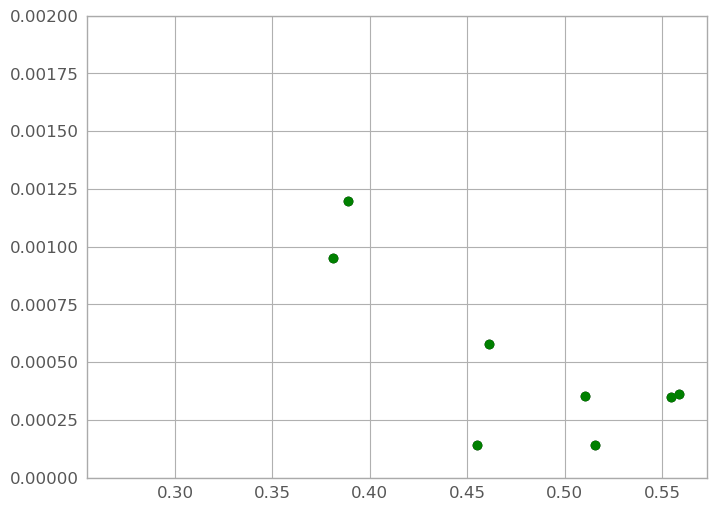

50


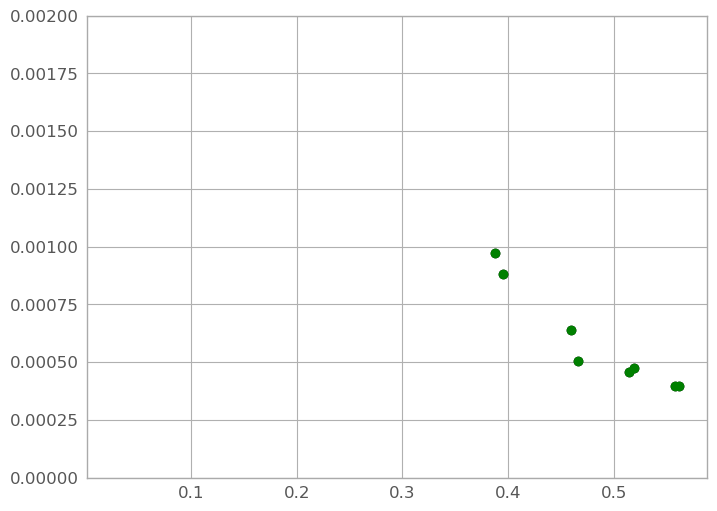

60


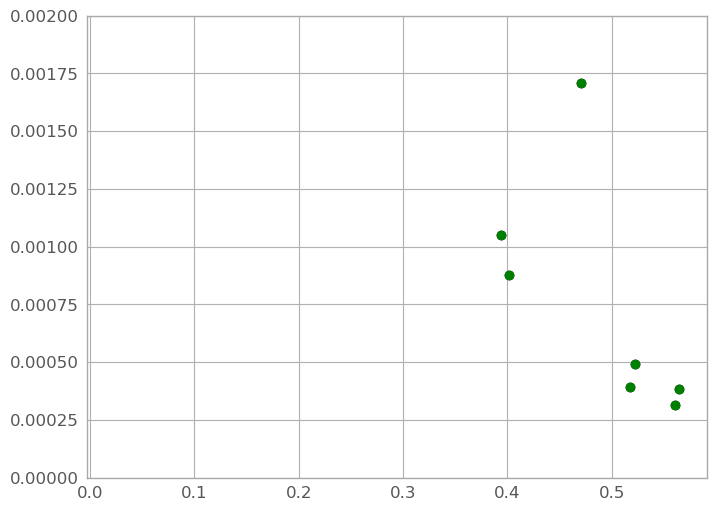

70


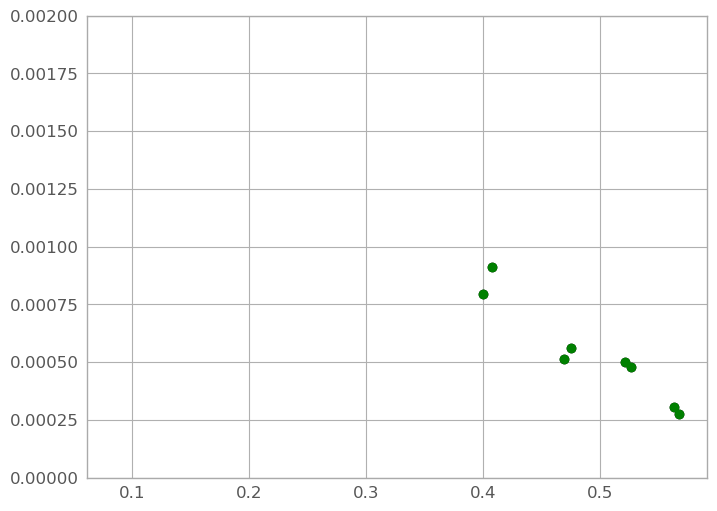

80


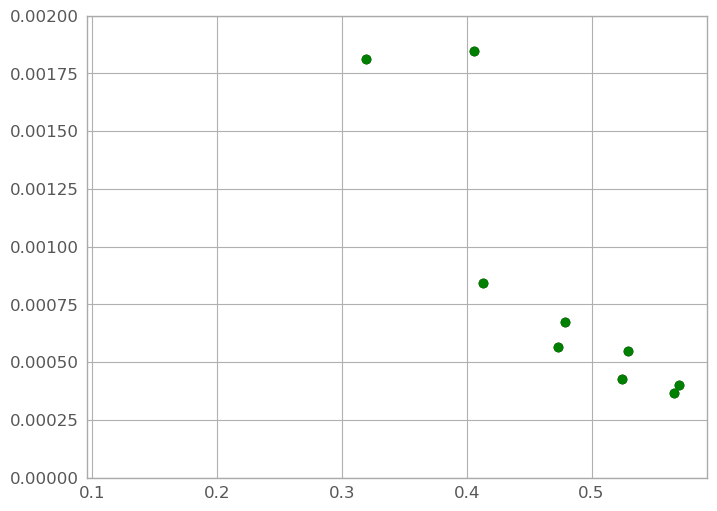

90


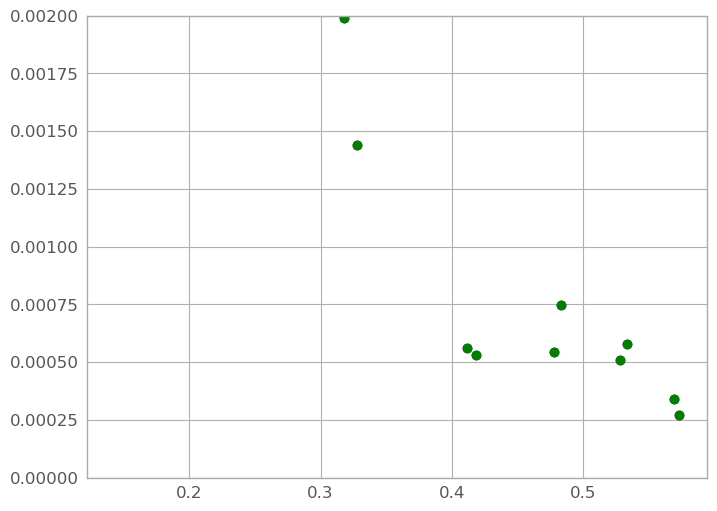

0


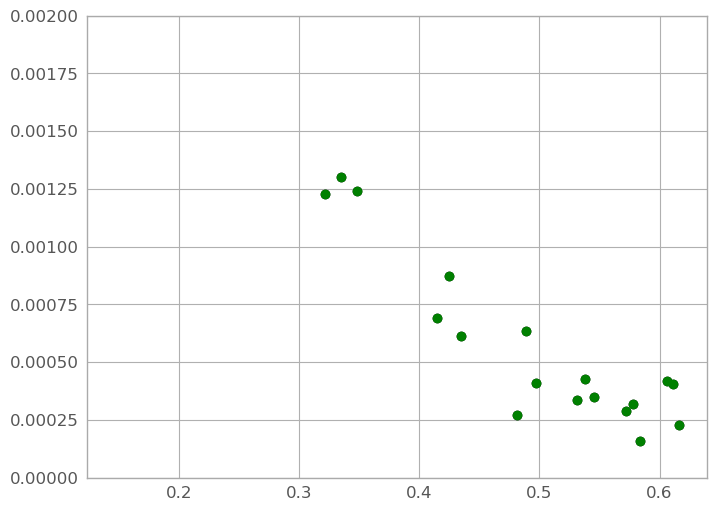

10


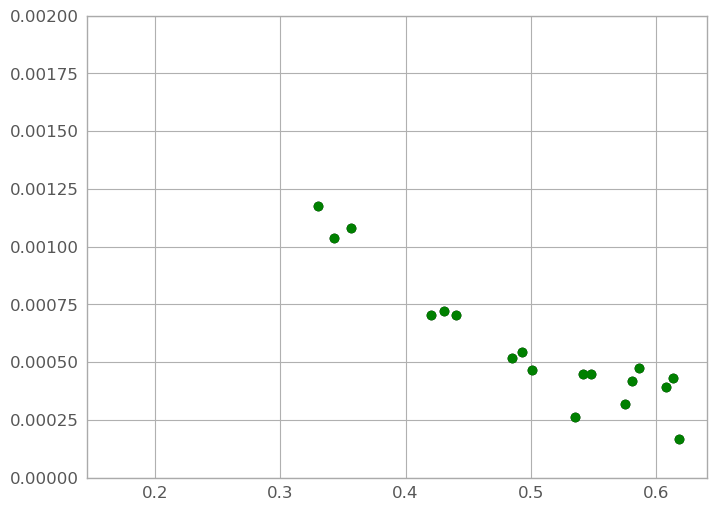

20


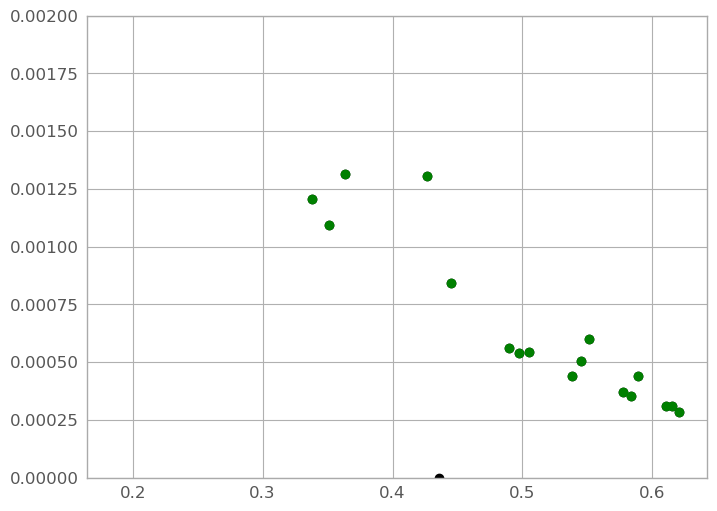

30


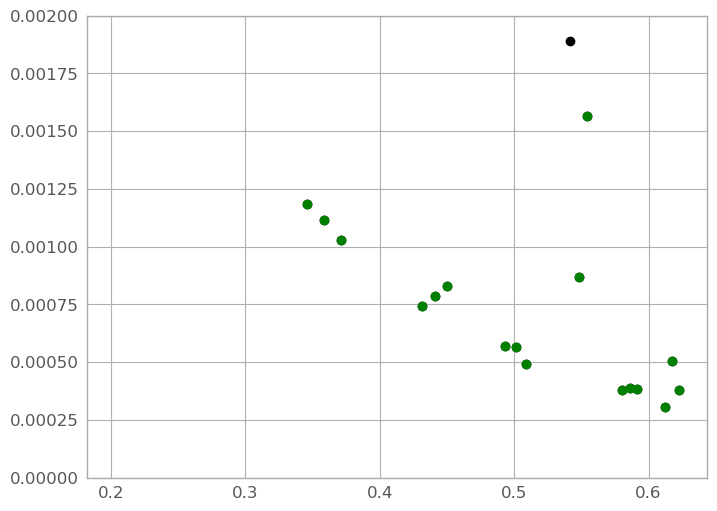

40


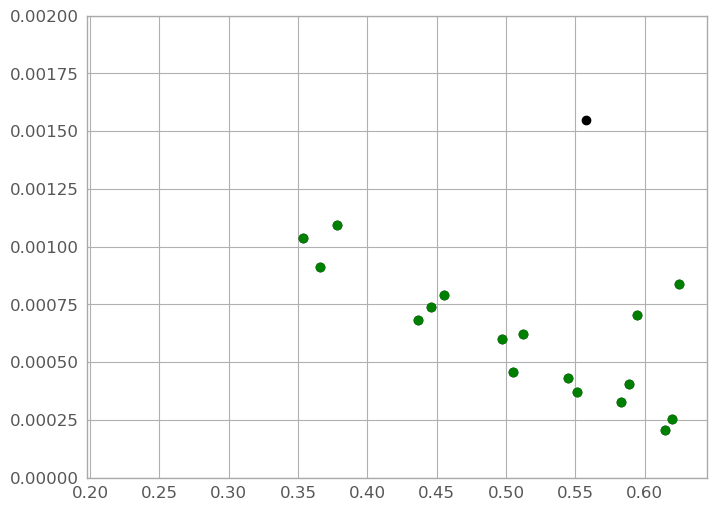

50


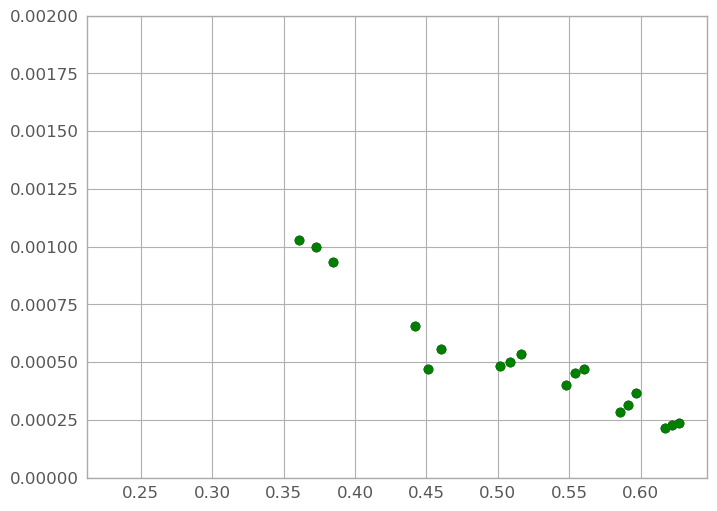

60


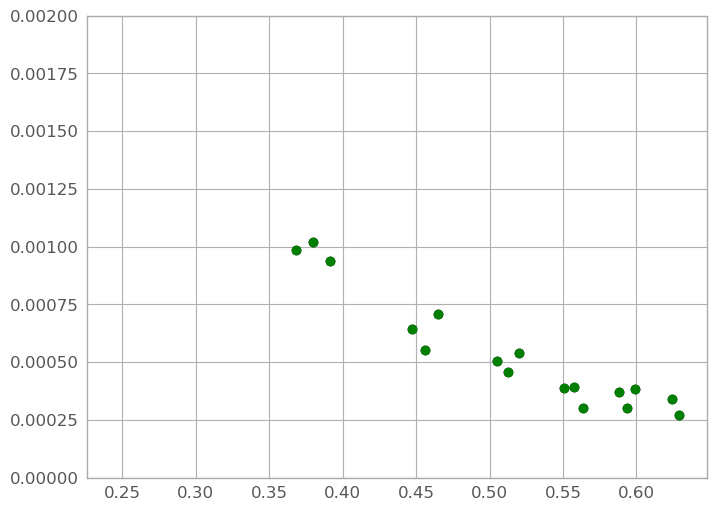

70


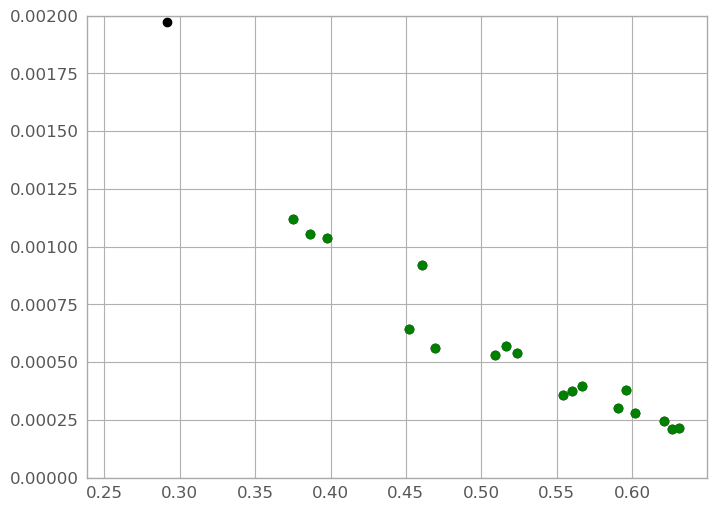

80


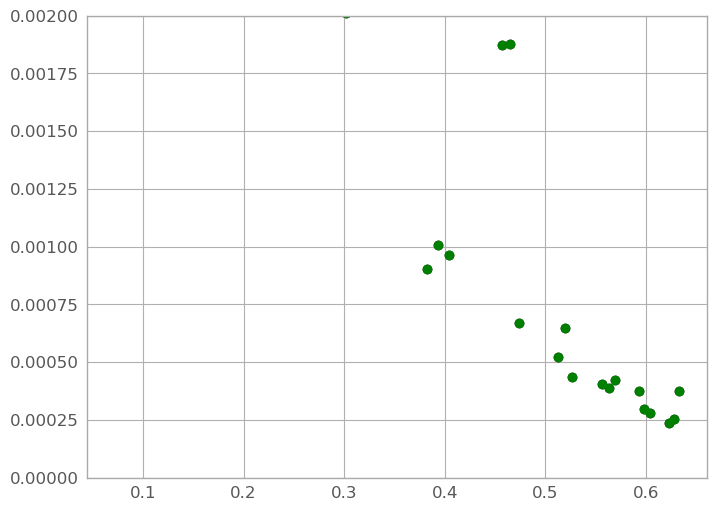

90


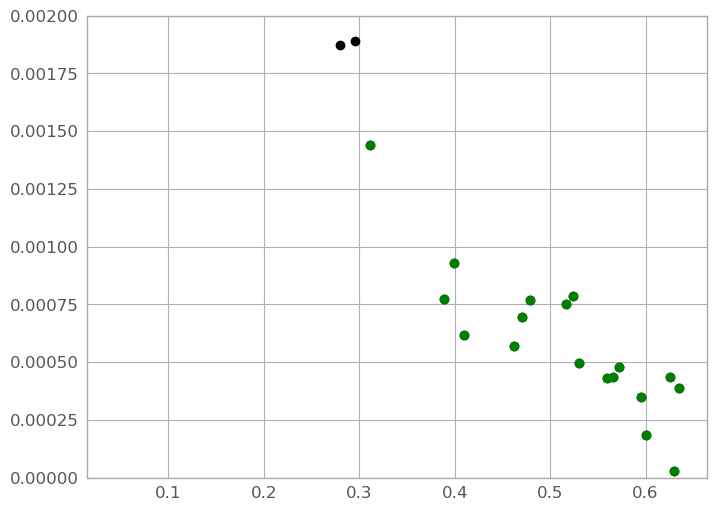

0


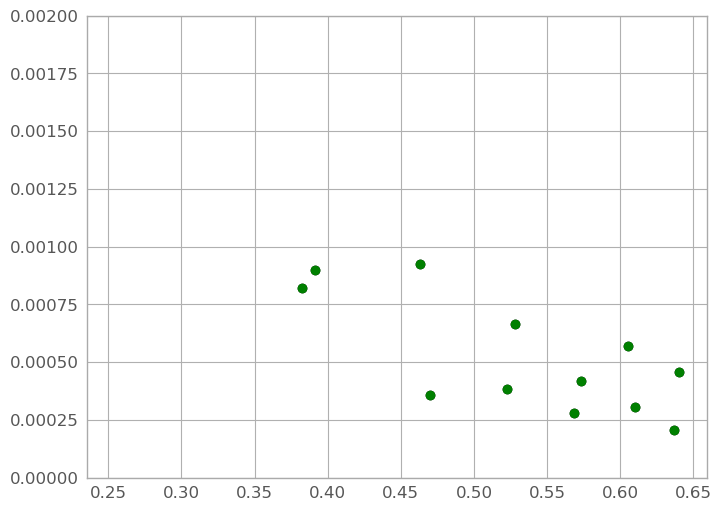

10


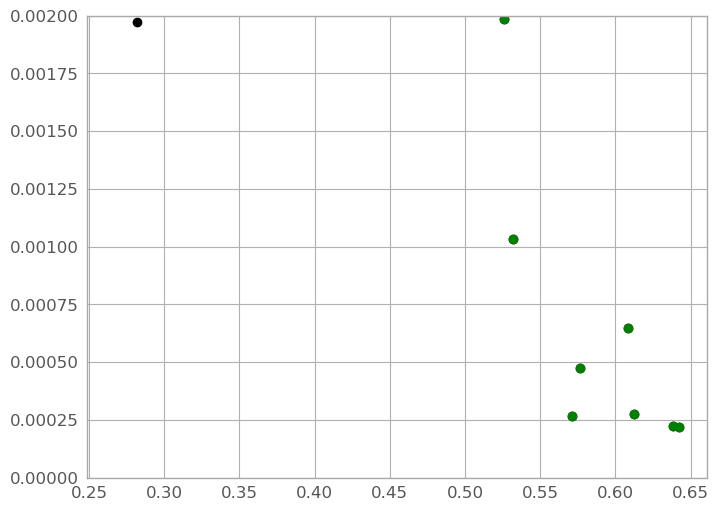

20


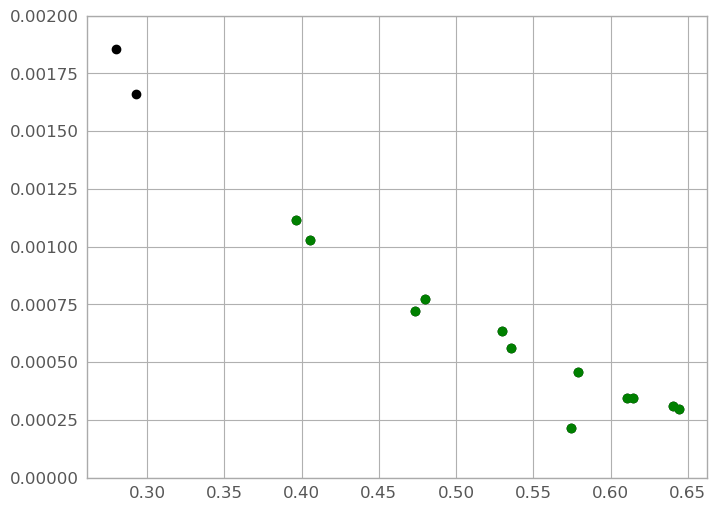

30


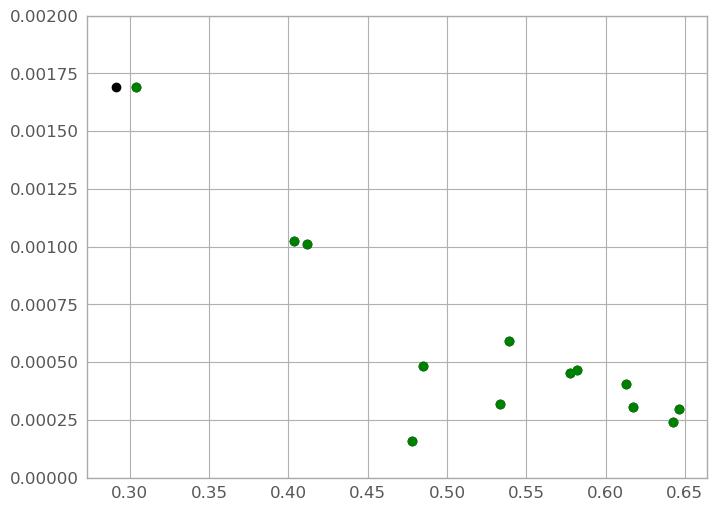

40


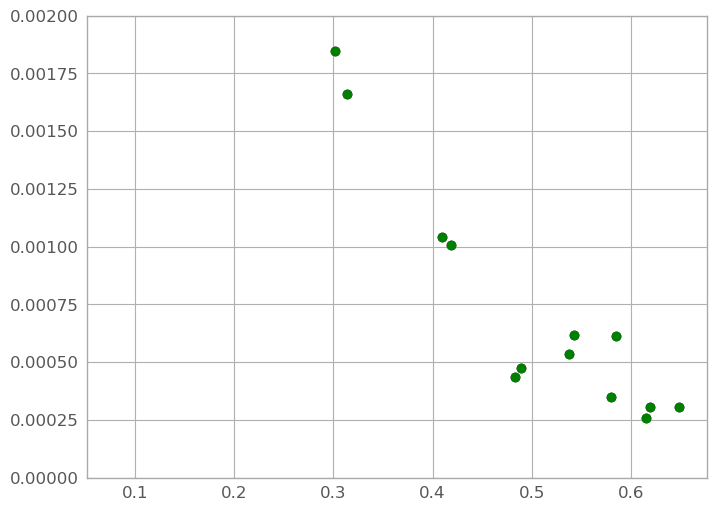

50


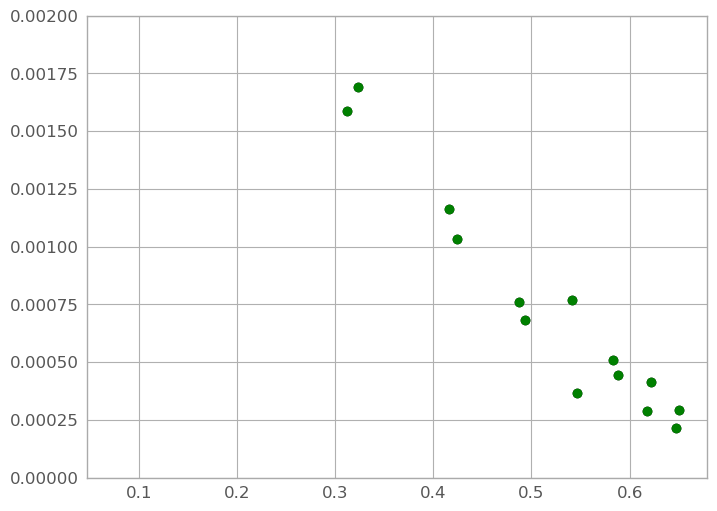

60


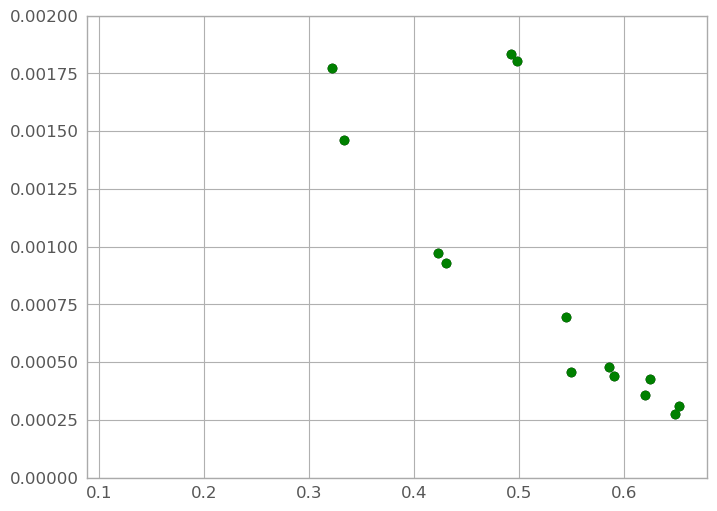

70


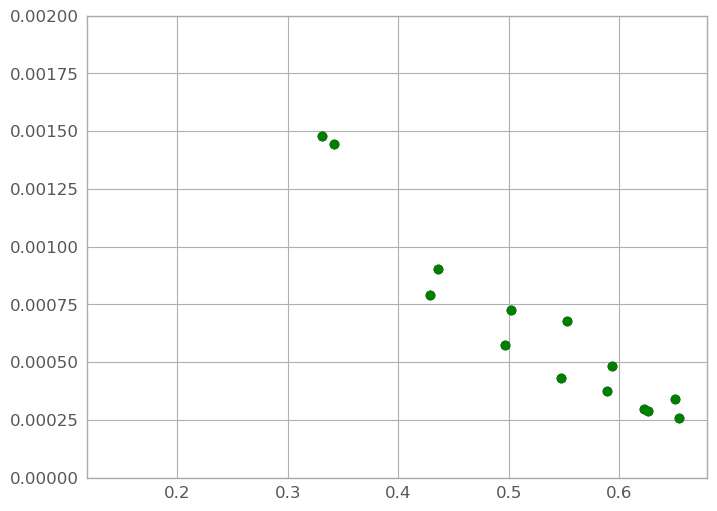

80


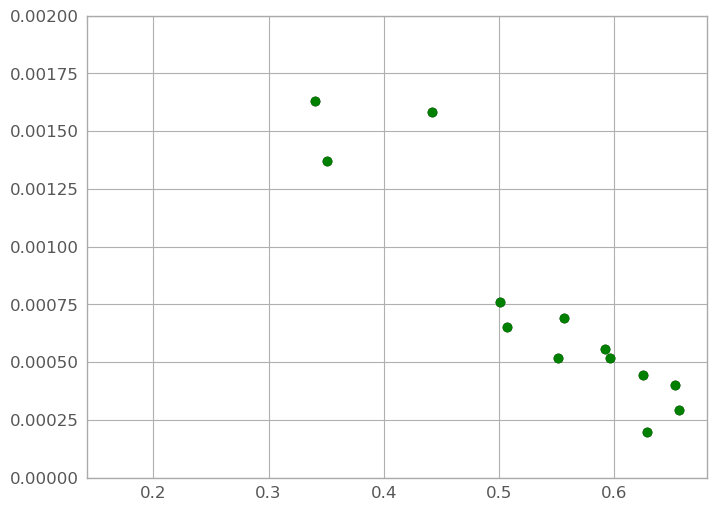

90


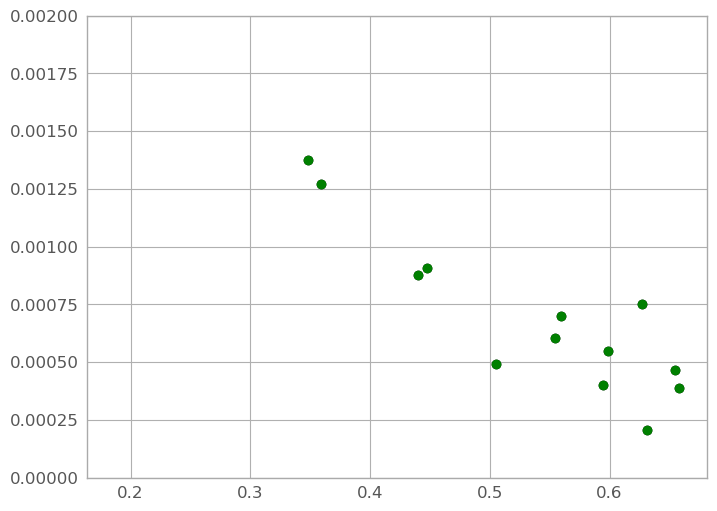

0


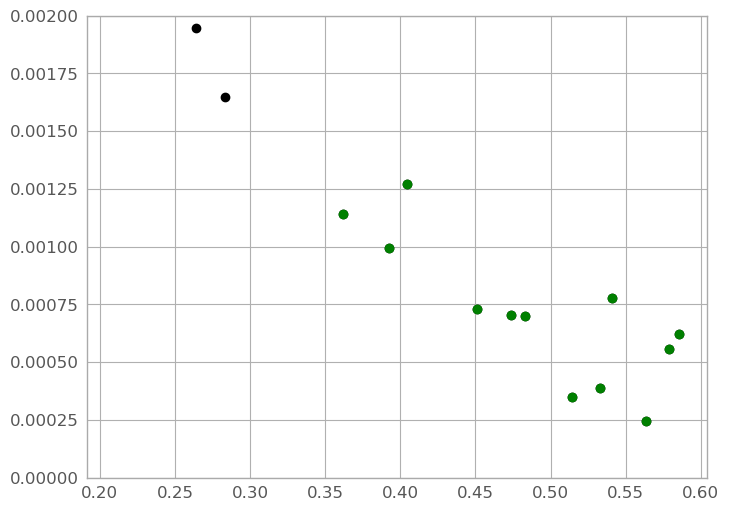

10


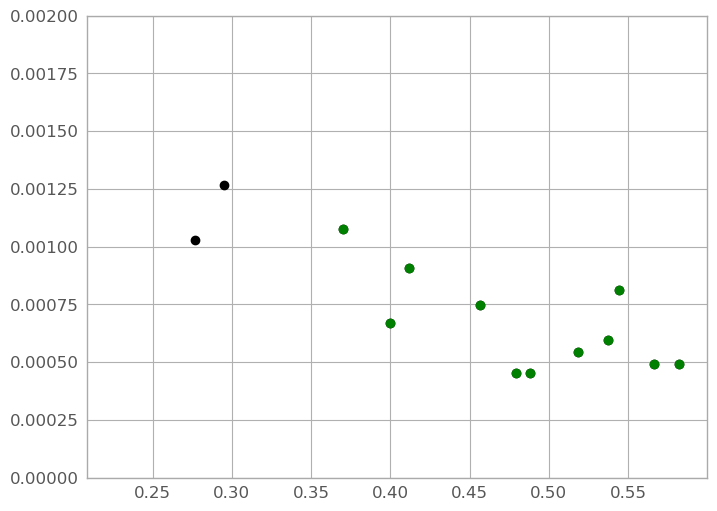

20


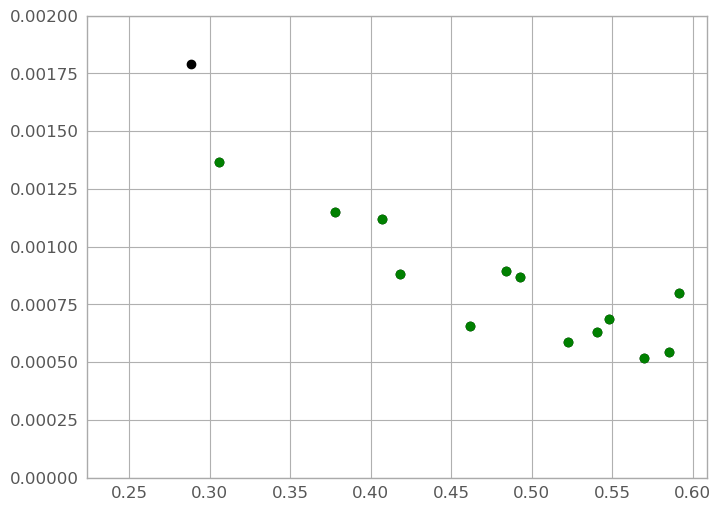

30


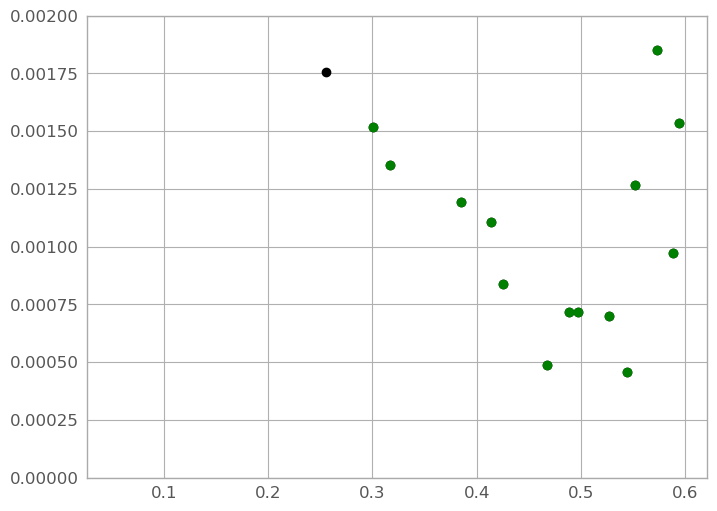

40


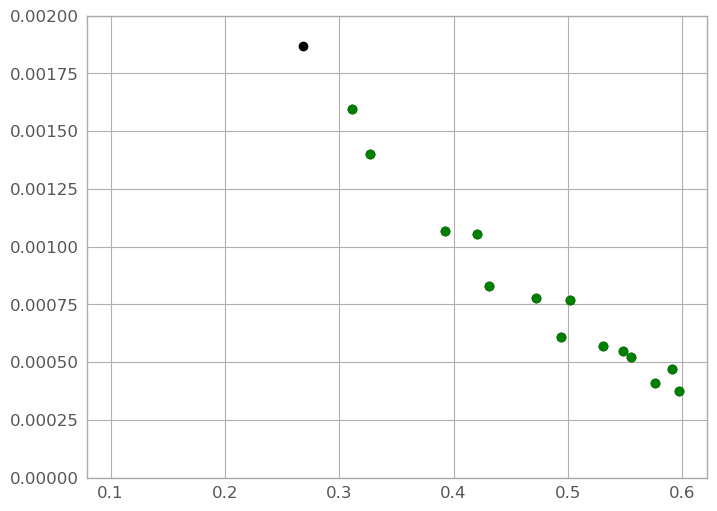

50


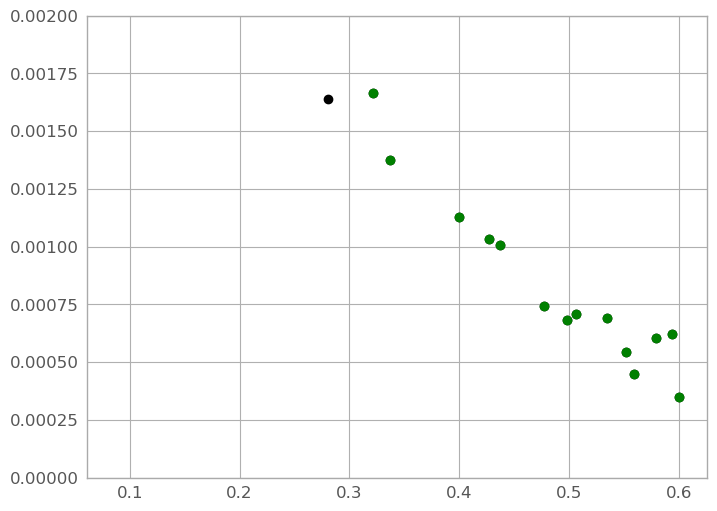

60


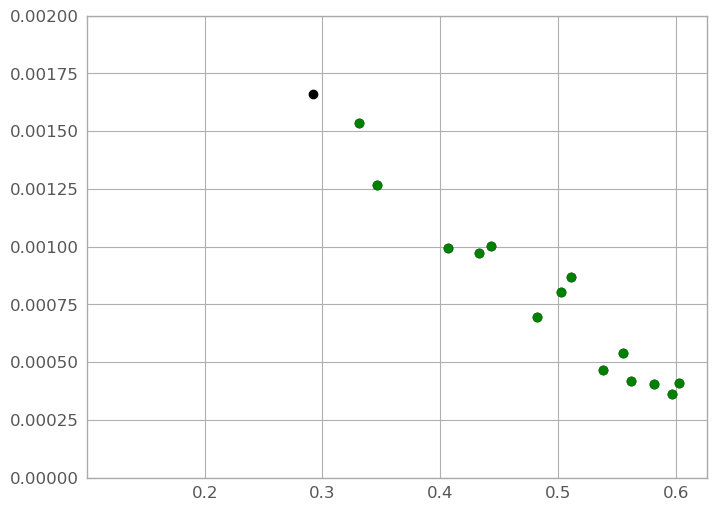

70


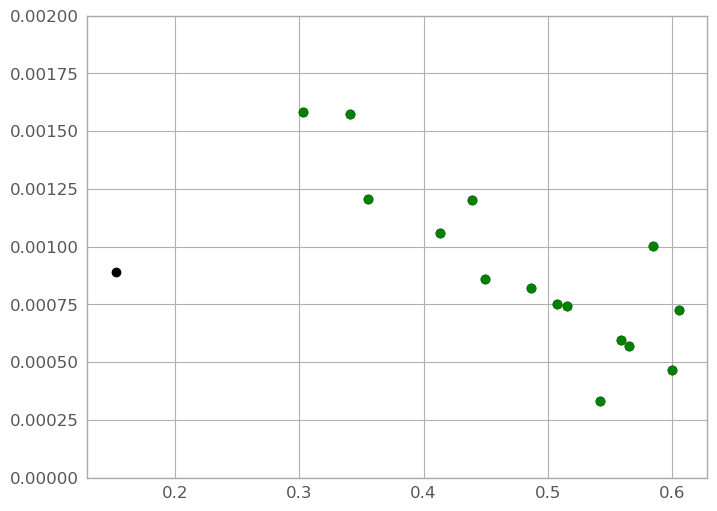

80


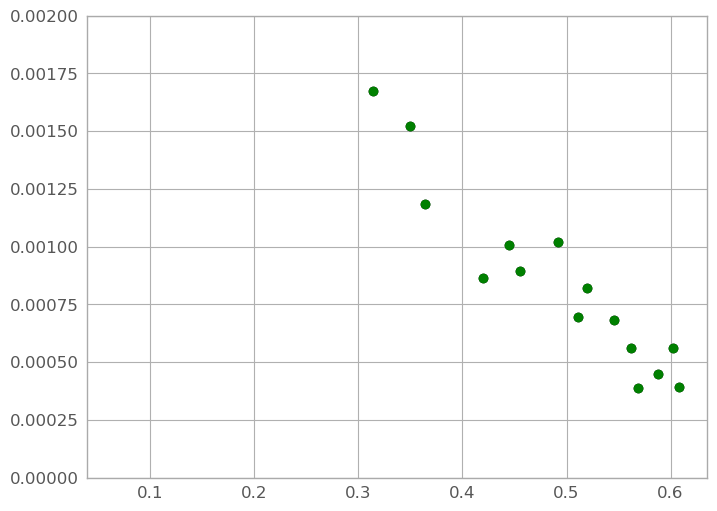

90


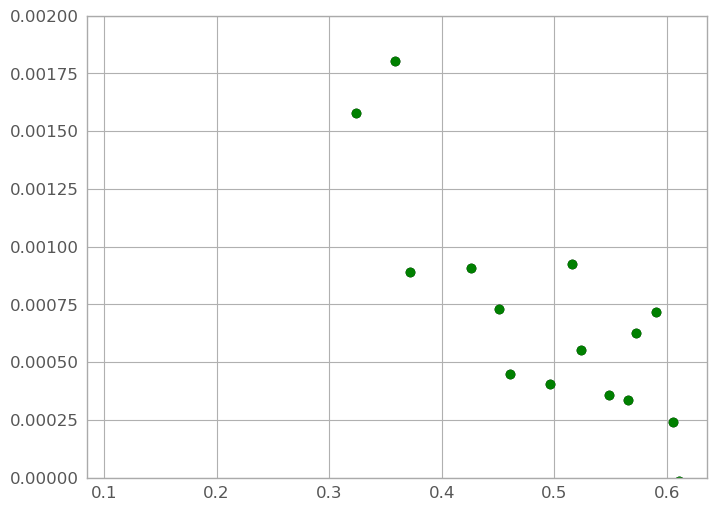

In [19]:
specout003, errout003=plumespeccomp(specs003,range003,19)
specout010, errout010=plumespeccomp(specs010,range010,15.5)
specout001, errout001=plumespeccomp(specs001,range001,17)
specout011, errout011=plumespeccomp(specs011,range011,16.5)
specout007, errout007=plumespeccomp(specs007,range007,14)

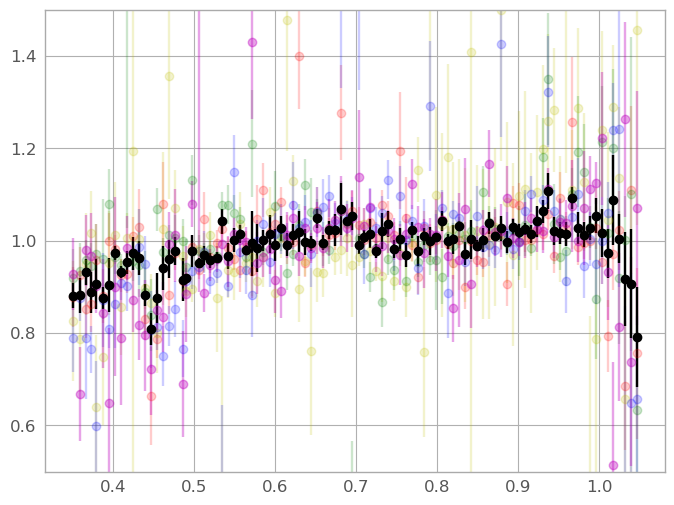

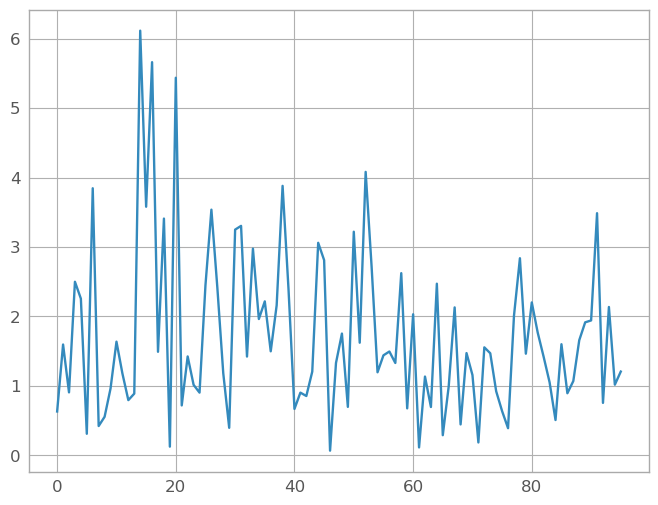

In [20]:
specoutx=np.zeros([5,2,96])
erroutx=np.zeros([5,2,96])
specoutx[0,:,:]=specout003
specoutx[1,:,:]=specout010
specoutx[2,:,:]=specout001
specoutx[3,:,:]=specout011
specoutx[4,:,:]=specout007
erroutx[0,:,:]=errout003
erroutx[1,:,:]=errout010
erroutx[2,:,:]=errout001
erroutx[3,:,:]=errout011
erroutx[4,:,:]=errout007
specouty=np.zeros([2,96])
chisqy=np.zeros([2,96])
errouty=np.zeros([2,96])
for i in range(96):
    for j in range(2):
        datx=np.zeros(5)
        errx=np.zeros(5)
        for k in range(5):
            datx[k]=specoutx[k,j,i]/np.median(specoutx[k,j,:])
            errx[k]=erroutx[k,j,i]/np.median(specoutx[k,j,:])
        specouty[j,i]=np.average(datx, weights=1/errx**2)
        chisq=np.sum((datx-specouty[j,i])**2/errx**2)/(len(datx)-1)
        chisqy[j,i]=chisq
        errouty[j,i]=np.sqrt(1/np.sum(1/errx**2)*chisq)


plt.errorbar(wavel, specout003[1,:]/np.median(specout003[1,:]), errout003[1,:]/np.median(specout003[1,:]),color='r', fmt='o', alpha=.2)
plt.errorbar(wavel, specout010[1,:]/np.median(specout010[1,:]), errout010[1,:]/np.median(specout010[1,:]),color='y', fmt='o', alpha=.2)
plt.errorbar(wavel, specout001[1,:]/np.median(specout001[1,:]), errout001[1,:]/np.median(specout001[1,:]),color='g', fmt='o', alpha=.2)
plt.errorbar(wavel, specout011[1,:]/np.median(specout011[1,:]), errout011[1,:]/np.median(specout011[1,:]),color='b', fmt='o', alpha=.2)
plt.errorbar(wavel, specout007[1,:]/np.median(specout007[1,:]), errout007[1,:]/np.median(specout007[1,:]),color='m', fmt='o', alpha=.2)
plt.errorbar(wavel, specout007[1,:]/np.median(specout007[1,:]), errout007[1,:]/np.median(specout007[1,:]),color='m', fmt='o', alpha=.2)
plt.errorbar(wavel, specouty[1,:]/np.median(specouty[1,:]), errouty[1,:]/np.median(specouty[1,:]),color='k', fmt='o')
#plt.plot(wavel, specout010[1,:]/np.median(specout010[1,:]),'yo')
#plt.plot(wavel, specout001[1,:]/np.median(specout001[1,:]),'go')
#plt.plot(wavel, specout011[1,:]/np.median(specout011[1,:]),'bo')
#plt.plot(wavel, specout007[1,:]/np.median(specout007[1,:]),'mo')
#plt.plot(wavel, specoutx[1,:]/np.median(specoutx[1,:]),'ko')
plt.ylim([.5,1.5])
plt.show()
plt.plot(chisqy[1,:])
plt.show()

In [22]:
filex003=['V'+x[3:13] for x in files003]
filex010=['V'+x[3:13] for x in files010]
filex001=['V'+x[3:13] for x in files001]
filex011=['V'+x[3:13] for x in files011]
filex007=['V'+x[3:13] for x in files007]



In [23]:
def encvisspece3(file,ny):
    dat=readsav(file)
    qubc=dat.qub[:,0:96,:]
    waves=dat.wavel
    nw=96
    nx=len(qubc[:,0,0])
    #ny=len(qubc[0,0,:])
    qubx=np.zeros([nx,nw,ny])
    specs=np.zeros([ny,nw])
    errs=np.zeros([ny,nw])
    for k in range(ny):
        for j in range(96):
                dats=qubc[:,j,k]-np.mean(qubc[0:3,j,k])
                datp=dats[0:4]
                datb=dats[10:20]
                mb=np.nanmedian(datb) ##Note added nan to make function 080225
                sb=np.nanstd(datb)
                foob=(datb-mb)<3*sb
                sigb=np.nanmean(datb[foob])
                errb=np.std(datb[foob])
                mp=np.nanmedian(datp)
                sp=np.std(datp)
                foop=(datp-mp)<10*sp
                specs[k,j]=np.mean(datp[foop])-sigb
                errs[k,j]=errb/np.sqrt(len(datp)-1)
    return(specs,errs)

In [24]:
specs003e=np.zeros([len(files003),40,96])
errs003e=np.zeros([len(files003),40,96])
for i in range(len(files003)):
    specs003e[i,:,:], errs003e[i,:,:]=encvisspece3('S16_ENC/'+files003[i],40)
specs010e=np.zeros([len(files010),27,96])
errs010e=np.zeros([len(files010),27,96])
for i in range(len(files010)):
    specs010e[i,:,:], errs010e[i,:,:]=encvisspece3('S16_ENC/'+files010[i],27)
specs001e=np.zeros([len(files001),30,96])
errs001e=np.zeros([len(files001),30,96])
for i in range(len(files001)):
    specs001e[i,:,:], errs001e[i,:,:]=encvisspece3('S16_ENC/'+files001[i],30)
specs011e=np.zeros([len(files010),30,96])
errs011e=np.zeros([len(files010),30,96])
for i in range(len(files011)):
    specs011e[i,:,:], errs011e[i,:,:]=encvisspece3('S16_ENC/'+files011[i],30)
specs007e=np.zeros([len(files007),24,96])
errs007e=np.zeros([len(files007),24,96])
for i in range(len(files007)):
    specs007e[i,:,:], errs007e[i,:,:]=encvisspece3('S16_ENC/'+files007[i],24)

/opt/anaconda3/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:3904: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/anaconda3/lib/python3.13/site-packages/numpy/_core/_methods.py:147: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
/var/folders/1r/l15xqvtx5fj7vq10n8_wg3sr0000gn/T/ipykernel_72280/4013810740.py:19: RuntimeWarning: Mean of empty slice
  sigb=np.nanmean(datb[foob])
/opt/anaconda3/lib/python3.13/site-packages/numpy/_core/_methods.py:227: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/opt/anaconda3/lib/python3.13/site-packages/numpy/_core/_methods.py:184: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/opt/anaconda3/lib/python3.13/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


In [25]:
spec003ex=np.zeros([len(files003),40,96])
spec010ex=np.zeros([len(files010),27,96])
spec001ex=np.zeros([len(files001),30,96])
spec011ex=np.zeros([len(files011),30,96])
spec007ex=np.zeros([len(files007),24,96])
err003ex=np.zeros([len(files003),40,96])
err010ex=np.zeros([len(files010),27,96])
err001ex=np.zeros([len(files001),30,96])
err011ex=np.zeros([len(files011),30,96])
err007ex=np.zeros([len(files007),24,96])
for i in range(len(files003)):
    for j in range(40):
        spec003ex[i,j,:]=specs003e[i,j,:]/np.nanmedian(specs003e[i,j,:])
        err003ex[i,j,:]=errs003e[i,j,:]/np.nanmedian(specs003e[i,j,:])
for i in range(len(files010)):
    for j in range(27):
        spec010ex[i,j,:]=specs010e[i,j,:]/np.nanmedian(specs010e[i,j,:])
        err010ex[i,j,:]=errs010e[i,j,:]/np.nanmedian(specs010e[i,j,:])
for i in range(len(files011)):
    for j in range(30):
        spec011ex[i,j,:]=specs011e[i,j,:]/np.nanmedian(specs011e[i,j,:])
        err011ex[i,j,:]=errs011e[i,j,:]/np.nanmedian(specs011e[i,j,:]) 
for i in range(len(files007)):
    for j in range(24):
        spec007ex[i,j,:]=specs007e[i,j,:]/np.nanmedian(specs007e[i,j,:])
        err007ex[i,j,:]=errs007e[i,j,:]/np.nanmedian(specs007e[i,j,:]) 


for i in range(len(files001)):
    for j in range(30):
        spec001ex[i,j,:]=specs001e[i,j,:]/np.nanmedian(specs001e[i,j,:])
        err001ex[i,j,:]=errs001e[i,j,:]/np.nanmedian(specs001e[i,j,:])


/var/folders/1r/l15xqvtx5fj7vq10n8_wg3sr0000gn/T/ipykernel_72280/2877208820.py:13: RuntimeWarning: divide by zero encountered in divide
  spec003ex[i,j,:]=specs003e[i,j,:]/np.nanmedian(specs003e[i,j,:])
/var/folders/1r/l15xqvtx5fj7vq10n8_wg3sr0000gn/T/ipykernel_72280/2877208820.py:13: RuntimeWarning: invalid value encountered in divide
  spec003ex[i,j,:]=specs003e[i,j,:]/np.nanmedian(specs003e[i,j,:])
/var/folders/1r/l15xqvtx5fj7vq10n8_wg3sr0000gn/T/ipykernel_72280/2877208820.py:14: RuntimeWarning: divide by zero encountered in divide
  err003ex[i,j,:]=errs003e[i,j,:]/np.nanmedian(specs003e[i,j,:])


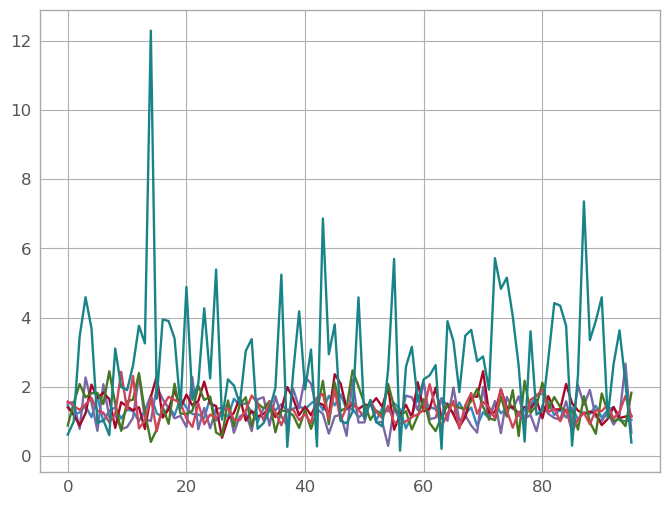

In [26]:
specez=np.zeros([5,96])
errez=np.zeros([5,96])
chi2ez=np.zeros([5,96])
for i in range(96):
    dat1=spec003ex[:,15:25,i]
    err1=err003ex[:,15:25,i]
    m=np.nanmedian(dat1)
    foo=np.abs(dat1-m)<3*err1
    if len(dat1[foo])>2:
        av=np.average(dat1[foo], weights=1/err1[foo]**2)
        chisq=np.sum((dat1[foo]-av)**2/err1[foo]**2)/(len(dat1[foo])-1)
        specez[0,i]=av
        errez[0,i]=np.sqrt(1/np.sum(1/err1[foo]**2)*chisq)
        chi2ez[0,i]=chisq
    dat1=spec010ex[:,10:20,i]
    err1=err010ex[:,10:20,i]
    m=np.nanmedian(dat1)
    foo=np.abs(dat1-m)<3*err1
    if len(dat1[foo])>2:
        av=np.average(dat1[foo], weights=1/err1[foo]**2)
        chisq=np.sum((dat1[foo]-av)**2/err1[foo]**2)/(len(dat1[foo])-1)
        specez[1,i]=av
        errez[1,i]=np.sqrt(1/np.sum(1/err1[foo]**2)*chisq)
        chi2ez[1,i]=chisq
    dat1=spec001ex[:,12:22,i]
    err1=err001ex[:,12:22,i]
    m=np.nanmedian(dat1)
    foo=np.abs(dat1-m)<3*err1
    if len(dat1[foo])>2:
        av=np.average(dat1[foo], weights=1/err1[foo]**2)
        chisq=np.sum((dat1[foo]-av)**2/err1[foo]**2)/(len(dat1[foo])-1)
        specez[2,i]=av
        errez[2,i]=np.sqrt(1/np.sum(1/err1[foo]**2)*chisq)
        chi2ez[2,i]=chisq
    dat1=spec011ex[:,12:22,i]
    err1=err011ex[:,12:22,i]
    m=np.nanmedian(dat1)
    foo=np.abs(dat1-m)<3*err1
    if len(dat1[foo])>2:
        av=np.average(dat1[foo], weights=1/err1[foo]**2)
        chisq=np.sum((dat1[foo]-av)**2/err1[foo]**2)/(len(dat1[foo])-1)
        specez[3,i]=av
        errez[3,i]=np.sqrt(1/np.sum(1/err1[foo]**2)*chisq)
        chi2ez[3,i]=chisq
    dat1=spec007ex[:,11:21,i]
    err1=err007ex[:,11:21,i]
    m=np.nanmedian(dat1)
    foo=np.abs(dat1-m)<3*err1
    if len(dat1[foo])>2:
        av=np.average(dat1[foo], weights=1/err1[foo]**2)
        chisq=np.sum((dat1[foo]-av)**2/err1[foo]**2)/(len(dat1[foo])-1)
        specez[4,i]=av
        errez[4,i]=np.sqrt(1/np.sum(1/err1[foo]**2)*chisq)
        chi2ez[4,i]=chisq

specezz=np.zeros(96)
errezz=np.zeros(96)
chi2ezz=np.zeros(96)
for i in range(96):
    specezz[i]=np.average(specez[:,i], weights=1/errez[:,i]**2)#/chi2ez[:,i])
    chi2ezz[i]=np.sum((specez[:,i]-specezz[i])**2/errez[:,i]**2)/4
    errezz[i]=np.sqrt(1/np.sum(1/errez[:,i]**2)*chi2ezz[i])
    #chi2ezz[i]=np.sum((specez[:,i]-specezz[i])**2/errez[:,i]**2)/4
for i in range(5):
    plt.plot(chi2ez[i,:])
plt.plot(chi2ezz)

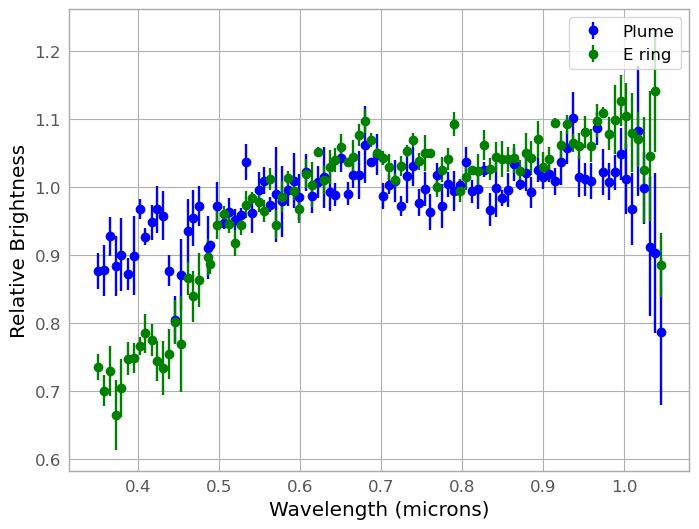

In [27]:
speczz=specouty[1,:]
errzz=errouty[1,:]

plt.errorbar(wavel, speczz, yerr=errzz, fmt='o', color='b', label='Plume')
plt.errorbar(wavel, specezz, yerr=errezz, fmt='o', color='g', label='E ring')
plt.legend()
plt.ylabel('Relative Brightness')
plt.xlabel('Wavelength (microns)')
plt.show()

import csv
with open('PlumeSpec_S16_revised_072525.csv', 'w', newline='') as csvfile:
            writer = csv.writer(csvfile, delimiter=',')
            for i in range(len(wavel)):
                dat=[wavel[i],speczz[i],errzz[i]]
                writer.writerow(dat)
with open('EringSpec_S16_revised 072525.csv', 'w', newline='') as csvfile:
            writer = csv.writer(csvfile, delimiter=',')
            for i in range(len(wavel)):
                dat=[wavel[i],specezz[i],errezz[i]]
                writer.writerow(dat)
with open('Combinedspec_S16_revised_081525.tex', 'w', newline='') as csvfile:
            writer = csv.writer(csvfile, delimiter='&')
            for i in range(48):
                j=i+48
                dat=[f'{wavel[i]:.4f}',f'{speczz[i]:.3f}',f'{errzz[i]:.3f}',f'{specezz[i]:.3f}',f'{errezz[i]:.3f}',
                    f'{wavel[j]:.4f}',f'{speczz[j]:.3f}',f'{errzz[j]:.3f}',f'{specezz[j]:.3f}',f'{errezz[j]:.3f}']
                writer.writerow(dat)

In [28]:
def wb08read(): 
    f=open('WB08_Iceconstants.csv','r')
    wavew=[]
    nw=[]
    kw=[]
    temp=[]
    #line=line.strip(',')
    #print(line)
    for line in f:
        line = line.strip()
        columns = line.split(',')
        wavew.append(float(columns[0]))
        nw.append(float(columns[1]))
        kw.append(float(columns[2]))
    wavew=np.array(wavew)
    nw=np.array(nw)
    kw=np.array(kw)
    return wavew,nw,kw

def khare84read(): 
    f=open('Khare84constants.txt','r')
    wavew=[]
    nw=[]
    kw=[]
    temp=[]
    #line=line.strip(',')
    #print(line)
    for line in f:
        line = line.strip()
        columns = line.split()
        wavew.append(float(columns[0]))
        nw.append(float(columns[2]))
        kw.append(float(columns[1]))
    wavew=np.array(wavew)
    nw=np.array(nw)
    kw=np.array(kw)
    return wavew,nw,kw

def hemaread():
    f=open('Hematite_EXC_constants.txt','r')
    header1=f.readline()
    header2=f.readline()
    header3=f.readline()
    header4=f.readline()
    header5=f.readline()
    header6=f.readline()
    header7=f.readline()
    header8=f.readline()
    header9=f.readline()
    header10=f.readline()
    header11=f.readline()
    wavew=[]
    nw=[]
    kw=[]
    for line in f:
        line = line.strip()
        columns = line.split()
        wavew.append(float(columns[0]))
        nw.append(float(columns[1]))
        kw.append(float(columns[2]))

    wavew=np.array(wavew)
    nw=np.array(nw)
    kw=np.array(kw)
    return wavew,nw,kw

In [29]:
wavew,nw,kw=wb08read()
wavek,nk,kk=khare84read()
waveh,nh,kh=hemaread()
nwfunc=interpolate.interp1d(wavew,nw)
kwfunc=interpolate.interp1d(wavew,kw)
nkfunc=interpolate.interp1d(wavek,nk)
kkfunc=interpolate.interp1d(wavek,kk)
nhfunc=interpolate.interp1d(waveh,nh)
khfunc=interpolate.interp1d(waveh,kh)
wavex=wavel
nwx=nwfunc(wavex)
kwx=kwfunc(wavex)
nxx=nhfunc(wavex)
kxx=khfunc(wavex)
epsw=(nwfunc(wavex)**2-kwfunc(wavex)**2)+1j*2*nwfunc(wavex)*kwfunc(wavex)
epsct=(nkfunc(wavex)**2-kkfunc(wavex)**2)+1j*2*nkfunc(wavex)*kkfunc(wavex)
epsch=(nhfunc(wavex)**2-khfunc(wavex)**2)+1j*2*nhfunc(wavex)*khfunc(wavex)
fs=np.array([0,.01,.02,.05,.1,.2,.5])
nf=len(fs)
nnw=len(wavex)
nmixh=np.zeros([nf,nnw])
kmixh=np.zeros([nf,nnw])
nmixt=np.zeros([nf,nnw])
kmixt=np.zeros([nf,nnw])

for i in range(nf):
    f=fs[i]
    epsxt=epsw*(1+3*f*(epsct-epsw)/(epsct+2*epsw)/(1-f*(epsct-epsw)/(epsct+2*epsw)))
    f=fs[i]*.1
    epsxh=epsw*(1+3*f*(epsch-epsw)/(epsch+2*epsw)/(1-f*(epsch-epsw)/(epsch+2*epsw)))
    nmixt[i,:]=np.sqrt(.5)*np.sqrt(np.sqrt(np.real(epsxt)**2+np.imag(epsxt)**2)+np.real(epsxt))
    kmixt[i,:]=np.sqrt(.5)*np.sqrt(np.sqrt(np.real(epsxt)**2+np.imag(epsxt)**2)-np.real(epsxt))
    nmixh[i,:]=np.sqrt(.5)*np.sqrt(np.sqrt(np.real(epsxh)**2+np.imag(epsxh)**2)+np.real(epsxh))
    kmixh[i,:]=np.sqrt(.5)*np.sqrt(np.sqrt(np.real(epsxh)**2+np.imag(epsxh)**2)-np.real(epsxh))

In [30]:
diameters=np.linspace(.1,5.1,51)*2
#sizedists=diameters**(-2.5)+0.4*diameters**(-4.5)
sizedists=diameters**(-2.6)

specpredt=np.zeros([nf,nnw])
specpredh=np.zeros([nf,nnw])
specpredc=np.zeros([nf,nnw])

for j in range(nf):
    print(j)
    for i in range(nnw):
        m=complex(nmixt[j,i],kmixt[j,i])
        theta1,SL, SR, SU =ps.SF_SD(m, wavex[i]*1000, diameters*1000, sizedists, 
                            minAngle=(20), maxAngle=(20.),
                            angularResolution =1.0, space='theta') 
        specpredt[j,i]=np.asarray(SU[0])*wavex[i]**2/(4*3.14159**2)

0
1
2
3
4
5
6


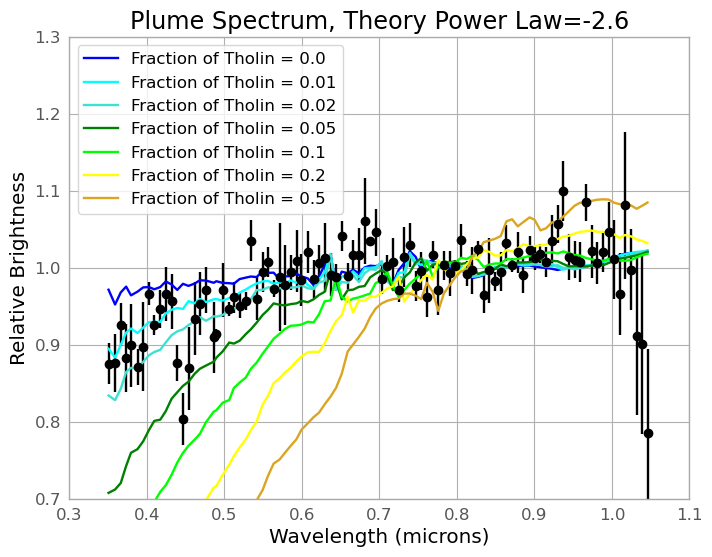

In [31]:
cols1=['blue','cyan','turquoise','green','lime','yellow','goldenrod']
foo=(wavex>0.7) & (wavex<0.9)
plt.errorbar(wavel, speczz/np.mean(speczz[foo]), yerr=errzz/np.mean(speczz[foo]), fmt='o', color='k')

for i in range(nf):
    plt.plot(wavex, specpredt[i,:]/np.mean(specpredt[i,foo]), color=cols1[i],
               label='Fraction of Tholin = '+str(fs[i]))
plt.xlim([0.3,1.1])
plt.ylim([0.7,1.3])
plt.legend()

plt.title('Plume Spectrum, Theory Power Law=-2.6')
plt.ylabel('Relative Brightness')
plt.xlabel('Wavelength (microns)')
plt.show()

In [32]:
diameters=np.linspace(.1,5.1,51)*2
sizedists=diameters**(-2.5)
specpredt=np.zeros([nf,nnw])
specpredh=np.zeros([nf,nnw])
specpredc=np.zeros([nf,nnw])

for j in range(nf):
    print(j)
    for i in range(nnw):
        m=complex(nmixt[j,i],kmixt[j,i])
        theta1,SL, SR, SU =ps.SF_SD(m, wavex[i]*1000, diameters*1000, sizedists, 
                            minAngle=(20), maxAngle=(20.),
                            angularResolution =1.0, space='theta') 
        specpredt[j,i]=np.asarray(SU[0])*wavex[i]**2/(4*3.14159**2)

0
1
2
3
4
5
6


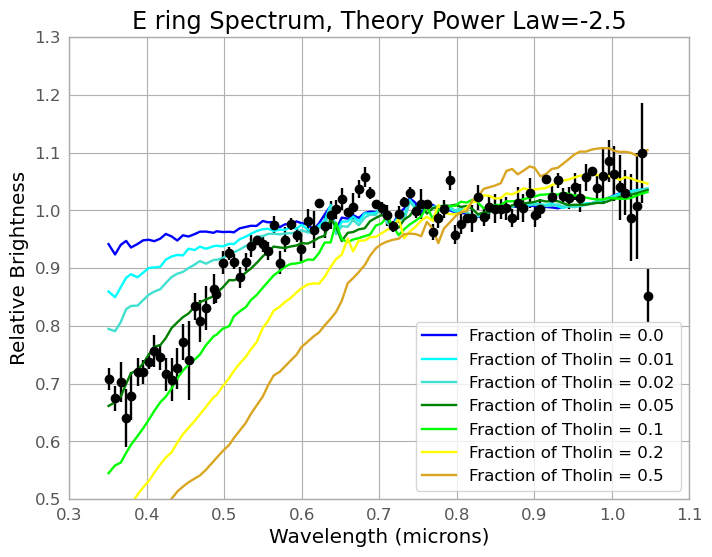

In [33]:
cols1=['blue','cyan','turquoise','green','lime','yellow','goldenrod']
foo=(wavex>0.7) & (wavex<0.9)
plt.errorbar(wavel, specezz/np.mean(specezz[foo]), yerr=errezz/np.mean(specezz[foo]), fmt='o', color='k')

for i in range(nf):
    plt.plot(wavex, specpredt[i,:]/np.mean(specpredt[i,foo]), color=cols1[i],
               label='Fraction of Tholin = '+str(fs[i]))
plt.xlim([0.3,1.1])
plt.ylim([0.5,1.3])
plt.legend()
plt.title('E ring Spectrum, Theory Power Law=-2.5')
plt.ylabel('Relative Brightness')
plt.xlabel('Wavelength (microns)')
plt.show()

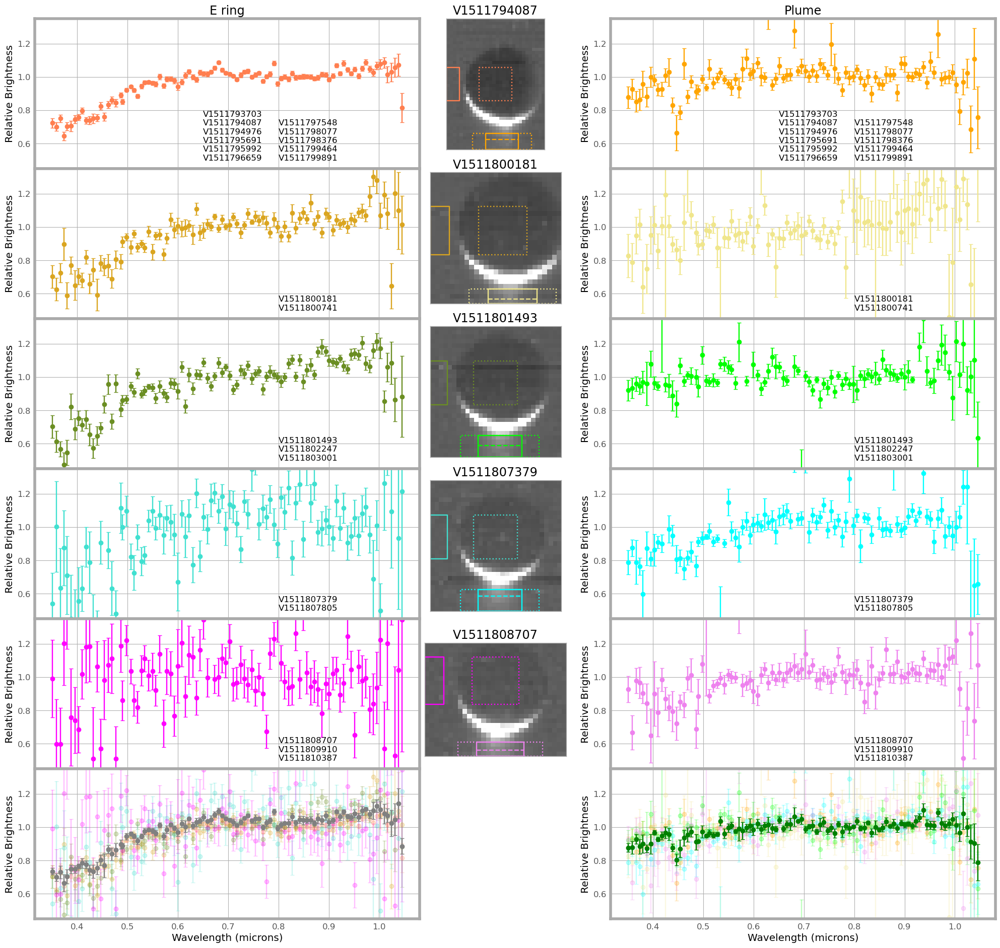

In [34]:
fig = plt.figure(figsize=(20, 20))
(leftfig, midfig, rightfig) = fig.subfigures(1,3, width_ratios=(3,1,3))
gs = leftfig.add_gridspec(6, hspace=0)
left_axs = gs.subplots(sharex=True)
mid_axs = midfig.subplots(6,1)
gs2 = rightfig.add_gridspec(6, hspace=0)
right_axs = gs2.subplots(sharex=True)
#cols=['lime','turquoise','cyan','magenta','violet']

cols=['coral','goldenrod','olivedrab','turquoise','magenta']
cols2=['orange','khaki','lime','cyan','violet']
left_axs[0].set_title('E ring')
right_axs[0].set_title('Plume')
for i in range(6):
    for axis in ['top','bottom','left','right']:
        left_axs[i].spines[axis].set_linewidth(4)
        right_axs[i].spines[axis].set_linewidth(4)
    left_axs[i].set_ylabel('Relative Brightness')
    left_axs[i].set_ylim([0.45,1.35])
    right_axs[i].set_ylabel('Relative Brightness')
    right_axs[i].set_ylim([0.45,1.35])



for i in range(5):
    mid_axs[i].grid(False)
    mid_axs[i].set_xticks([])
    mid_axs[i].set_yticks([])
    if i ==0:
        dat=readsav('S16_ENC/'+files003[1])
        lab=filex003[1]
        lab2a=filex003[0]+'\n'+filex003[1]+'\n'+filex003[2]+'\n'+filex003[3]+'\n'+filex003[4]+'\n'+filex003[5]
        lab2=filex003[6]+'\n'+filex003[7]+'\n'+filex003[8]+'\n'+filex003[9]+'\n'+filex003[10]
        exy=[15,25]
        px=17
        cy=19
        ranges=range003
    if i ==1:
        dat=readsav('S16_ENC/'+files010[0])
        lab=filex010[0]
        lab2=filex010[0]+'\n'+filex010[1]
        exy=[10,20]
        px=17
        cy=15.5
        ranges=range010
    if i ==2:
        dat=readsav('S16_ENC/'+files001[0])
        lab=filex001[0]
        lab2=filex001[0]+'\n'+filex001[1]+'\n'+filex001[2]
        exy=[12,22]
        px=16
        cy=17
        ranges=range001
    if i ==3:
        dat=readsav('S16_ENC/'+files011[0])
        lab=filex011[0]
        lab2=filex011[0]+'\n'+filex011[1]
        exy=[12,22]
        px=16
        cy=16.5
        ranges=range011
    if i ==4:
        dat=readsav('S16_ENC/'+files007[0])
        lab=filex007[0]
        lab2=filex007[0]+'\n'+filex007[1]+'\n'+filex007[2]
        exy=[11,21]
        px=16
        cy=14
        ranges=range007


    qubc=dat.qub[:,0:96,:]
    qubx=np.zeros([len(qubc[:,0,0]),len(qubc[0,:,0]),len(qubc[0,0,:])])
    for j in range(96):
        for k in range(len(qubc[0,0,:])):
            qubx[:,j,k]=qubc[:,j,k]-np.mean(qubc[0:3,j,k])
    nnw=96
    x=np.linspace(0,19,20)
    zar=-(x-cy)*.5e-3/3*ranges[0]-250
    fooz=(zar>0.0)
    zzr=zar-zar
    zzr[fooz]=np.sqrt(zar[fooz])/np.sqrt(250+zar[fooz])
    fooz=(zzr>0.3)
    yx=np.max(x[fooz])
    yxp=0
    if np.max(zzr)>0.7:
        fooz=(zzr>0.7)
        yxp=np.max(x[fooz])
    fooz=(zzr>0.5)
    zn=250/(1/.25-1)
    yx2=cy-(zn+250)*3/.5e-3/ranges[0]
    #zzx=np.sqrt(zarx)/np.sqrt(250.+zarx)
    mid_axs[i].imshow(np.transpose(np.mean(qubx,axis=1)), origin='lower', vmin=-.002,vmax=.0035, cmap='gray')
    mid_axs[i].set_title(lab)
    mid_axs[i].plot(np.array([0,4,4,0,0])-.5,np.array([exy[0],exy[0],exy[1],exy[1],exy[0]])-.5, color=cols[i])
    mid_axs[i].plot(np.array([10,20,20,10,10])-.5,np.array([exy[0],exy[0],exy[1],exy[1],exy[0]])-.5, ':',color=cols[i])
    mid_axs[i].plot(np.array([px-5,px+5,px+5,px-5,px-5])-.5,np.array([yxp,yxp,yx,yx,yxp])-.5,color=cols2[i])
    mid_axs[i].plot(np.array([px-9,px+9,px+9,px-9,px-9])-.5,np.array([yxp,yxp,yx,yx,yxp])-.5, ':',color=cols2[i])
    mid_axs[i].plot(np.array([px-5,px+5])-.5,np.array([yx2,yx2])-.5, '--',color=cols2[i])
    right_axs[i].text(0.8,0.5,lab2)
    left_axs[i].text(0.8,0.5,lab2)
    if i==0:
        right_axs[i].text(0.65,0.5,lab2a)
        left_axs[i].text(0.65,0.5,lab2a)
mid_axs[5].grid(False)
mid_axs[5].set_xticks([])
mid_axs[5].set_yticks([])
mid_axs[5].imshow(np.transpose(np.mean(qubx,axis=1)), origin='lower', vmin=-1,vmax=-0.5, cmap='gray')
for axis in ['top','bottom','left','right']:
        mid_axs[5].spines[axis].set_linewidth(0)
        mid_axs[5].spines[axis].set_linewidth(0)

for i in range(5):
    right_axs[i].errorbar(wavel, specoutx[i,1,:]/np.median(specoutx[i,1,:]), yerr=erroutx[i,1,:]/np.median(specoutx[i,1,:]), 
                    fmt='o', color=cols2[i], capsize=3)

    right_axs[5].errorbar(wavel, specoutx[i,1,:]/np.median(specoutx[i,1,:]), 
                    yerr=erroutx[i,1,:]/np.median(specoutx[i,1,:]), fmt='o', color=cols2[i], alpha=.25, capsize=3)
right_axs[5].errorbar(wavel, specouty[1,:], yerr=errouty[1,:], fmt='o', color='g', capsize=3.0, zorder=10)
right_axs[5].set_xlabel('Wavelength (microns)')

for i in range(5):
    left_axs[i].errorbar(wavel, specez[i,:]/np.median(specez[i,:]), yerr=errez[i,:]/np.median(specez[i,:]), 
                    fmt='o', color=cols[i], capsize=3)
    left_axs[5].errorbar(wavel, specez[i,:]/np.median(specez[i,:]), 
                    yerr=errez[i,:]/np.median(specez[i,:]), fmt='o', color=cols[i], alpha=.25, capsize=3)
left_axs[5].errorbar(wavel, specezz, yerr=errezz, fmt='o', color='gray', capsize=3.0, zorder=10)
left_axs[5].set_xlabel('Wavelength (microns)')

#ax2.plot(np.array([-5.5,5.5,5.5,-5.5,-5.5])+17,np.array([-0.5,-0.5,3.5,3.5,-0.5])+3, color=cols[0])
#ax2.text(len(qubc[:,0,0])*1.1,1,filex003[0]+'\n'+filex003[1]+'\n'+filex003[2]+
#        '\n'+filex003[3]+'\n'+filex003[4]+'\n'+filex003[5])
fig.tight_layout()
leftfig.subplots_adjust(left=.1)
rightfig.subplots_adjust(left=.1)
plt.savefig('encplume_S16vimsspec_v2_comp_080425.pdf', bbox_inches='tight')

plt.show()

In [35]:
diameters=np.linspace(.1,5.1,101)*2
sizedists=diameters**(-2.5)
specpredt=np.zeros([4,nf,nnw])
specpredh=np.zeros([4,nf,nnw])
specpredc=np.zeros([4,nf,nnw])
powlaws=np.array([-1.5,-2.0,-2.0,-2.5])

for k in range(4):
    sizedists=diameters**(powlaws[k])
    for j in range(nf):
        print(j)
        for i in range(nnw):
            m=complex(nmixt[j,i],kmixt[j,i])
            theta1,SL, SR, SU =ps.SF_SD(m, wavex[i]*1000, diameters*1000, sizedists, 
                            minAngle=(20), maxAngle=(20.),
                            angularResolution =1.0, space='theta') 
            specpredt[k,j,i]=np.asarray(SU[0])*wavex[i]**2/(4*3.14159**2)

0
1
2
3
4
5
6
0
1
2
3
4
5
6
0
1
2
3
4
5
6
0
1
2
3
4
5
6


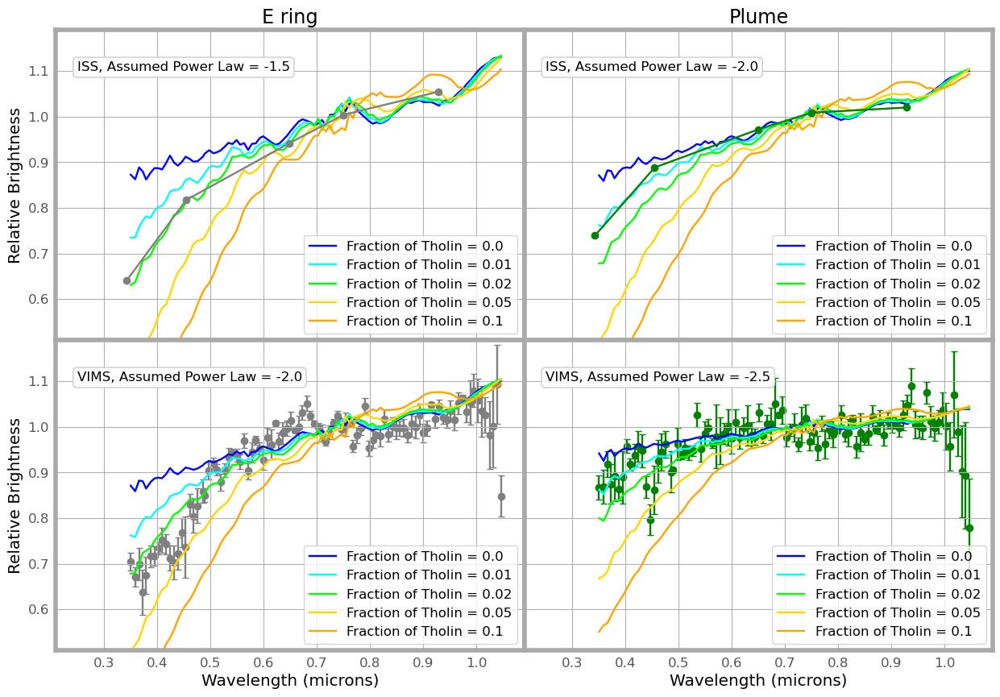

In [36]:
waveiss=np.array([0.928, 0.750, 0.649, 0.455, 0.343])
specisse=np.array([0.00102012, 0.0009712,  0.00091138, 0.00079079, 0.00062012])
specissp=np.array([0.00055295, 0.00054683, 0.00052681, 0.00048169, 0.00040097])
foo=(waveiss>0.6) & (waveiss<0.95)
specisse=specisse/np.mean(specisse[foo])
specissp=specissp/np.mean(specissp[foo])

fig = plt.figure(figsize=(15,10))
gs = fig.add_gridspec(2, 2, hspace=0, wspace=0)
axs = gs.subplots(sharex='col', sharey='row')
for i in range(2):
    for j in range(2):
        for axis in ['top','bottom','left','right']:
            axs[i,j].spines[axis].set_linewidth(4)
        axs[i,j].set_ylim([.51,1.19])
        axs[i,j].set_xlim([.21,1.09])
foo=(wavex>0.6) & (wavex<0.95)
axs[1,1].errorbar(wavel, specouty[1,:]/np.mean(specouty[1,foo]), 
                  yerr=errouty[1,:]/np.mean(specouty[1,foo]), fmt='o', color='g', capsize=3.0, zorder=0)
axs[1,0].errorbar(wavel, specezz/np.mean(specezz[foo]), yerr=errezz/np.mean(specezz[foo]), 
                  fmt='o', color='gray', capsize=3.0, zorder=0)
cols1=['blue','cyan','lime','gold','orange']

for i in range(5):
    axs[0,0].plot(wavex, specpredt[0,i,:]/np.mean(specpredt[0,i,foo]), '-',color=cols1[i],
               label='Fraction of Tholin = '+str(fs[i]))
    axs[0,1].plot(wavex, specpredt[1,i,:]/np.mean(specpredt[1,i,foo]), '-',color=cols1[i],
               label='Fraction of Tholin = '+str(fs[i]))
    axs[1,0].plot(wavex, specpredt[2,i,:]/np.mean(specpredt[2,i,foo]), '-',color=cols1[i],
               label='Fraction of Tholin = '+str(fs[i]))
    axs[1,1].plot(wavex, specpredt[3,i,:]/np.mean(specpredt[3,i,foo]), '-',color=cols1[i],
               label='Fraction of Tholin = '+str(fs[i]))
axs[0,0].legend()
axs[0,1].legend()
axs[1,0].legend()
axs[1,1].legend(loc='lower right')
props = dict(boxstyle='round', facecolor='white')
axs[0,0].text(0.25,1.1,'ISS, Assumed Power Law = '+str(powlaws[0]), bbox=props)
axs[0,1].text(0.25,1.1,'ISS, Assumed Power Law = '+str(powlaws[1]), bbox=props)
axs[1,0].text(0.25,1.1,'VIMS, Assumed Power Law = '+str(powlaws[2]), bbox=props)
axs[1,1].text(0.25,1.1,'VIMS, Assumed Power Law = '+str(powlaws[3]), bbox=props)
axs[0,0].set_title('E ring')
axs[0,1].set_title('Plume')

axs[0,0].plot(waveiss,specisse, 'o-', color='gray')
axs[0,1].plot(waveiss,specissp, 'o-', color='g')
axs[1,1].set_xlabel('Wavelength (microns)')
axs[1,0].set_xlabel('Wavelength (microns)')
axs[1,0].set_ylabel('Relative Brightness')
axs[0,0].set_ylabel('Relative Brightness')
plt.savefig('encplume_specsumcomp_081725.pdf', bbox_inches='tight')
plt.show()

In [37]:
diameters=np.linspace(.1,5.1,101)*2
specpredc=np.zeros([4,nf,nnw])
powlaws=np.array([-2.5,-2.5,-2.5,-2.5])
cutoffs=np.array([0.1,0.2,0.3,0.4,0.5,0.6,0.7])
for k in range(4):
    sizedists=diameters**(powlaws[k])
    for j in range(nf):
        print(j)
        sizedists[diameters/2<cutoffs[j]]=0
        for i in range(nnw):
            m=complex(nwx[i],kwx[i])
            theta1,SL, SR, SU =ps.SF_SD(m, wavex[i]*1000, diameters*1000, sizedists, 
                            minAngle=(20), maxAngle=(20.),
                            angularResolution =1.0, space='theta') 
            specpredc[k,j,i]=np.asarray(SU[0])*wavex[i]**2/(4*3.14159**2)


for k in range(4):
    sizedists=diameters**(powlaws[k])
    for j in range(nf):
        print(j)
        for i in range(nnw):
            m=complex(nmixt[j,i],kmixt[j,i])
            theta1,SL, SR, SU =ps.SF_SD(m, wavex[i]*1000, diameters*1000, sizedists, 
                            minAngle=(20), maxAngle=(20.),
                            angularResolution =1.0, space='theta') 
            specpredt[k,j,i]=np.asarray(SU[0])*wavex[i]**2/(4*3.14159**2)
  

0
1
2
3
4
5
6
0
1
2
3
4
5
6
0
1
2
3
4
5
6
0
1
2
3
4
5
6
0
1
2
3
4
5
6
0
1
2
3
4
5
6
0
1
2
3
4
5
6
0
1
2
3
4
5
6


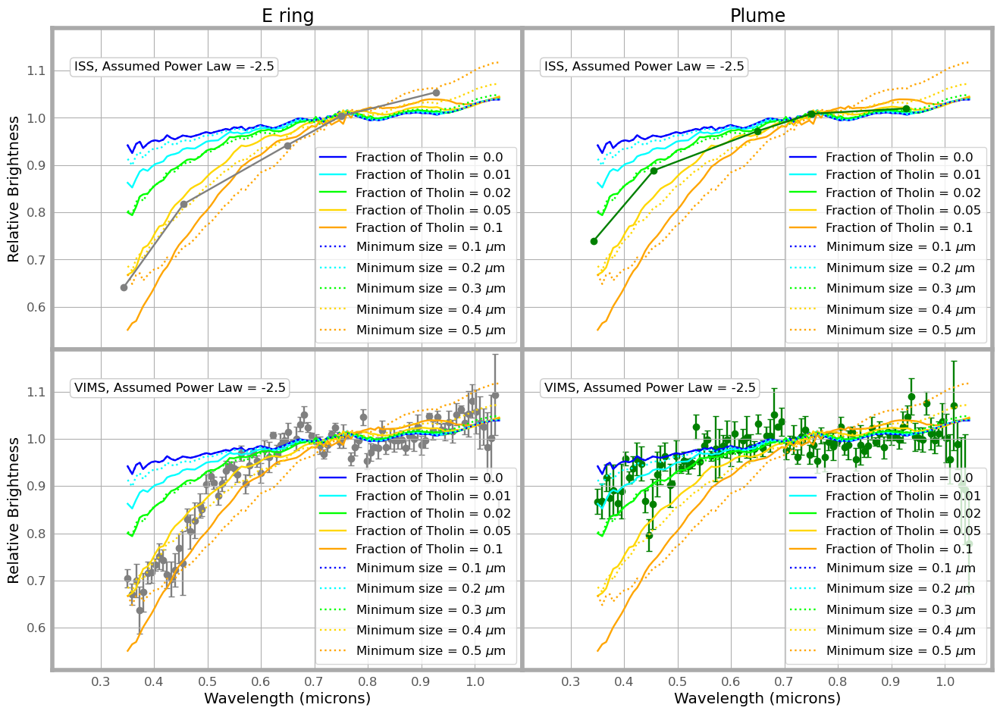

In [38]:
waveiss=np.array([0.928, 0.750, 0.649, 0.455, 0.343])
specisse=np.array([0.00102012, 0.0009712,  0.00091138, 0.00079079, 0.00062012])
specissp=np.array([0.00055295, 0.00054683, 0.00052681, 0.00048169, 0.00040097])
foo=(waveiss>0.6) & (waveiss<0.95)
specisse=specisse/np.mean(specisse[foo])
specissp=specissp/np.mean(specissp[foo])

fig = plt.figure(figsize=(16,11))
gs = fig.add_gridspec(2, 2, hspace=0, wspace=0)
axs = gs.subplots(sharex='col', sharey='row')
for i in range(2):
    for j in range(2):
        for axis in ['top','bottom','left','right']:
            axs[i,j].spines[axis].set_linewidth(4)
        axs[i,j].set_ylim([.51,1.19])
        axs[i,j].set_xlim([.21,1.09])
foo=(wavex>0.6) & (wavex<0.95)
axs[1,1].errorbar(wavel, specouty[1,:]/np.mean(specouty[1,foo]), 
                  yerr=errouty[1,:]/np.mean(specouty[1,foo]), fmt='o', color='g', capsize=3.0, zorder=0)
axs[1,0].errorbar(wavel, specezz/np.mean(specezz[foo]), yerr=errezz/np.mean(specezz[foo]), 
                  fmt='o', color='gray', capsize=3.0, zorder=0)
cols1=['blue','cyan','lime','gold','orange']

for i in range(5):
    axs[0,0].plot(wavex, specpredt[0,i,:]/np.mean(specpredt[0,i,foo]), '-',color=cols1[i],
               label='Fraction of Tholin = '+str(fs[i]))
    axs[0,1].plot(wavex, specpredt[1,i,:]/np.mean(specpredt[1,i,foo]), '-',color=cols1[i],
               label='Fraction of Tholin = '+str(fs[i]))
    axs[1,0].plot(wavex, specpredt[2,i,:]/np.mean(specpredt[2,i,foo]), '-',color=cols1[i],
               label='Fraction of Tholin = '+str(fs[i]))
    axs[1,1].plot(wavex, specpredt[3,i,:]/np.mean(specpredt[3,i,foo]), '-',color=cols1[i],
               label='Fraction of Tholin = '+str(fs[i]))
for i in range(5):
    axs[0,0].plot(wavex, specpredc[0,i,:]/np.mean(specpredc[0,i,foo]), ':',color=cols1[i],
               label='Minimum size = '+str(cutoffs[i])+' $\mu$m')
    axs[0,1].plot(wavex, specpredc[1,i,:]/np.mean(specpredc[1,i,foo]), ':',color=cols1[i],
               label='Minimum size = '+str(cutoffs[i])+' $\mu$m')
    axs[1,0].plot(wavex, specpredc[2,i,:]/np.mean(specpredc[2,i,foo]), ':',color=cols1[i],
               label='Minimum size = '+str(cutoffs[i])+' $\mu$m')
    axs[1,1].plot(wavex, specpredc[3,i,:]/np.mean(specpredc[3,i,foo]), ':',color=cols1[i],
               label='Minimum size = '+str(cutoffs[i])+' $\mu$m')

axs[0,0].legend()
axs[0,1].legend()
axs[1,0].legend()
axs[1,1].legend(loc='lower right')
props = dict(boxstyle='round', facecolor='white')
axs[0,0].text(0.25,1.1,'ISS, Assumed Power Law = '+str(powlaws[0]), bbox=props)
axs[0,1].text(0.25,1.1,'ISS, Assumed Power Law = '+str(powlaws[1]), bbox=props)
axs[1,0].text(0.25,1.1,'VIMS, Assumed Power Law = '+str(powlaws[2]), bbox=props)
axs[1,1].text(0.25,1.1,'VIMS, Assumed Power Law = '+str(powlaws[3]), bbox=props)
axs[0,0].set_title('E ring')
axs[0,1].set_title('Plume')

axs[0,0].plot(waveiss,specisse, 'o-', color='gray')
axs[0,1].plot(waveiss,specissp, 'o-', color='g')
axs[1,1].set_xlabel('Wavelength (microns)')
axs[1,0].set_xlabel('Wavelength (microns)')
axs[1,0].set_ylabel('Relative Brightness')
axs[0,0].set_ylabel('Relative Brightness')
plt.savefig('encplume_specsumcomp_v2_081725.pdf', bbox_inches='tight')
plt.show()

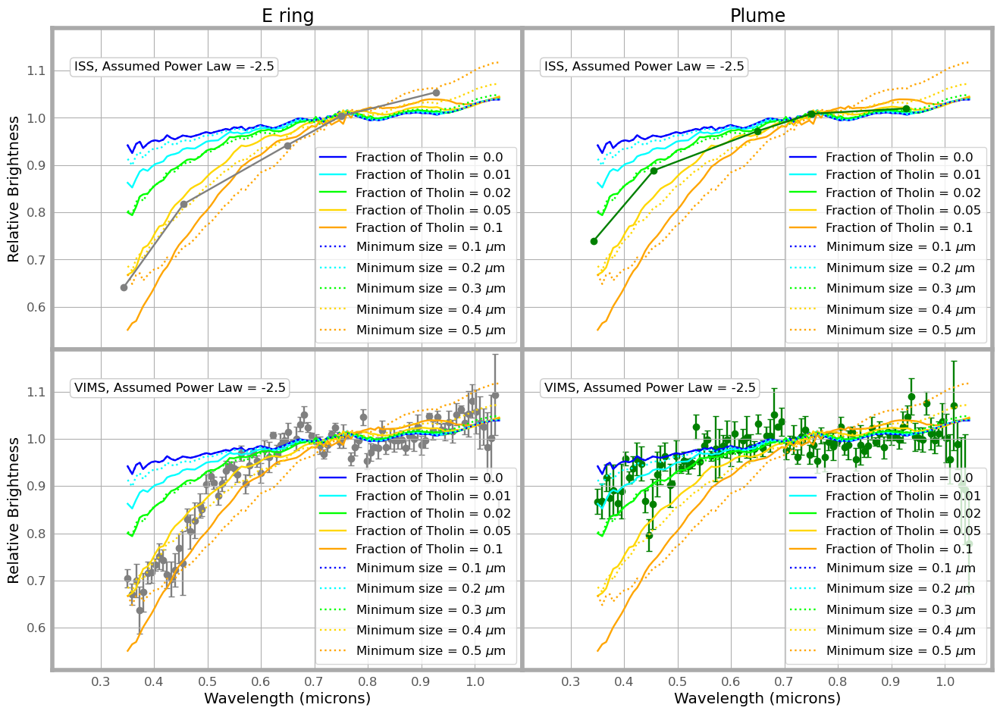

In [39]:
waveiss=np.array([0.928, 0.750, 0.649, 0.455, 0.343])
specisse=np.array([0.00102012, 0.0009712,  0.00091138, 0.00079079, 0.00062012])
specissp=np.array([0.00055295, 0.00054683, 0.00052681, 0.00048169, 0.00040097])
foo=(waveiss>0.6) & (waveiss<0.95)
specisse=specisse/np.mean(specisse[foo])
specissp=specissp/np.mean(specissp[foo])

fig = plt.figure(figsize=(16,11))
gs = fig.add_gridspec(2, 2, hspace=0, wspace=0)
axs = gs.subplots(sharex='col', sharey='row')
for i in range(2):
    for j in range(2):
        for axis in ['top','bottom','left','right']:
            axs[i,j].spines[axis].set_linewidth(4)
        axs[i,j].set_ylim([.51,1.19])
        axs[i,j].set_xlim([.21,1.09])
foo=(wavex>0.6) & (wavex<0.95)
axs[1,1].errorbar(wavel, specouty[1,:]/np.mean(specouty[1,foo]), 
                  yerr=errouty[1,:]/np.mean(specouty[1,foo]), fmt='o', color='g', capsize=3.0, zorder=0)
axs[1,0].errorbar(wavel, specezz/np.mean(specezz[foo]), yerr=errezz/np.mean(specezz[foo]), 
                  fmt='o', color='gray', capsize=3.0, zorder=0)
cols1=['blue','cyan','lime','gold','orange']

for i in range(5):
    axs[0,0].plot(wavex, specpredt[0,i,:]/np.mean(specpredt[0,i,foo]), '-',color=cols1[i],
               label='Fraction of Tholin = '+str(fs[i]))
    axs[0,1].plot(wavex, specpredt[1,i,:]/np.mean(specpredt[1,i,foo]), '-',color=cols1[i],
               label='Fraction of Tholin = '+str(fs[i]))
    axs[1,0].plot(wavex, specpredt[2,i,:]/np.mean(specpredt[2,i,foo]), '-',color=cols1[i],
               label='Fraction of Tholin = '+str(fs[i]))
    axs[1,1].plot(wavex, specpredt[3,i,:]/np.mean(specpredt[3,i,foo]), '-',color=cols1[i],
               label='Fraction of Tholin = '+str(fs[i]))
for i in range(5):
    axs[0,0].plot(wavex, specpredc[0,i,:]/np.mean(specpredc[0,i,foo]), ':',color=cols1[i],
               label='Minimum size = '+str(cutoffs[i])+' $\mu$m')
    axs[0,1].plot(wavex, specpredc[1,i,:]/np.mean(specpredc[1,i,foo]), ':',color=cols1[i],
               label='Minimum size = '+str(cutoffs[i])+' $\mu$m')
    axs[1,0].plot(wavex, specpredc[2,i,:]/np.mean(specpredc[2,i,foo]), ':',color=cols1[i],
               label='Minimum size = '+str(cutoffs[i])+' $\mu$m')
    axs[1,1].plot(wavex, specpredc[3,i,:]/np.mean(specpredc[3,i,foo]), ':',color=cols1[i],
               label='Minimum size = '+str(cutoffs[i])+' $\mu$m')

axs[0,0].legend()
axs[0,1].legend()
axs[1,0].legend()
axs[1,1].legend(loc='lower right')
props = dict(boxstyle='round', facecolor='white')
axs[0,0].text(0.25,1.1,'ISS, Assumed Power Law = '+str(powlaws[0]), bbox=props)
axs[0,1].text(0.25,1.1,'ISS, Assumed Power Law = '+str(powlaws[1]), bbox=props)
axs[1,0].text(0.25,1.1,'VIMS, Assumed Power Law = '+str(powlaws[2]), bbox=props)
axs[1,1].text(0.25,1.1,'VIMS, Assumed Power Law = '+str(powlaws[3]), bbox=props)
axs[0,0].set_title('E ring')
axs[0,1].set_title('Plume')

axs[0,0].plot(waveiss,specisse, 'o-', color='gray')
axs[0,1].plot(waveiss,specissp, 'o-', color='g')
axs[1,1].set_xlabel('Wavelength (microns)')
axs[1,0].set_xlabel('Wavelength (microns)')
axs[1,0].set_ylabel('Relative Brightness')
axs[0,0].set_ylabel('Relative Brightness')
plt.savefig('encplume_specsumcomp_v3_081725.pdf', bbox_inches='tight')
plt.show()